In [ ]:
# import os
# os.environ["CUDA_VISIBLE_DEVICES"] = "-1"  # Disable GPU

In [ ]:
#connect to the file on drive
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
#pip install seaborn

In [ ]:
#pip install scikit-learn

In [ ]:
#Import neccesary libraries
import os
import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#import sweetviz as sv
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [ ]:
# pip install sweetviz

In [ ]:
#pip install openpyxl

# SOLAR STATION 1

In [ ]:
# The line of code below reads the csv file into a pandas DataFrame
solar1_df = pd.read_excel('/content/drive/MyDrive/FINAL PROJECT/Solar station site 1 (Nominal capacity-50MW).xlsx')

#print the data frame
solar1_df.head()

,Time(year-month-day h:m:s),Total solar irradiance (W/m2),Direct normal irradiance (W/m2),Global horizontal irradiance (W/m2),Air temperature (°C),Atmosphere (hpa),Relative humidity (%),Power (MW)
0,2019-01-01 00:00:00,0,0,0,-11.7,930.5,39.1,0.0
1,2019-01-01 00:15:00,0,0,0,-11.8,930.5,39.3,0.0
2,2019-01-01 00:30:00,0,0,0,-11.4,930.5,39.0,0.0
3,2019-01-01 00:45:00,0,0,0,-11.5,930.5,38.0,0.0
4,2019-01-01 01:00:00,0,0,0,-11.5,930.4,38.9,0.0


In [ ]:
# solar1_df = pd.read_excel("Solar station site 1 (Nominal capacity-50MW).xlsx")

# #print the data frame
# solar1_df.head()

### EXPLORATORY DATA ANALYSIS

In [ ]:
# Rename columns for easier access
solar1_df.columns = ['Date_Time', 'Total_Solar_Irradiance(W/m2)', 'Direct_Normal_Irradiance(W/m2)', 'Global_Horizontal_Irradiance(W/m2)',
                'Air_Temperature(°C)', 'Atmosphere(hpa)', 'Relative_Humidity(%)', 'Power(MW)']

In [ ]:
solar1_df.isna().sum()

,0
Date_Time,0
Total_Solar_Irradiance(W/m2),0
Direct_Normal_Irradiance(W/m2),0
Global_Horizontal_Irradiance(W/m2),0
Air_Temperature(°C),0
Atmosphere(hpa),0
Relative_Humidity(%),0
Power(MW),0


In [ ]:
solar1_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70176 entries, 0 to 70175
Data columns (total 8 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Date_Time                           70176 non-null  object 
 1   Total_Solar_Irradiance(W/m2)        70176 non-null  int64  
 2   Direct_Normal_Irradiance(W/m2)      70176 non-null  int64  
 3   Global_Horizontal_Irradiance(W/m2)  70176 non-null  int64  
 4   Air_Temperature(°C)                 70176 non-null  float64
 5   Atmosphere(hpa)                     70176 non-null  float64
 6   Relative_Humidity(%)                70176 non-null  float64
 7   Power(MW)                           70176 non-null  float64
dtypes: float64(4), int64(3), object(1)
memory usage: 4.3+ MB


In [ ]:
#convert the specified time column to data time
solar1_df["Date_Time"] = pd.to_datetime(solar1_df["Date_Time"], errors = 'coerce')

In [ ]:
solar1_df.set_index('Date_Time',inplace = True)

In [ ]:
solar1_df.head()

,Total_Solar_Irradiance(W/m2),Direct_Normal_Irradiance(W/m2),Global_Horizontal_Irradiance(W/m2),Air_Temperature(°C),Atmosphere(hpa),Relative_Humidity(%),Power(MW)
Date_Time,,,,,,,
2019-01-01 00:00:00,0,0,0,-11.7,930.5,39.1,0.0
2019-01-01 00:15:00,0,0,0,-11.8,930.5,39.3,0.0
2019-01-01 00:30:00,0,0,0,-11.4,930.5,39.0,0.0
2019-01-01 00:45:00,0,0,0,-11.5,930.5,38.0,0.0
2019-01-01 01:00:00,0,0,0,-11.5,930.4,38.9,0.0


In [ ]:
solar1_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 70176 entries, 2019-01-01 00:00:00 to 2020-12-31 23:45:00
Data columns (total 7 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Total_Solar_Irradiance(W/m2)        70176 non-null  int64  
 1   Direct_Normal_Irradiance(W/m2)      70176 non-null  int64  
 2   Global_Horizontal_Irradiance(W/m2)  70176 non-null  int64  
 3   Air_Temperature(°C)                 70176 non-null  float64
 4   Atmosphere(hpa)                     70176 non-null  float64
 5   Relative_Humidity(%)                70176 non-null  float64
 6   Power(MW)                           70176 non-null  float64
dtypes: float64(4), int64(3)
memory usage: 4.3 MB


In [ ]:
solar1_df.duplicated().any()

True

In [ ]:
solar1_df[solar1_df.duplicated()]

,Total_Solar_Irradiance(W/m2),Direct_Normal_Irradiance(W/m2),Global_Horizontal_Irradiance(W/m2),Air_Temperature(°C),Atmosphere(hpa),Relative_Humidity(%),Power(MW)
Date_Time,,,,,,,
2019-01-01 20:45:00,0,0,0,-8.4,925.2,34.0,0.0
2019-01-02 02:15:00,0,0,0,-11.9,924.3,42.1,0.0
2019-02-08 04:00:00,0,0,0,-9.6,924.2,50.3,0.0
2019-02-08 23:30:00,0,0,0,-8.5,924.9,26.3,0.0
2019-02-22 02:45:00,0,1,0,0.8,916.5,21.8,0.0
...,...,...,...,...,...,...,...
2020-12-12 20:30:00,0,0,0,-8.2,924.7,14.9,0.0
2020-12-14 21:00:00,0,0,0,-8.2,927.8,21.0,0.0
2020-12-24 04:00:00,0,0,0,-12.9,925.0,51.1,0.0


In [ ]:
solar1_df.describe()

,Total_Solar_Irradiance(W/m2),Direct_Normal_Irradiance(W/m2),Global_Horizontal_Irradiance(W/m2),Air_Temperature(°C),Atmosphere(hpa),Relative_Humidity(%),Power(MW)
count,70176.000000,70176.000000,70176.000000,70176.000000,70176.000000,70176.000000,70176.000000
mean,266.051000,93.161465,67.553836,13.042668,912.507584,650.699825,9.669417
std,367.987727,200.823766,111.273140,14.702066,30.852596,1924.389337,13.705175
min,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,-99.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,905.700000,9.100000,0.000000
50%,5.000000,1.000000,4.000000,15.000000,913.300000,21.000000,0.000000
75%,540.000000,36.000000,97.000000,25.300000,920.200000,43.800000,18.794616
max,1359.000000,980.000000,989.000000,41.200000,936.300000,6553.500000,48.321730


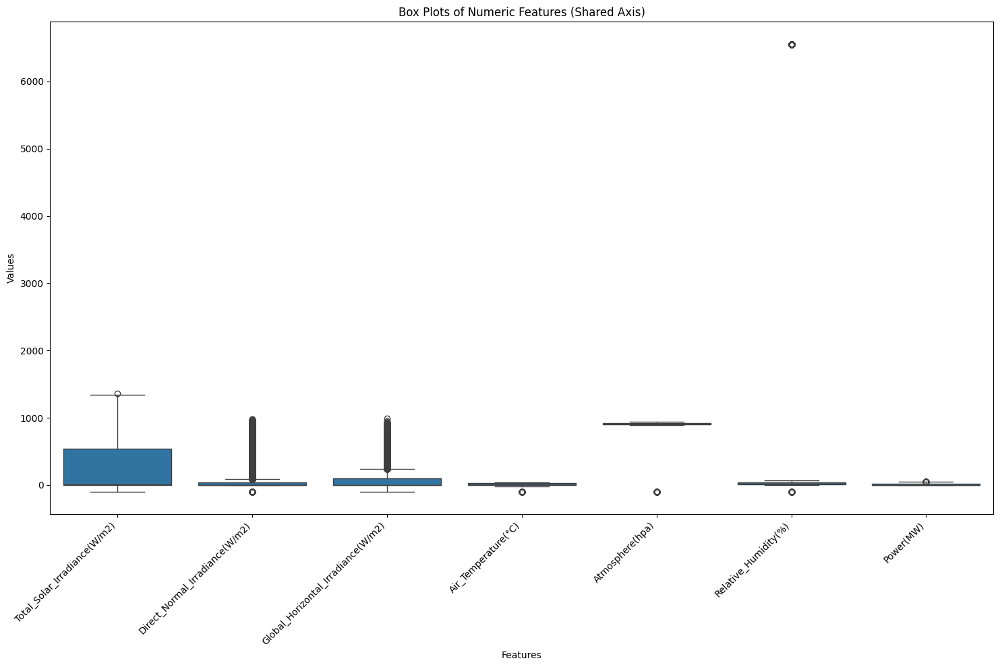

In [ ]:
# Select only the numeric columns
numeric_df = solar1_df.select_dtypes(include=[np.number])

# Melt the DataFrame to create a long format suitable for seaborn
melted_df = pd.melt(numeric_df)

# Create the box plot
plt.figure(figsize=(15, 10))
sns.boxplot(x='variable', y='value', data=melted_df)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Set labels and title
plt.xlabel('Features')
plt.ylabel('Values')
plt.title('Box Plots of Numeric Features (Shared Axis)')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

#### For better visibility of each features of the dataset

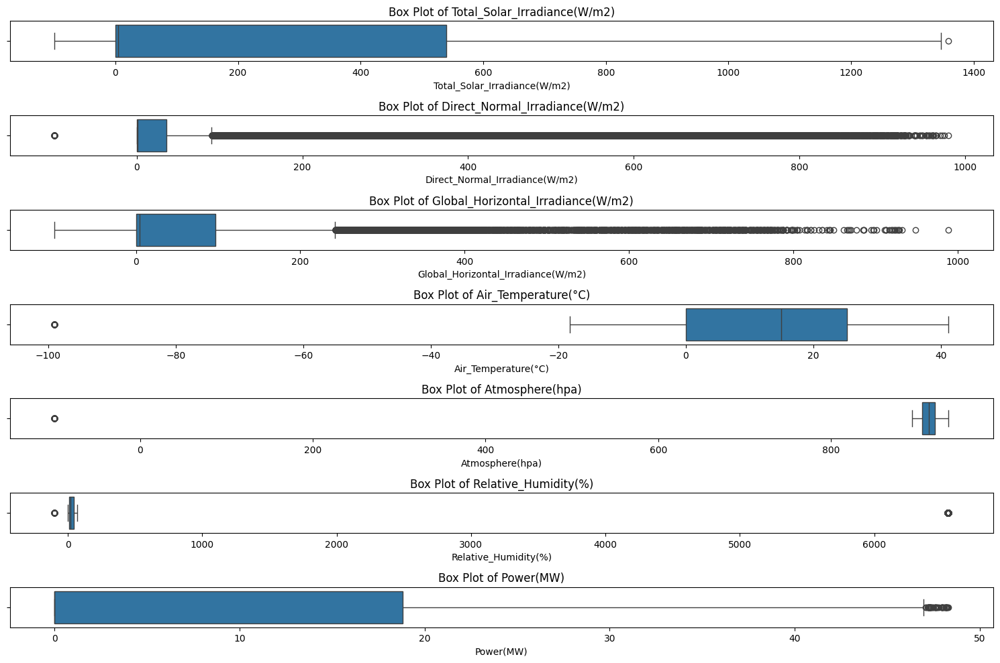

In [ ]:
# Set up the figure and axes for the box plots
plt.figure(figsize=(15, 10))

# Plotting each numeric column as a box plot
for i, column in enumerate(solar1_df.select_dtypes(include=[np.number]).columns):
    plt.subplot(len(solar1_df.select_dtypes(include=[np.number]).columns), 1, i + 1)
    sns.boxplot(x=solar1_df[column])
    plt.title(f'Box Plot of {column}')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

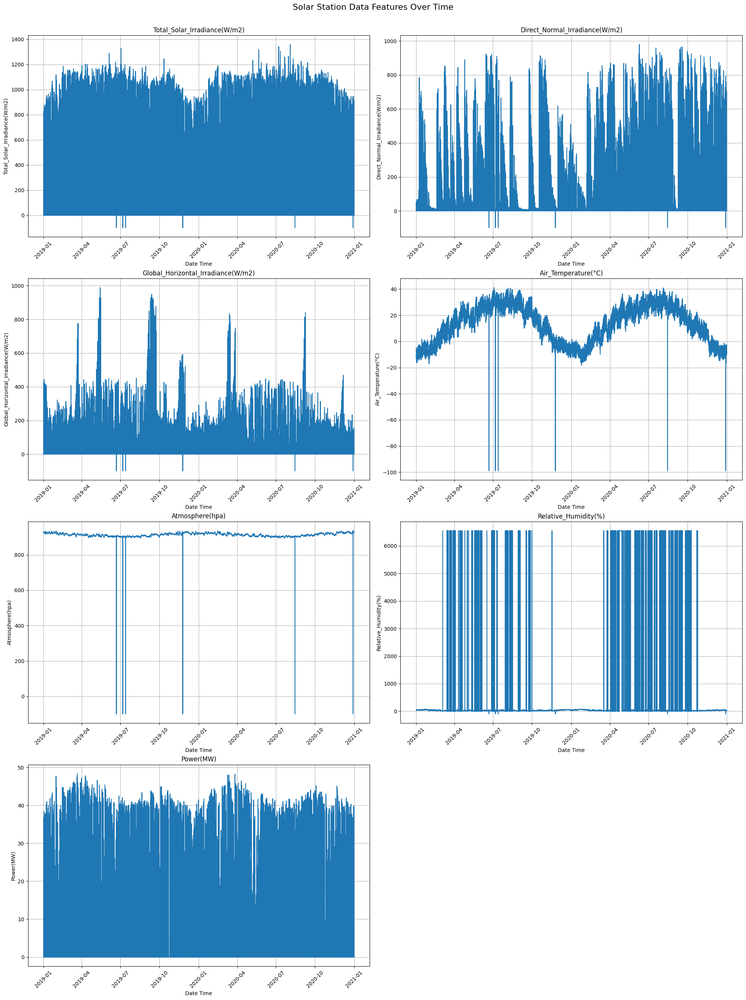

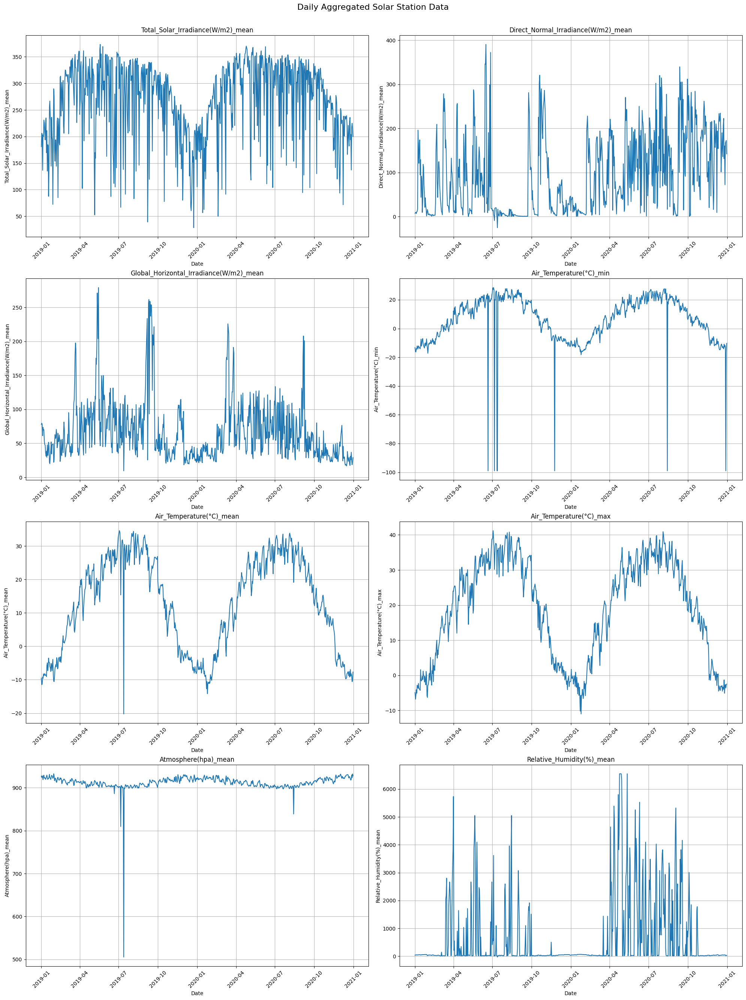

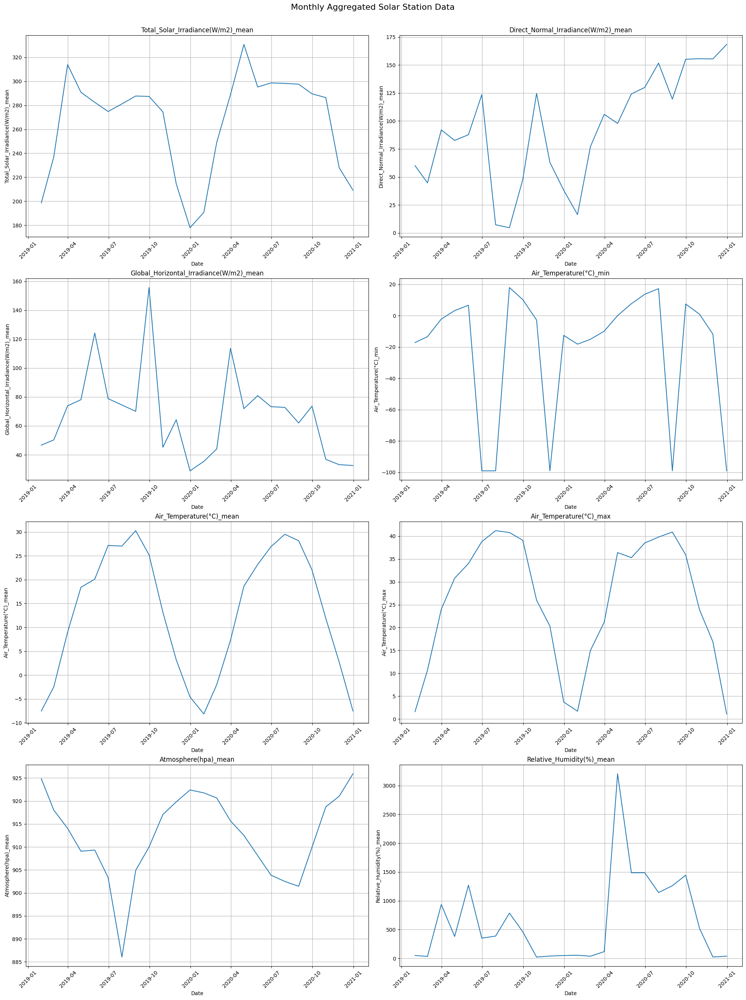

In [ ]:
def create_subplot(data, title, fig_size=(20, 28)):
    fig, axes = plt.subplots(4, 2, figsize=fig_size)
    fig.suptitle(title, fontsize=16, y=0.95)
    axes = axes.flatten()

    for i, column in enumerate(data.columns):
        if i < len(axes):
            sns.lineplot(data=data, x=data.index, y=column, ax=axes[i])
            axes[i].set_title(column)
            axes[i].set_xlabel('Date Time' if 'Time' in title else 'Date')
            axes[i].tick_params(axis='x', rotation=45)
            axes[i].grid(True)

    # Remove extra subplots if any
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

# 1. Original data plot
create_subplot(solar1_df, 'Solar Station Data Features Over Time')

# 2. Daily aggregations
daily_data = solar1_df.resample('D').agg({
    'Total_Solar_Irradiance(W/m2)': 'mean',
    'Direct_Normal_Irradiance(W/m2)': 'mean',
    'Global_Horizontal_Irradiance(W/m2)': 'mean',
    'Air_Temperature(°C)': ['min', 'mean', 'max'],
    'Atmosphere(hpa)': 'mean',
    'Relative_Humidity(%)': 'mean',
    'Power(MW)': 'sum'
})

daily_data.columns = ['_'.join(col).strip() for col in daily_data.columns.values]
create_subplot(daily_data, 'Daily Aggregated Solar Station Data')

# 3. Monthly aggregations
monthly_data = solar1_df.resample('M').agg({
    'Total_Solar_Irradiance(W/m2)': 'mean',
    'Direct_Normal_Irradiance(W/m2)': 'mean',
    'Global_Horizontal_Irradiance(W/m2)': 'mean',
    'Air_Temperature(°C)': ['min', 'mean', 'max'],
    'Atmosphere(hpa)': 'mean',
    'Relative_Humidity(%)': 'mean',
    'Power(MW)': 'sum'
})

monthly_data.columns = ['_'.join(col).strip() for col in monthly_data.columns.values]
create_subplot(monthly_data, 'Monthly Aggregated Solar Station Data')

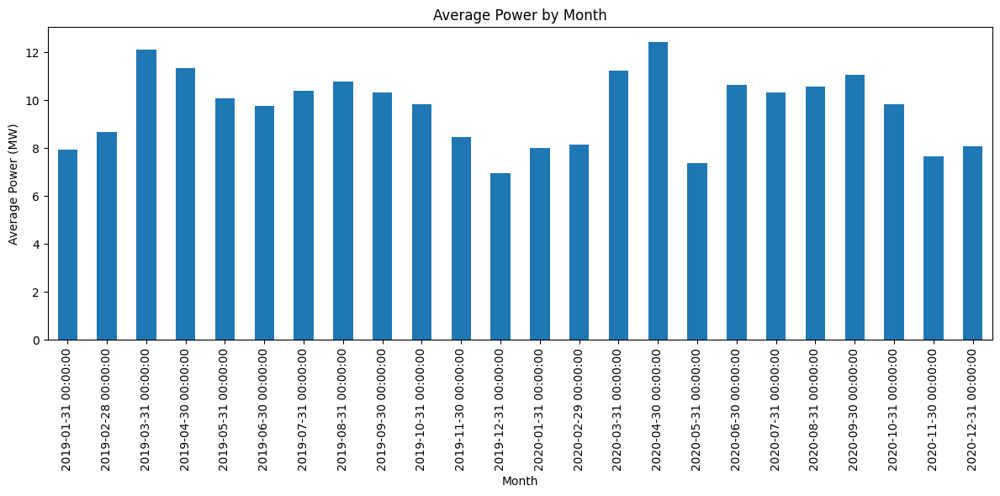

In [ ]:
# 1. Power by month of the year
monthly_power = solar1_df['Power(MW)'].resample('M').mean()
plt.figure(figsize=(12, 6))
monthly_power.plot(kind='bar')
plt.title('Average Power by Month')
plt.xlabel('Month')
plt.ylabel('Average Power (MW)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

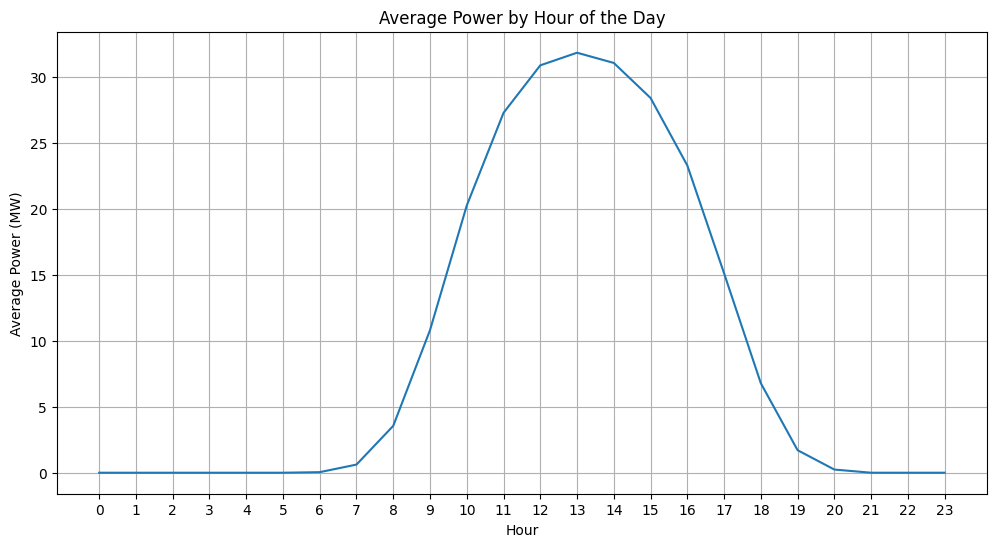

In [ ]:
# 2. Power by hour of the day
hourly_power = solar1_df['Power(MW)'].groupby(solar1_df.index.hour).mean()
plt.figure(figsize=(12, 6))
hourly_power.plot(kind='line')
plt.title('Average Power by Hour of the Day')
plt.xlabel('Hour')
plt.ylabel('Average Power (MW)')
plt.xticks(range(0, 24))
plt.grid(True)
plt.show()

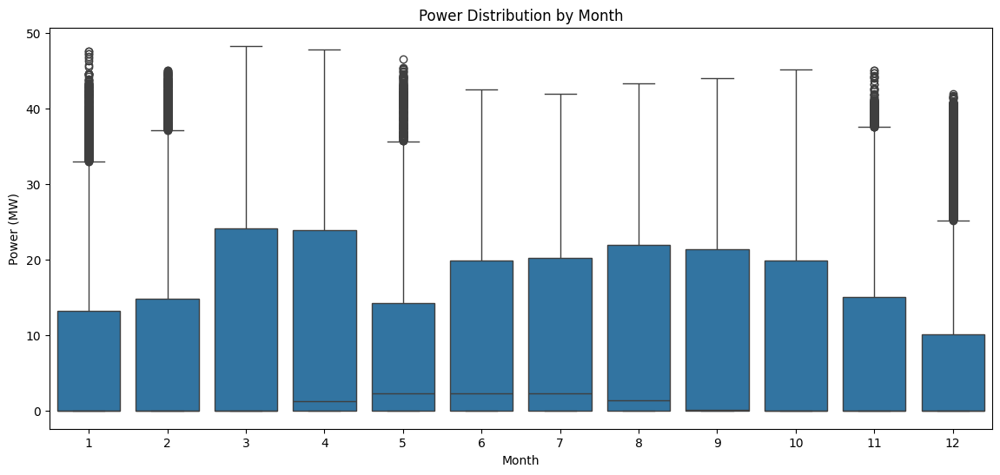

In [ ]:
# 3. Box plot: Power distribution by month
plt.figure(figsize=(14, 6))
sns.boxplot(x=solar1_df.index.month, y=solar1_df['Power(MW)'])
plt.title('Power Distribution by Month')
plt.xlabel('Month')
plt.ylabel('Power (MW)')
plt.show()

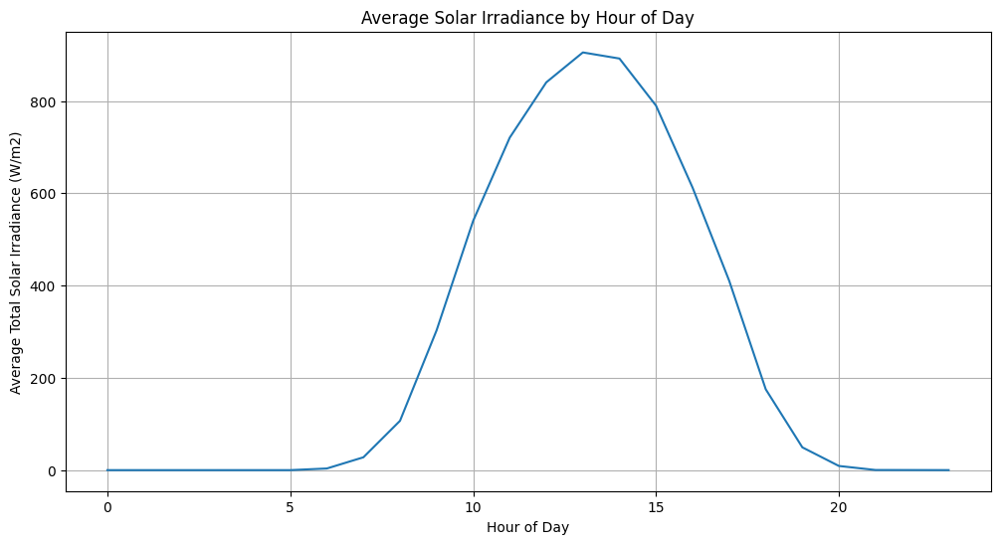

In [ ]:
# 4. Solar irradiance vs. time of day
plt.figure(figsize=(12, 6))
solar1_df.groupby(solar1_df.index.hour)['Total_Solar_Irradiance(W/m2)'].mean().plot()
plt.title('Average Solar Irradiance by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Total Solar Irradiance (W/m2)')
plt.grid(True)
plt.show()

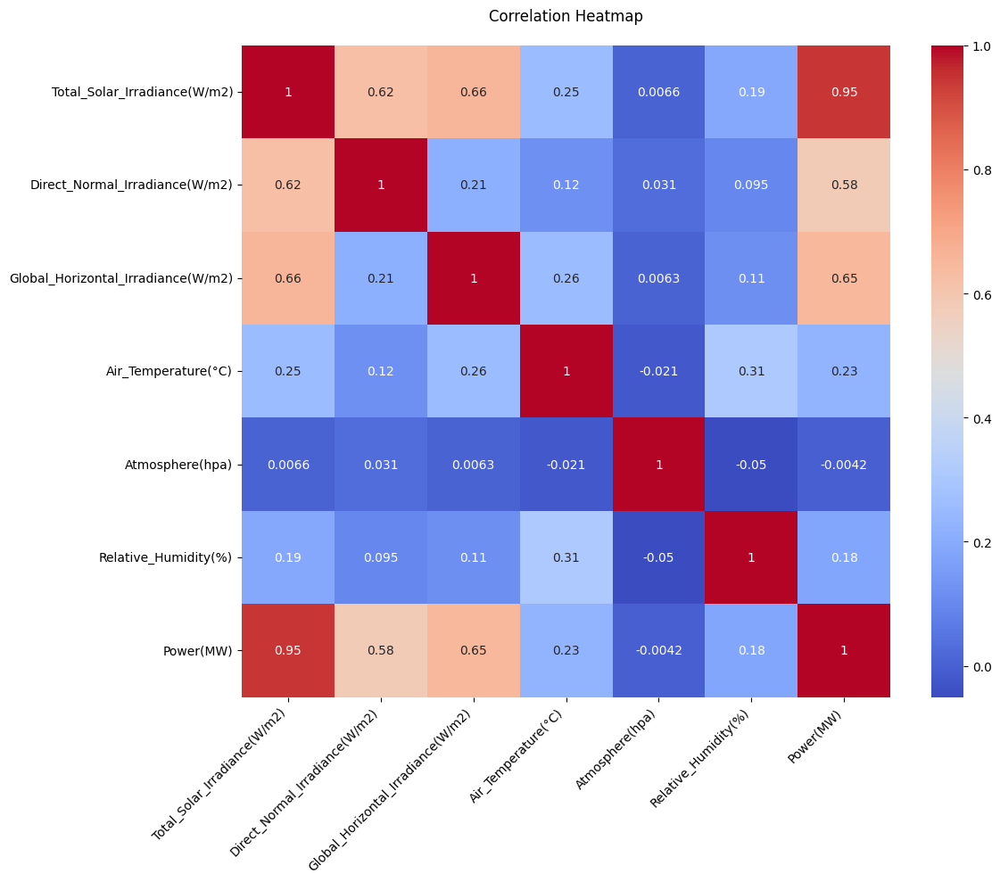

In [ ]:
#5. Calculate the correlation matrix
correlation_matrix = solar1_df.corr()

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Set the title
plt.title('Correlation Heatmap', pad=20)  # Added padding to prevent overlap with rotated labels

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')  # Rotate by 45 degrees and align to the right

# Adjust layout to prevent cutting off labels
plt.tight_layout()

# Show the plot
plt.show()

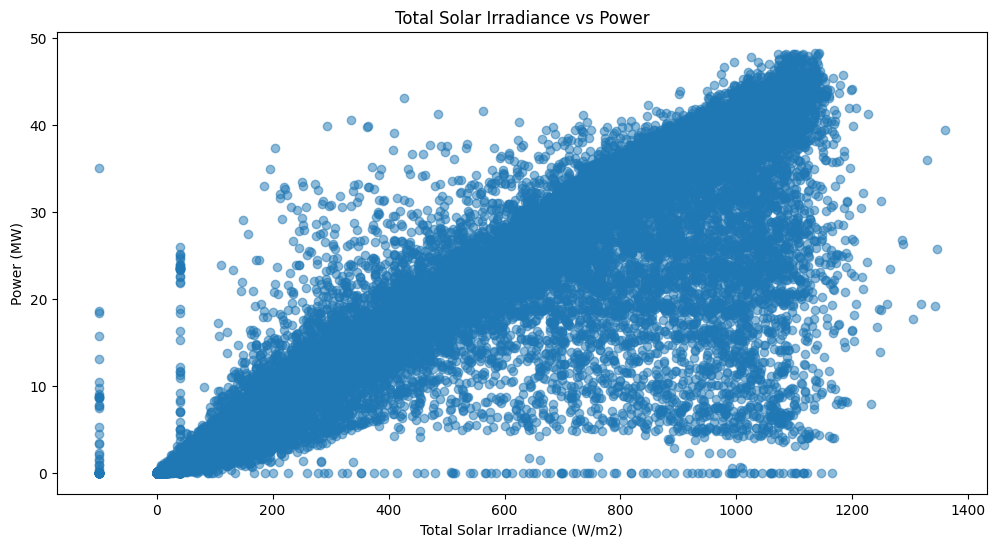

In [ ]:
# 6. Scatter plot: Total solar irradiance vs Power
plt.figure(figsize=(12, 6))
plt.scatter(solar1_df['Total_Solar_Irradiance(W/m2)'], solar1_df['Power(MW)'], alpha=0.5)
plt.title('Total Solar Irradiance vs Power')
plt.xlabel('Total Solar Irradiance (W/m2)')
plt.ylabel('Power (MW)')
plt.show()

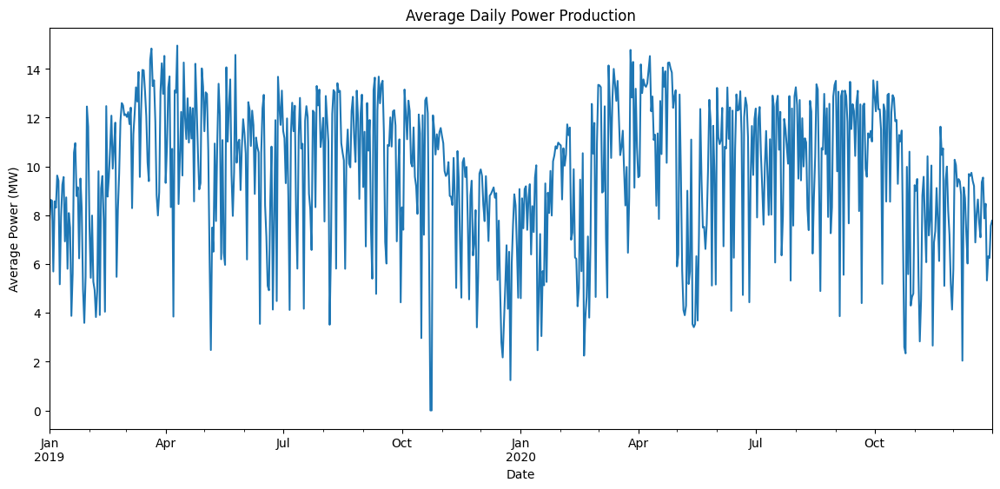

In [ ]:
# 7. Line plot: Average daily power production
daily_power = solar1_df['Power(MW)'].resample('D').mean()
plt.figure(figsize=(14, 6))
daily_power.plot(kind='line')
plt.title('Average Daily Power Production')
plt.xlabel('Date')
plt.ylabel('Average Power (MW)')
plt.show()

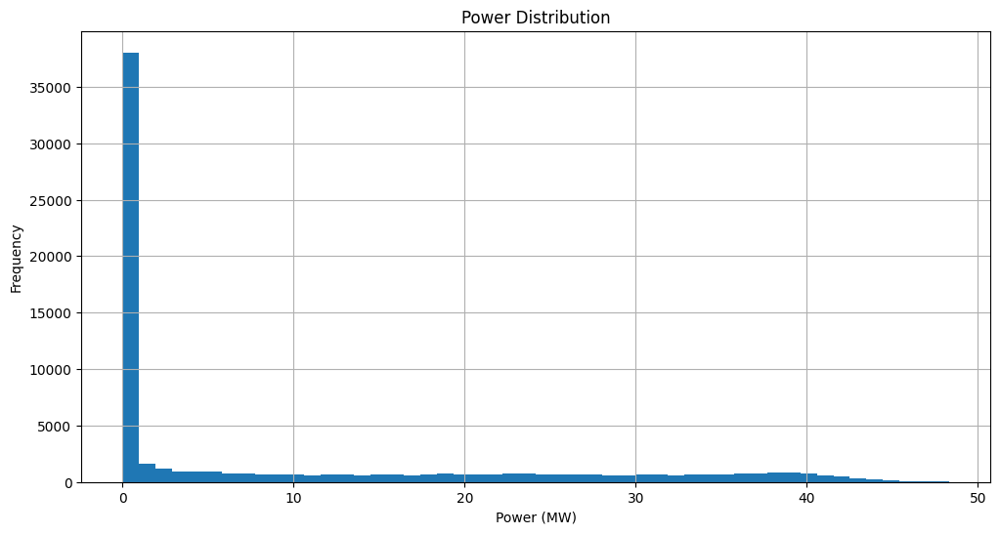

In [ ]:
# 8. Histogram: Power distribution
plt.figure(figsize=(12, 6))
solar1_df['Power(MW)'].hist(bins=50)
plt.title('Power Distribution')
plt.xlabel('Power (MW)')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# 9. Summary statistics
summary_stats = solar1_df.describe()
print("Summary Statistics:")
print(summary_stats)

Summary Statistics:
       Total_Solar_Irradiance(W/m2)  Direct_Normal_Irradiance(W/m2)  \
count                  70176.000000                    70176.000000   
mean                     266.051000                       93.161465   
std                      367.987727                      200.823766   
min                      -99.000000                      -99.000000   
25%                        0.000000                        0.000000   
50%                        5.000000                        1.000000   
75%                      540.000000                       36.000000   
max                     1359.000000                      980.000000   

       Global_Horizontal_Irradiance(W/m2)  Air_Temperature(°C)  \
count                        70176.000000         70176.000000   
mean                            67.553836            13.042668   
std                            111.273140            14.702066   
min                            -99.000000           -99.000000   
25%       

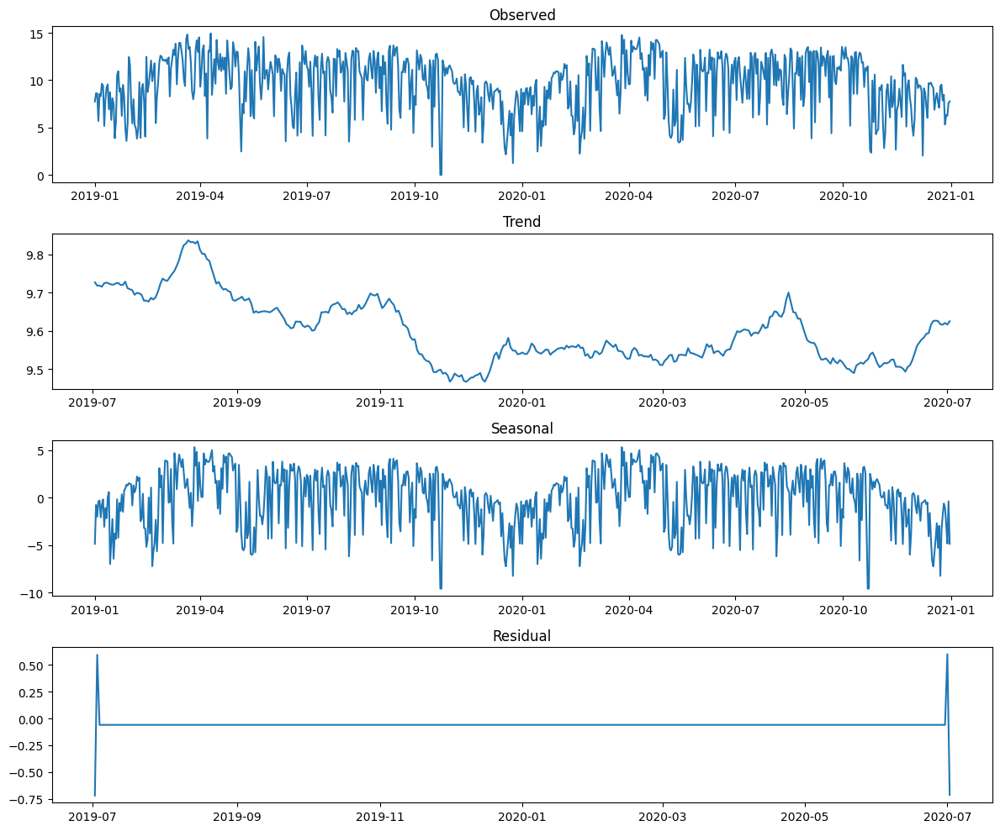

In [ ]:
# 10. Time series decomposition
from statsmodels.tsa.seasonal import seasonal_decompose

# Resample to daily frequency for decomposition
daily_power = solar1_df['Power(MW)'].resample('D').mean()
result = seasonal_decompose(daily_power, model='additive', period=365)

plt.figure(figsize=(12, 10))
plt.subplot(411)
plt.plot(result.observed)
plt.title('Observed')
plt.subplot(412)
plt.plot(result.trend)
plt.title('Trend')
plt.subplot(413)
plt.plot(result.seasonal)
plt.title('Seasonal')
plt.subplot(414)
plt.plot(result.resid)
plt.title('Residual')
plt.tight_layout()
plt.show()

Observed Data:

The power output shows clear seasonal patterns with regular fluctuations.
There's high variability in daily power output, ranging roughly from 0 to 15 MW.
The overall pattern seems to repeat annually, with higher peaks during certain parts of the year.


Trend Component:

There's a slight overall downward trend from mid-2019 to early 2020.
The trend then shows a gradual increase from early 2020 to mid-2020.
This could indicate changes in overall system efficiency, environmental factors, or long-term weather patterns affecting solar power generation.


Seasonal Component:

There's a strong seasonal pattern that repeats annually.
The seasonal effect ranges from about -5 to +5 MW.
Peak seasons (likely summer months) show positive seasonal effects, while troughs (likely winter months) show negative effects.
This pattern is consistent with expected solar power generation variations due to changing daylight hours and sun intensity throughout the year.


Residual Component:

The residual plot shows mostly small variations, indicating that the trend and seasonal components explain a significant portion of the data.
There are some notable spikes in the residuals, particularly around July 2019 and July 2020, which could represent unusual events or anomalies not explained by the seasonal or trend components.
The majority of the residuals seem to be close to zero, suggesting the model captures most of the systematic variations in the data.

In [ ]:
# List of features to plot (excluding 'Power(MW)')
features = [col for col in solar1_df.columns if col != 'Power(MW)']

# Calculate number of rows needed (each feature needs 2 rows: scatter + box)
n_rows = (len(features) + 1) // 2 * 2

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, 2, figsize=(20, 5*n_rows + 2))  # Added extra height for the main title
fig.suptitle('Power vs Features and Feature Distributions', fontsize=16, y=0.98)  # Adjusted y position

# Flatten the axes array for easier iteration
axes = axes.flatten()

for i, feature in enumerate(features):
    # Scatter plot
    sns.scatterplot(x=feature, y='Power(MW)', data=solar1_df, ax=axes[i*2], alpha=0.5)
    axes[i*2].set_title(f'Power vs {feature}', pad=10)  # Added padding
    axes[i*2].set_xlabel(feature)
    axes[i*2].set_ylabel('Power (MW)')

    # Box plot
    sns.boxplot(x=feature, data=solar1_df, ax=axes[i*2+1])
    axes[i*2+1].set_title(f'Distribution of {feature}', pad=10)  # Added padding
    axes[i*2+1].set_xlabel(feature)

    # Rotate x-axis labels if needed
    axes[i*2].tick_params(axis='x', rotation=45)
    axes[i*2+1].tick_params(axis='x', rotation=45)

# Remove any unused subplots
for j in range(i*2+2, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust top margin to accommodate main title
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#The set of codes below identifies the outlier in the Total Solar Irradiance column
outlier1_df = solar1_df[solar1_df["Total_Solar_Irradiance(W/m2)"] < 0]
outlier1_df

,Total_Solar_Irradiance(W/m2),Direct_Normal_Irradiance(W/m2),Global_Horizontal_Irradiance(W/m2),Air_Temperature(°C),Atmosphere(hpa),Relative_Humidity(%),Power(MW)
Date_Time,,,,,,,
2019-06-21 12:00:00,-99,-99,-99,-99.0,-99.0,-99.0,18.432798
2019-06-21 12:15:00,-99,-99,-99,-99.0,-99.0,-99.0,18.617931
2019-07-06 13:30:00,-99,-99,-99,-99.0,-99.0,-99.0,9.785000
2019-07-06 13:45:00,-99,-99,-99,-99.0,-99.0,-99.0,8.817800
2019-07-06 14:00:00,-99,-99,-99,-99.0,-99.0,-99.0,8.701733
2019-07-06 14:15:00,-99,-99,-99,-99.0,-99.0,-99.0,8.750733
2019-07-06 14:45:00,-99,-99,-99,-99.0,-99.0,-99.0,9.096066
2019-07-06 15:15:00,-99,-99,-99,-99.0,-99.0,-99.0,8.638466
2019-07-06 15:30:00,-99,-99,-99,-99.0,-99.0,-99.0,8.619800


In [ ]:
outlier1_df["Total_Solar_Irradiance(W/m2)"].unique()

array([-99])

In [ ]:
outlier1_df.shape

(60, 7)

In [ ]:
#The set of codes below identifies the outlier in the Direct Normal Irradiance column
outlier2_df = solar1_df[solar1_df["Direct_Normal_Irradiance(W/m2)"] < 0]
outlier2_df["Total_Solar_Irradiance(W/m2)"].unique()

array([-99])

In [ ]:
outlier2_df.shape

(60, 7)

In [ ]:
#The set of codes below identifies the outlier in the Global Horizontal Irradiance column
outlier3_df = solar1_df[solar1_df["Global_Horizontal_Irradiance(W/m2)"] < 0]
outlier3_df["Global_Horizontal_Irradiance(W/m2)"].unique()

array([-99])

In [ ]:
outlier3_df.shape[0]

60

In [ ]:
#The set of codes below identifies the outlier in the Air Temperature column
outlier4_df = solar1_df[solar1_df["Air_Temperature(°C)"] < -20]
outlier4_df["Air_Temperature(°C)"].unique()

array([-99.])

In [ ]:
outlier4_df.shape[0]

60

In [ ]:
# outlier5_df = solar1_df[(solar1_df["Air_Temperature(C)"] > -20) & (solar1_df["Air_Temperature(C)"] < 0)]
# outlier5_df["Air_Temperature(C)"].unique()

In [ ]:
outlier5_df = solar1_df[(solar1_df["Air_Temperature(°C)"] < -20)]
outlier5_df["Air_Temperature(°C)"].unique()

array([-99.])

In [ ]:
outlier5_df.shape[0]

60

In [ ]:
#The set of codes below identifies the outlier in the Atmosphere column
outlier6_df = solar1_df[solar1_df["Atmosphere(hpa)"] < 800]
outlier6_df["Atmosphere(hpa)"].unique()

array([-99.])

In [ ]:
outlier6_df.shape[0]

60

In [ ]:
#The set of codes below identifies the outlier in the Relative_Humidity column
outlier7_df = solar1_df[(solar1_df["Relative_Humidity(%)"] < 0) | (solar1_df["Relative_Humidity(%)"] > 1000)]
outlier7_df["Relative_Humidity(%)"].unique()

array([6553.4, 6553.1, 6553.3, 6553.2, 6552.6, 6552.3, 6552.2, 6551.9,
       6551.5, 6551.6, 6551.7, 6551.8, 6551.2, 6551. , 6550.5, 6550.8,
       6550.7, 6550.9, 6551.4, 6552. , 6553.5, 6552.8, 6552.5, 6552.4,
       6552.1, 6551.1, 6551.3, 6552.7, 6553. , 6550.4, 6550. , 6549.9,
       6550.3, 6552.9, 6550.2, 6550.6, 6550.1, 6549.8, 6549.5, 6549.2,
       6548.8, 6549.1, 6548.7, 6548.5, 6548.4, 6548. , 6547.8, 6548.1,
       6547.9, 6548.2, 6549.6, 6547.3, 6547.5, 6546.7, 6546.9, 6546.5,
       6547.6, 6548.9, 6549.3, 6549. , 6549.4, 6549.7, 6548.6, 6548.3,
       6547.1, 6547. , 6547.4, 6547.7,  -99. , 6546.8, 6547.2, 6546.6])

In [ ]:
outlier7_df.shape[0]

6807

#### The above box plot and description of the data set indicated that there are outliers records of (-99) in the Total Solar Irradiance, Direct Normal Irradiance, Global Normal Irradiance, Air Temperature, Atmospheric pressure, Relative Humidity columns of the dataset

In [ ]:
# # Generate Sweetviz report
# report = sv.analyze(solar1_df)

# # Display the report in the Jupyter Notebook
# report.show_html('Solar_Station_Report.html')

In [ ]:
solar1_df

,Total_Solar_Irradiance(W/m2),Direct_Normal_Irradiance(W/m2),Global_Horizontal_Irradiance(W/m2),Air_Temperature(°C),Atmosphere(hpa),Relative_Humidity(%),Power(MW)
Date_Time,,,,,,,
2019-01-01 00:00:00,0,0,0,-11.7,930.5,39.1,0.0
2019-01-01 00:15:00,0,0,0,-11.8,930.5,39.3,0.0
2019-01-01 00:30:00,0,0,0,-11.4,930.5,39.0,0.0
2019-01-01 00:45:00,0,0,0,-11.5,930.5,38.0,0.0
2019-01-01 01:00:00,0,0,0,-11.5,930.4,38.9,0.0
...,...,...,...,...,...,...,...
2020-12-31 22:45:00,0,1,0,-7.6,927.0,23.2,0.0
2020-12-31 23:00:00,0,1,0,-8.4,927.0,23.5,0.0
2020-12-31 23:15:00,0,1,0,-9.2,926.9,25.3,0.0


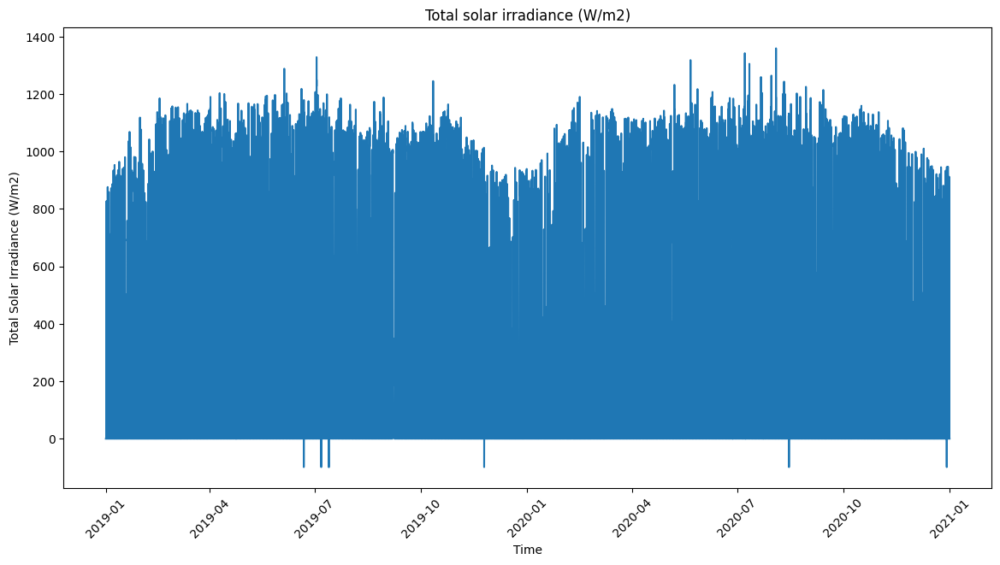

In [ ]:
#set the figure size for visualization
plt.figure(figsize = (14,7))
sns.lineplot(data = solar1_df, x = solar1_df.index, y = 'Total_Solar_Irradiance(W/m2)')
plt.title('Total solar irradiance (W/m2)')
plt.xlabel('Time')
plt.ylabel('Total Solar Irradiance (W/m2)')
plt.xticks(rotation = 45)
plt.show()

### DATA PREPROCESSING

In [ ]:
#define a function to correct the error values
def correct_errors(df):
    irradiance_columns = [
        'Total_Solar_Irradiance(W/m2)', 'Direct_Normal_Irradiance(W/m2)',
        'Global_Horizontal_Irradiance(W/m2)'
    ]

    other_columns = [
        'Air_Temperature(°C)', 'Atmosphere(hpa)', 'Relative_Humidity(%)'
    ]

    # Conditions for irradiance columns
    for col in irradiance_columns:
        df.loc[df[col] < 0, col] = np.nan

    # Forward fill irradiance columns where Power > 0
    power_positive_mask = df['Power(MW)'] > 0
    df.loc[power_positive_mask, irradiance_columns] = df.loc[power_positive_mask, irradiance_columns].ffill()

    # Set irradiance columns to 0 where Power = 0
    power_zero_mask = df['Power(MW)'] == 0
    df.loc[power_zero_mask, irradiance_columns] = 0

    # Conditions for other columns
    df.loc[df['Air_Temperature(°C)'] < -20, 'Air_Temperature(°C)'] = np.nan
    df.loc[df['Atmosphere(hpa)'] < 800, 'Atmosphere(hpa)'] = np.nan
    df.loc[(df['Relative_Humidity(%)'] < 0) | (df['Relative_Humidity(%)'] > 100), 'Relative_Humidity(%)'] = np.nan

    # Forward fill other columns independently of Power
    df[other_columns] = df[other_columns].ffill()

    return df

In [ ]:
new_solar1_df = correct_errors(solar1_df)

In [ ]:
new_solar1_df

,Total_Solar_Irradiance(W/m2),Direct_Normal_Irradiance(W/m2),Global_Horizontal_Irradiance(W/m2),Air_Temperature(°C),Atmosphere(hpa),Relative_Humidity(%),Power(MW)
Date_Time,,,,,,,
2019-01-01 00:00:00,0.0,0.0,0.0,-11.7,930.5,39.1,0.0
2019-01-01 00:15:00,0.0,0.0,0.0,-11.8,930.5,39.3,0.0
2019-01-01 00:30:00,0.0,0.0,0.0,-11.4,930.5,39.0,0.0
2019-01-01 00:45:00,0.0,0.0,0.0,-11.5,930.5,38.0,0.0
2019-01-01 01:00:00,0.0,0.0,0.0,-11.5,930.4,38.9,0.0
...,...,...,...,...,...,...,...
2020-12-31 22:45:00,0.0,0.0,0.0,-7.6,927.0,23.2,0.0
2020-12-31 23:00:00,0.0,0.0,0.0,-8.4,927.0,23.5,0.0
2020-12-31 23:15:00,0.0,0.0,0.0,-9.2,926.9,25.3,0.0


In [ ]:
new_solar1_df.describe()

,Total_Solar_Irradiance(W/m2),Direct_Normal_Irradiance(W/m2),Global_Horizontal_Irradiance(W/m2),Air_Temperature(°C),Atmosphere(hpa),Relative_Humidity(%),Power(MW)
count,70176.000000,70176.000000,70176.000000,70176.000000,70176.000000,70176.000000,70176.000000
mean,265.154341,92.169574,67.531421,13.149222,913.366422,21.006506,9.669417
std,367.557137,199.782960,111.253596,14.337695,8.741273,18.589044,13.705175
min,0.000000,0.000000,0.000000,-18.200000,894.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,905.700000,5.400000,0.000000
50%,0.000000,0.000000,0.000000,15.100000,913.300000,15.500000,0.000000
75%,537.000000,34.000000,97.000000,25.300000,920.200000,33.700000,18.794616
max,1359.000000,980.000000,989.000000,41.200000,936.300000,69.900000,48.321730


#### Result of Data Cleaning

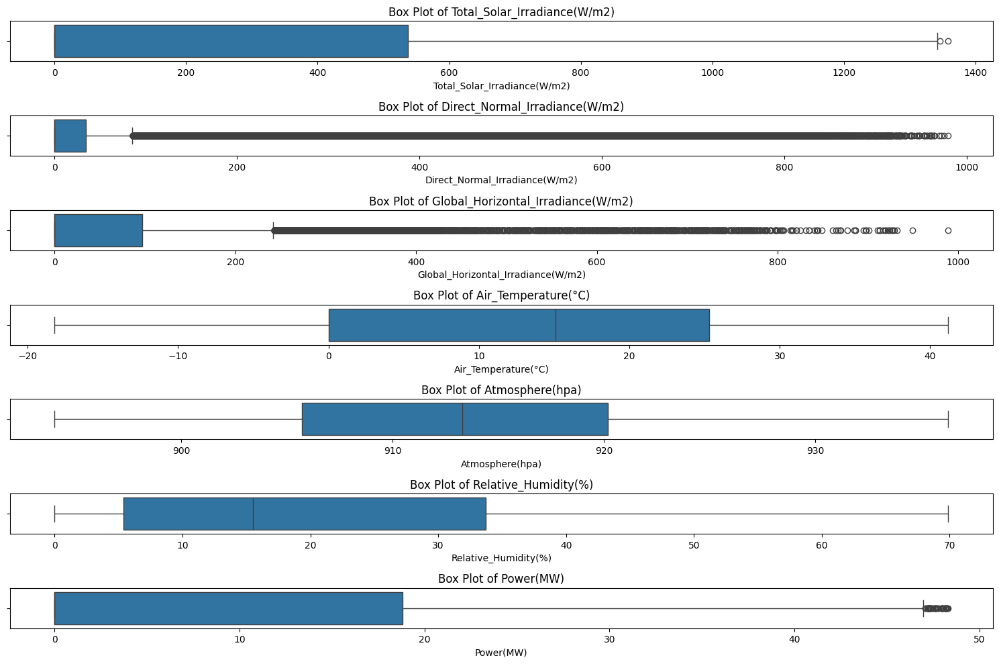

In [ ]:
# Set up the figure and axes for the box plots
plt.figure(figsize=(15, 10))

# Plotting each numeric column as a box plot
for i, column in enumerate(new_solar1_df.select_dtypes(include=[np.number]).columns):
    plt.subplot(len(new_solar1_df.select_dtypes(include=[np.number]).columns), 1, i + 1)
    sns.boxplot(x=new_solar1_df[column])
    plt.title(f'Box Plot of {column}')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [ ]:
# List of features to plot (excluding 'Power(MW)')
features = [col for col in solar1_df.columns if col != 'Power(MW)']

# Calculate number of rows needed (each feature needs 2 rows: scatter + box)
n_rows = (len(features) + 1) // 2 * 2

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, 2, figsize=(20, 5*n_rows + 2))  # Added extra height for the main title
fig.suptitle('Power vs Features and Feature Distributions', fontsize=16, y=0.98)  # Adjusted y position

# Flatten the axes array for easier iteration
axes = axes.flatten()

for i, feature in enumerate(features):
    # Scatter plot
    sns.scatterplot(x=feature, y='Power(MW)', data=solar1_df, ax=axes[i*2], alpha=0.5)
    axes[i*2].set_title(f'Power vs {feature}', pad=10)  # Added padding
    axes[i*2].set_xlabel(feature)
    axes[i*2].set_ylabel('Power (MW)')

    # Box plot
    sns.boxplot(x=feature, data=solar1_df, ax=axes[i*2+1])
    axes[i*2+1].set_title(f'Distribution of {feature}', pad=10)  # Added padding
    axes[i*2+1].set_xlabel(feature)

    # Rotate x-axis labels if needed
    axes[i*2].tick_params(axis='x', rotation=45)
    axes[i*2+1].tick_params(axis='x', rotation=45)

# Remove any unused subplots
for j in range(i*2+2, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.95)  # Adjust top margin to accommodate main title
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
new_solar1_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 70176 entries, 2019-01-01 00:00:00 to 2020-12-31 23:45:00
Data columns (total 7 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Total_Solar_Irradiance(W/m2)        70176 non-null  float64
 1   Direct_Normal_Irradiance(W/m2)      70176 non-null  float64
 2   Global_Horizontal_Irradiance(W/m2)  70176 non-null  float64
 3   Air_Temperature(°C)                 70176 non-null  float64
 4   Atmosphere(hpa)                     70176 non-null  float64
 5   Relative_Humidity(%)                70176 non-null  float64
 6   Power(MW)                           70176 non-null  float64
dtypes: float64(7)
memory usage: 4.3 MB


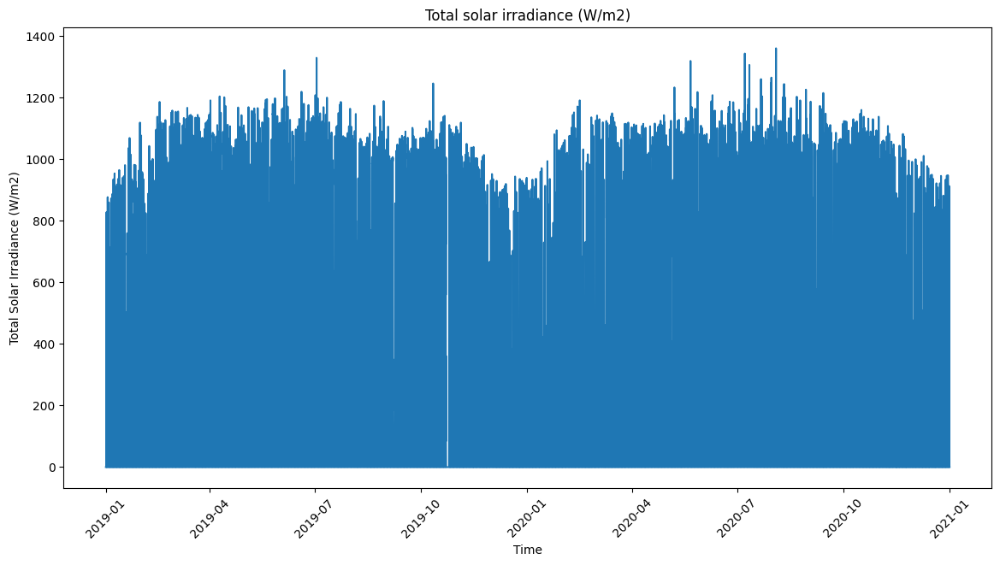

In [ ]:
#set the figure size for visualization
plt.figure(figsize = (14,7))
sns.lineplot(data = new_solar1_df, x = new_solar1_df.index, y = 'Total_Solar_Irradiance(W/m2)')
plt.title('Total solar irradiance (W/m2)')
plt.xlabel('Time')
plt.ylabel('Total Solar Irradiance (W/m2)')
plt.xticks(rotation = 45)
plt.show()

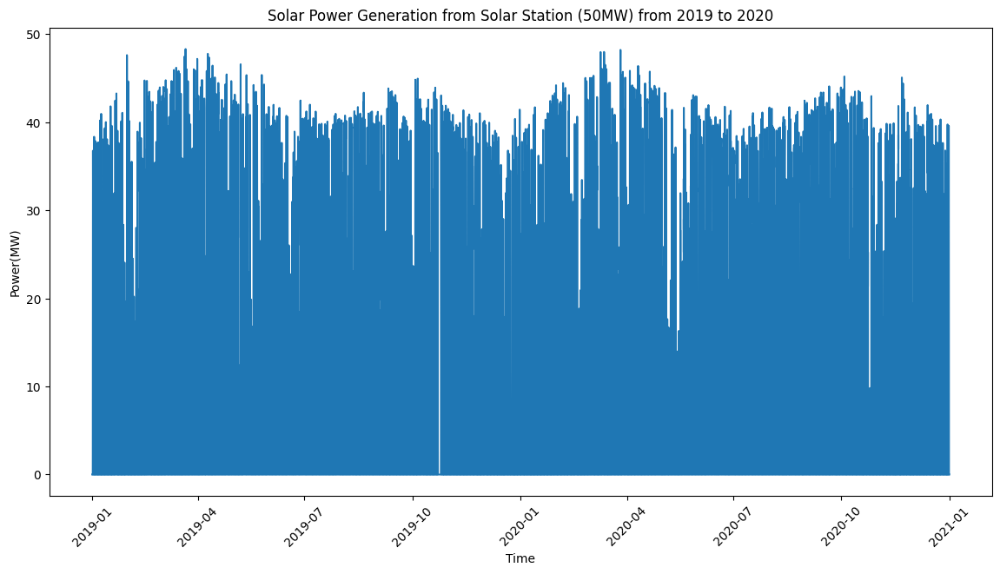

In [ ]:
#set the figure size for visualization
plt.figure(figsize = (14,7))
sns.lineplot(data = new_solar1_df, x = new_solar1_df.index, y = 'Power(MW)')
plt.title('Solar Power Generation from Solar Station (50MW) from 2019 to 2020')
plt.xlabel('Time')
plt.ylabel('Power(MW)')
plt.xticks(rotation = 45)
plt.show()

#### Feature correlation analysis

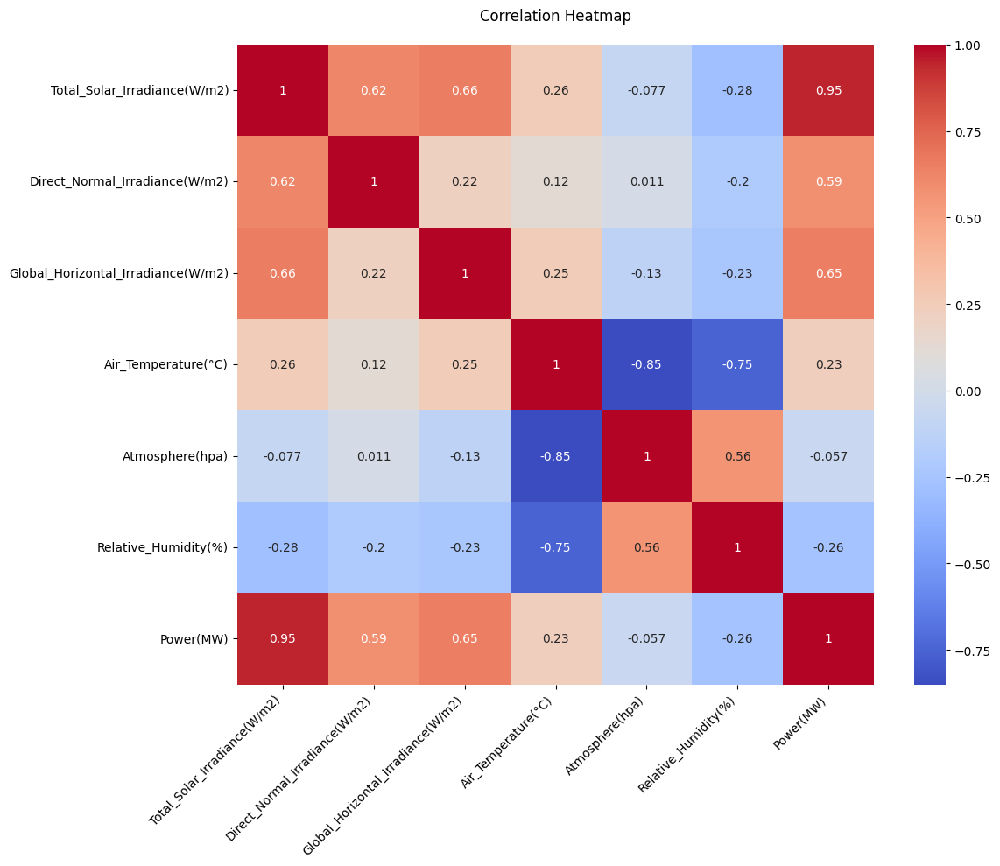

Image saved to images/correlation_heatmap.png


In [ ]:
# Calculate the correlation matrix
correlation_matrix = new_solar1_df.corr()

# Create the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Set the title
plt.title('Correlation Heatmap', pad=20)

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

# Adjust layout to prevent cutting off labels
plt.tight_layout()

# Create a folder called 'images' in the current directory
images_folder = 'images'
if not os.path.exists(images_folder):
    os.makedirs(images_folder)

# Specify the file name and path
file_name = 'correlation_heatmap.png'
file_path = os.path.join(images_folder, file_name)

# Save the figure
plt.savefig(file_path, dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

# Close the plot to free up memory
plt.close()

print(f"Image saved to {file_path}")

# If you want to download the file, uncomment the following line:
# from google.colab import files
# files.download(file_path)

In [ ]:
new_solar1_df.shape

(70176, 7)

Create a copy for further exploratory analysis

In [ ]:
# Assuming new_solar1_df is your original DataFrame
# Create a copy of the DataFrame
new_solar1_copy_df = new_solar1_df.copy()

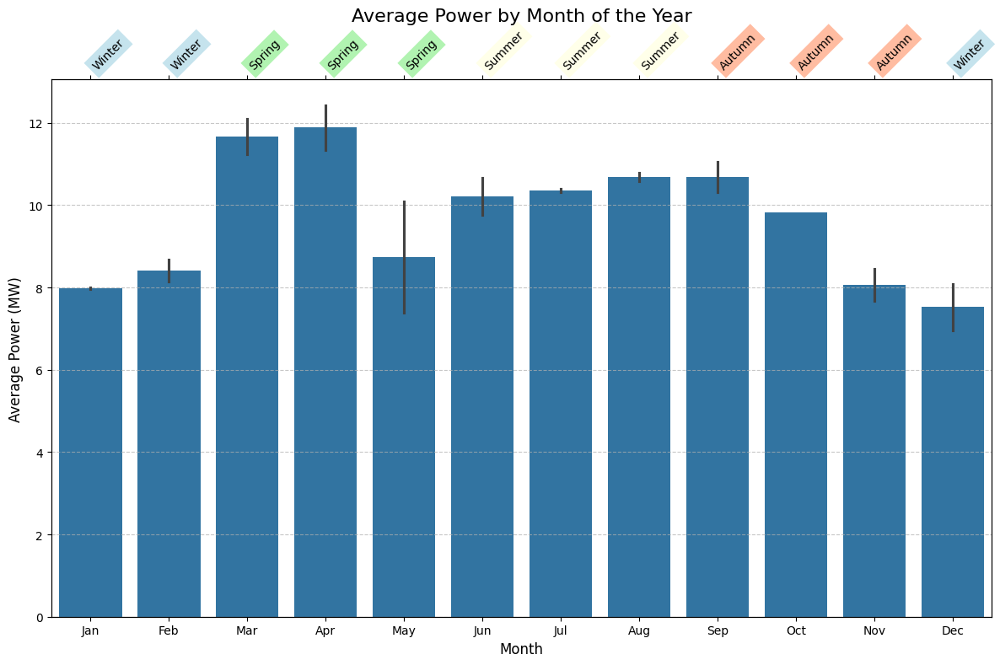

In [ ]:
# Create a new DataFrame with monthly averages if not already done
monthly_power = new_solar1_copy_df['Power(MW)'].resample('M').mean().reset_index()
monthly_power['month'] = monthly_power['Date_Time'].dt.month

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8))
sns.barplot(data=monthly_power, x='month', y='Power(MW)', ax=ax)

# Set title and labels
ax.set_title('Average Power by Month of the Year', fontsize=16)
ax.set_xlabel('Month', fontsize=12)
ax.set_ylabel('Average Power (MW)', fontsize=12)

# Set the x-ticks to show the month names
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax.set_xticks(range(12))
ax.set_xticklabels(month_names)

# Adding seasonal annotations
seasons = ['Winter', 'Winter', 'Spring', 'Spring', 'Spring', 'Summer', 'Summer', 'Summer', 'Autumn', 'Autumn', 'Autumn', 'Winter']
season_colors = {'Winter': 'lightblue', 'Spring': 'lightgreen', 'Summer': 'lightyellow', 'Autumn': 'lightsalmon'}

# Create a secondary x-axis for the season labels
ax2 = ax.twiny()
ax2.set_xlim(ax.get_xlim())
ax2.set_xticks(range(12))
ax2.set_xticklabels(seasons, rotation=45, ha='left')

# Customize the secondary axis' appearance
for i, label in enumerate(ax2.get_xticklabels()):
    label.set_color('black')
    label.set_bbox(dict(facecolor=season_colors[seasons[i]], edgecolor='none', alpha=0.7))

# Add grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

#### The above boxplot indicates that the solar power generation peaks twice in a year i.e the spring season and in the summer and these is expected as there are more solar irradiance during these season than in the winter season

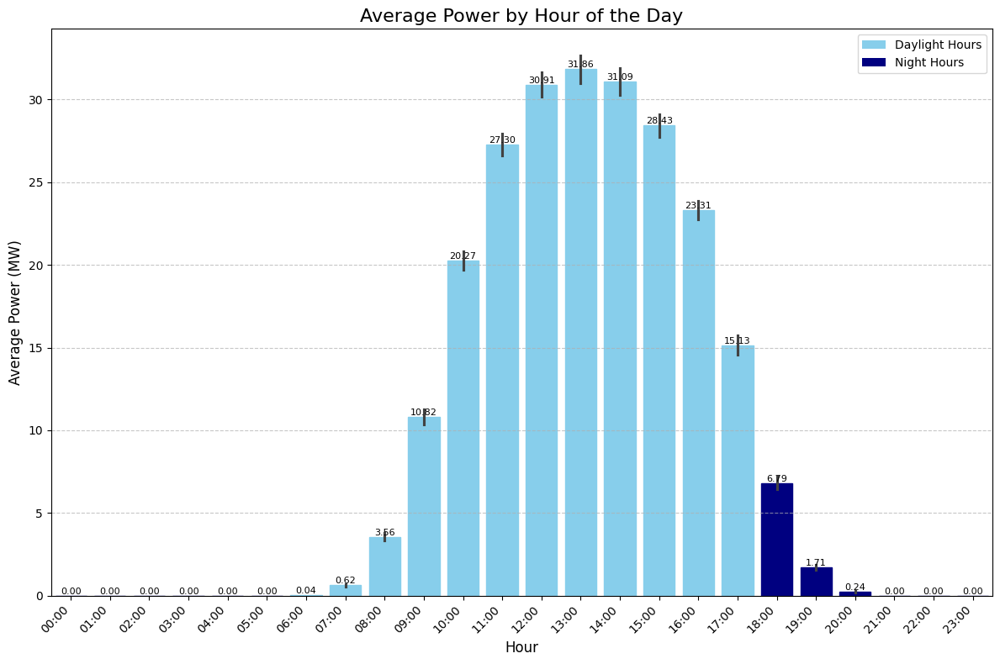

In [ ]:
# Create a new DataFrame with hourly averages
hourly_power = new_solar1_copy_df['Power(MW)'].resample('H').mean().reset_index()
hourly_power['hour'] = hourly_power['Date_Time'].dt.hour

# Now use this DataFrame in the plot code
fig, ax = plt.subplots(figsize=(12, 8))
sns.barplot(data=hourly_power, x='hour', y='Power(MW)', ax=ax)

# Set title and labels
ax.set_title('Average Power by Hour of the Day', fontsize=16)
ax.set_xlabel('Hour', fontsize=12)
ax.set_ylabel('Average Power (MW)', fontsize=12)

# Customize x-axis ticks
ax.set_xticks(range(24))
ax.set_xticklabels([f'{hour:02d}:00' for hour in range(24)], rotation=45, ha='right')

# Add grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels on top of each bar
for i, bar in enumerate(ax.patches):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f'{bar.get_height():.2f}',
        ha='center', va='bottom',
        fontsize=8
    )

# Color the bars based on daylight hours (example: 6 AM to 6 PM as daylight)
colors = ['skyblue' if 6 <= i < 18 else 'navy' for i in range(24)]
for bar, color in zip(ax.patches, colors):
    bar.set_color(color)

# Add a legend
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='skyblue', label='Daylight Hours'),
                   Patch(facecolor='navy', label='Night Hours')]
ax.legend(handles=legend_elements, loc='upper right')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

#### The above boxplot shows that the power production begins roughly from 6am till afternoon and peaks from 12pm to 2pm in the afternoon where the irradiance is the highest

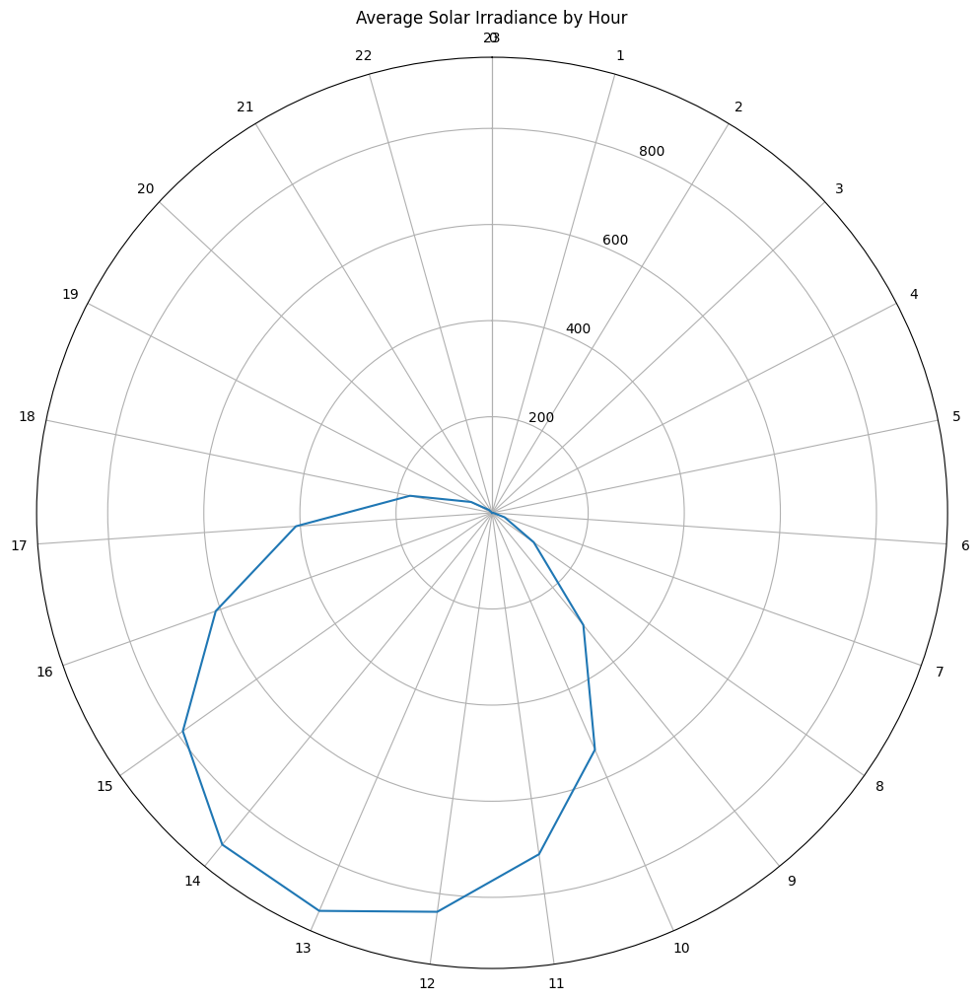

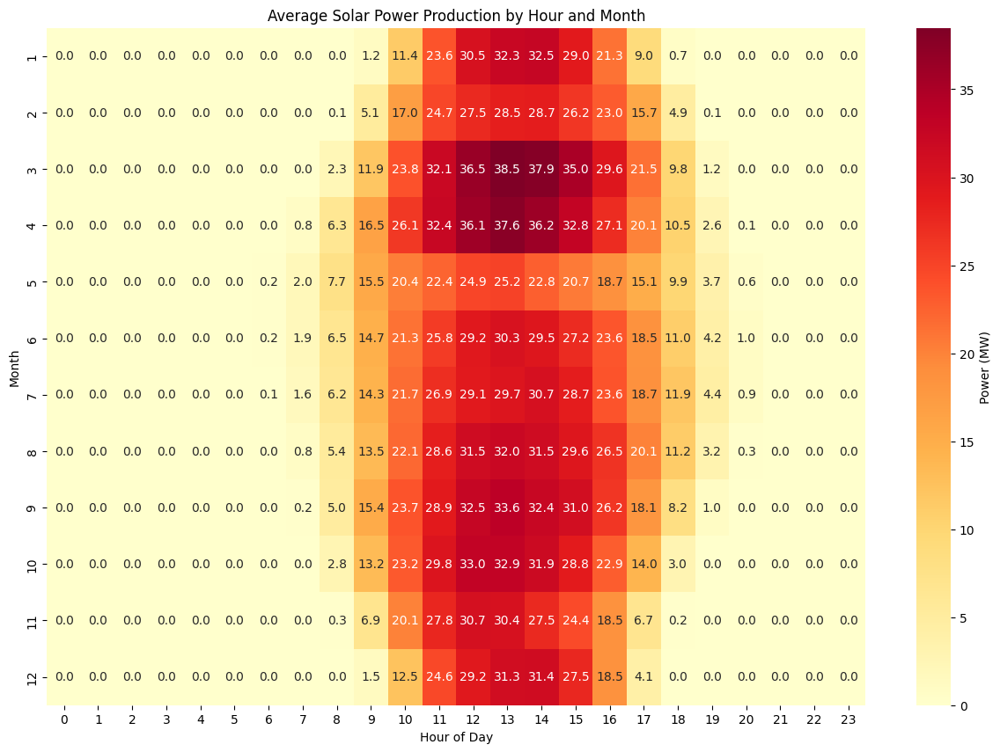

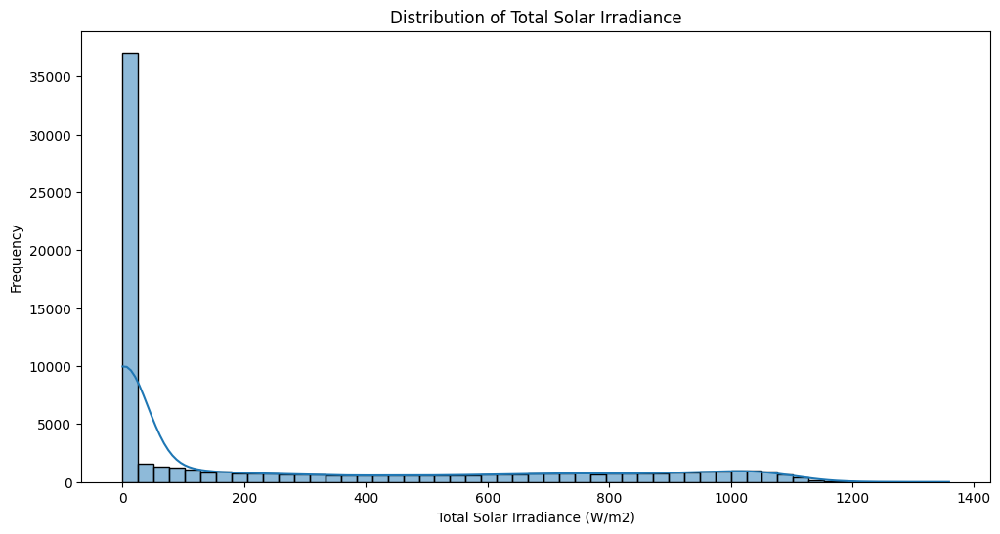

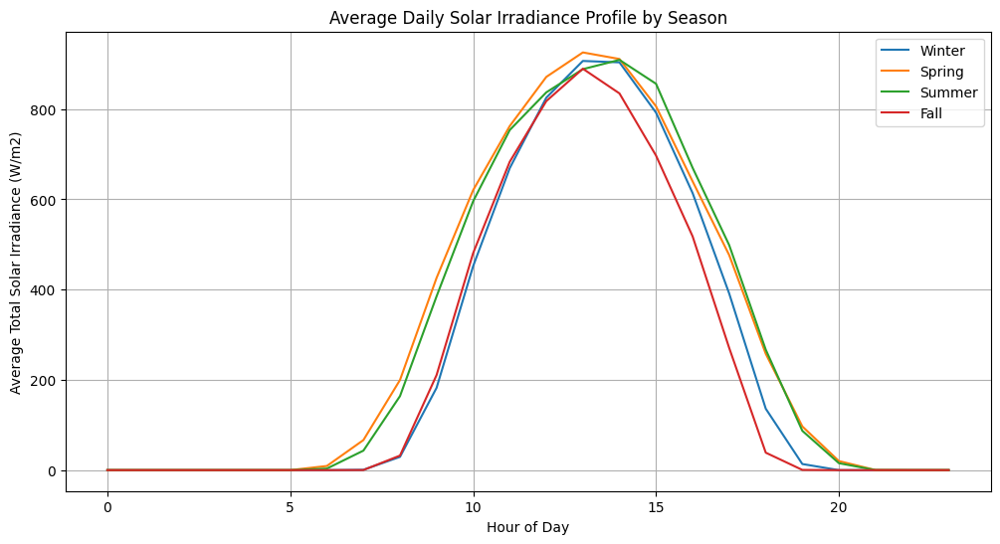

In [ ]:
# 1. Solar Irradiance Rose
plt.figure(figsize=(12, 12))
new_solar1_copy_df['Hour'] = new_solar1_copy_df.index.hour
new_solar1_copy_df['Month'] = new_solar1_copy_df.index.month_name()

pivot = new_solar1_copy_df.pivot_table(values='Total_Solar_Irradiance(W/m2)',
                              index='Hour',
                              columns='Month',
                              aggfunc='mean')

ax = plt.subplot(111, projection='polar')
theta = np.linspace(0, 2*np.pi, 24)
r = pivot.mean(axis=1)
ax.plot(theta, r)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(theta), labels=range(24))
ax.set_title("Average Solar Irradiance by Hour")
plt.show()

# 2. Solar Production Heatmap
plt.figure(figsize=(15, 10))
pivot = new_solar1_copy_df.pivot_table(values='Power(MW)',
                              index=new_solar1_copy_df.index.month,
                              columns=new_solar1_copy_df.index.hour,
                              aggfunc='mean')
sns.heatmap(pivot, cmap='YlOrRd', annot=True, fmt='.1f', cbar_kws={'label': 'Power (MW)'})
plt.title('Average Solar Power Production by Hour and Month')
plt.xlabel('Hour of Day')
plt.ylabel('Month')
plt.show()

# 3. Irradiance Distribution Plot
plt.figure(figsize=(12, 6))
sns.histplot(data=solar1_df, x='Total_Solar_Irradiance(W/m2)', kde=True)
plt.title('Distribution of Total Solar Irradiance')
plt.xlabel('Total Solar Irradiance (W/m2)')
plt.ylabel('Frequency')
plt.show()

# 4. Daily Irradiance Profile by Season
new_solar1_copy_df['Season'] = pd.cut(new_solar1_copy_df.index.month,
                             bins=[0, 3, 6, 9, 12],
                             labels=['Winter', 'Spring', 'Summer', 'Fall'],
                             include_lowest=True)

plt.figure(figsize=(12, 6))
for season in new_solar1_copy_df['Season'].unique():
    season_data = new_solar1_copy_df[new_solar1_copy_df['Season'] == season]
    daily_profile = season_data.groupby(season_data.index.hour)['Total_Solar_Irradiance(W/m2)'].mean()
    plt.plot(daily_profile.index, daily_profile.values, label=season)

plt.title('Average Daily Solar Irradiance Profile by Season')
plt.xlabel('Hour of Day')
plt.ylabel('Average Total Solar Irradiance (W/m2)')
plt.legend()
plt.grid(True)
plt.show()

Solar Irradiance Rose (Image 1):

Peak irradiance occurs around midday (11 AM - 1 PM).
Symmetrical pattern indicates consistent daily solar exposure.
No irradiance during night hours (8 PM - 4 AM).
Gradual increase from sunrise to noon, then decrease to sunset.


Solar Production Heatmap (Image 2):

Highest power production mid-day (11 AM - 3 PM) across all months.
Summer months (June-August) show highest overall production.
Winter months (December-February) have shorter production hours and lower output.
Clear seasonal and daily patterns in power generation.


Irradiance Distribution Plot (Image 3):

Bimodal distribution with peaks at very low and moderate irradiance levels.
Large peak at 0 W/m² represents nighttime or heavily overcast conditions.
Smaller, broader peak around 800-1000 W/m² indicates typical daytime irradiance.
Long tail extending to 1400 W/m² shows occasional periods of very high irradiance.


Daily Irradiance Profile by Season (Image 4):

Summer has the highest peak irradiance and longest daylight hours.
Winter shows lowest peak irradiance and shortest daylight period.
Spring and Fall have similar profiles, intermediate between Summer and Winter.
All seasons peak around midday, but with varying intensities and durations.

### Observing one week of data for a more microscopic visualization

In [ ]:
one_week_df = new_solar1_df.loc[(new_solar1_df.index > "2019-01-01 00:00:00" ) & (new_solar1_df.index < "2019-01-08 00:00:00" )]
one_week_df.head()

,Total_Solar_Irradiance(W/m2),Direct_Normal_Irradiance(W/m2),Global_Horizontal_Irradiance(W/m2),Air_Temperature(°C),Atmosphere(hpa),Relative_Humidity(%),Power(MW)
Date_Time,,,,,,,
2019-01-01 00:15:00,0.0,0.0,0.0,-11.8,930.5,39.3,0.0
2019-01-01 00:30:00,0.0,0.0,0.0,-11.4,930.5,39.0,0.0
2019-01-01 00:45:00,0.0,0.0,0.0,-11.5,930.5,38.0,0.0
2019-01-01 01:00:00,0.0,0.0,0.0,-11.5,930.4,38.9,0.0
2019-01-01 01:15:00,0.0,0.0,0.0,-11.8,930.1,39.6,0.0


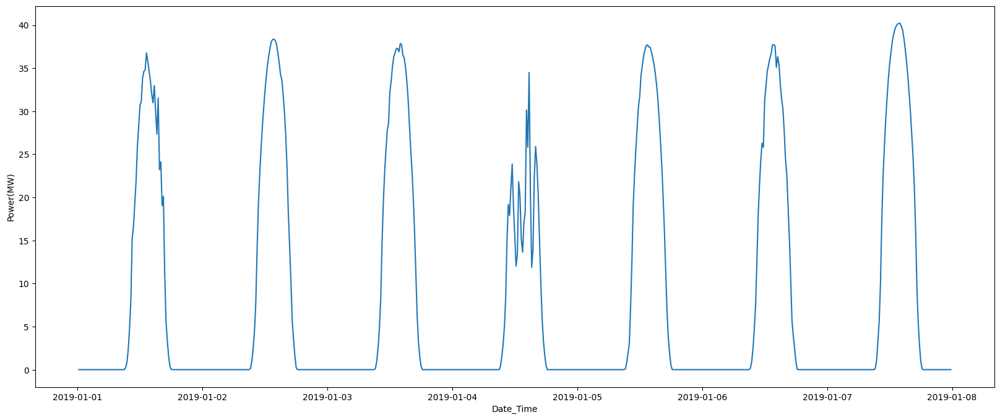

In [ ]:
fig, ax = plt.subplots(figsize = (20,8))
sns.lineplot(data = one_week_df, x = one_week_df.index, y = 'Power(MW)')

plt.show()

In [ ]:
new_solar1_df.shape

(70176, 7)

## TIME SERIES MODELS ON SOLAR STATION 1

#### For Computational expences, a subset (30,000) rows of the whole solar dataset will be used.

In [ ]:
# Select the first 10,000 rows
new_solar1_df = new_solar1_df.iloc[:30000]

print(f"Shape of new_solar1_df after selection: {new_solar1_df.shape}")

Shape of new_solar1_df after selection: (30000, 7)


### Train/Test Split

Splitting the timeseries so there is no data leakage and it follows a realistic scenerio

In [ ]:
# This function below plots the splits of the dataset into train and test set
def plot_train_test_split(train_set, test_set, split_date_time):
    """
    Plot the training and test sets with a vertical line indicating the split date.

    Parameters:
    train_set (DataFrame): DataFrame containing the training set data.
    test_set (DataFrame): DataFrame containing the test set data.
    split_date_time (str or datetime): Date/time to indicate the split between training and test sets.

    Returns:
    None
    """
    # Create the plot
    fig, ax = plt.subplots(figsize=(15, 5))

    # Plot the training and test sets
    train_set.plot(ax=ax, label='Training Set', title='Data Train/Test Split')
    test_set.plot(ax=ax, label='Test Set')

    # Add a vertical line to indicate the split date
    ax.axvline(pd.to_datetime(split_date_time), color='black', ls='--')

    # Add legend
    ax.legend(['Training Set', 'Test Set'])

    # Set axis labels
    ax.set_xlabel("Date_Time")
    ax.set_ylabel("Power(MW)")

    # Show the plot
    plt.show()

In [ ]:
# Calculate the index for the 80% split
split_index = int(len(new_solar1_df) * 0.8)

# Get the datetime for the split
split_date_time = new_solar1_df.index[split_index]

# Split the data
train_ss = new_solar1_df.iloc[:split_index]['Power(MW)']
test_ss = new_solar1_df.iloc[split_index:]['Power(MW)']

# Print info about the split
print(f"Split datetime: {split_date_time}")
print(f"Training set size: {len(train_ss)} ({len(train_ss)/len(new_solar1_df)*100:.2f}%)")
print(f"Test set size: {len(test_ss)} ({len(test_ss)/len(new_solar1_df)*100:.2f}%)")
print(f"Training set date range: {train_ss.index.min()} to {train_ss.index.max()}")
print(f"Test set date range: {test_ss.index.min()} to {test_ss.index.max()}")

Split datetime: 2019-09-08 00:00:00
Training set size: 24000 (80.00%)
Test set size: 6000 (20.00%)
Training set date range: 2019-01-01 00:00:00 to 2019-09-07 23:45:00
Test set date range: 2019-09-08 00:00:00 to 2019-11-09 11:45:00


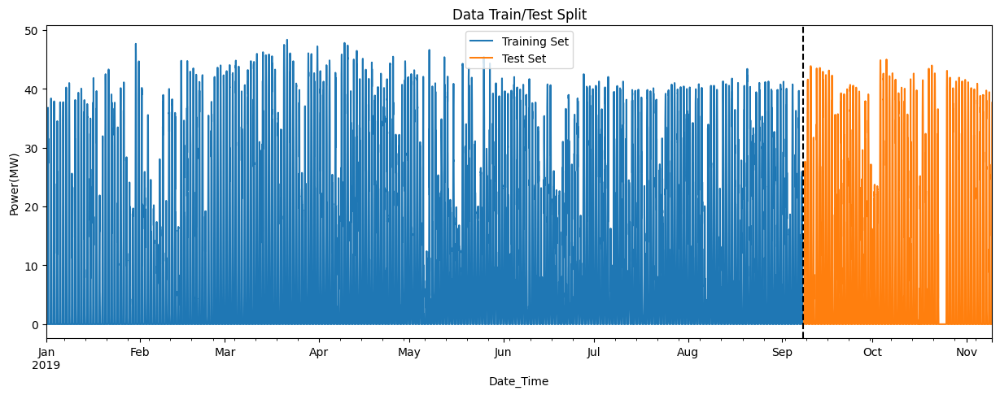

In [ ]:
train_data = train_ss  # Replace with your actual training set DataFrame
test_data = test_ss  # Replace with your actual test set DataFrame
plot_train_test_split(train_data, test_data, split_date_time)

### Features Engineering

In [ ]:
# Solar Station Data
SPLIT_DATE_TIME_ss = split_date_time

# Select the highly correlated features of the dataset
FEATURES_ss = ['Total_Solar_Irradiance(W/m2)','Direct_Normal_Irradiance(W/m2)',
               'Global_Horizontal_Irradiance(W/m2)','Air_Temperature(°C)']

#Identify power as the target
TARGET_ss = 'Power(MW)'

### Split Dataset

In [ ]:
# Split the data
train_ss = new_solar1_df.loc[new_solar1_df.index < SPLIT_DATE_TIME_ss]
test_ss = new_solar1_df.loc[new_solar1_df.index >= SPLIT_DATE_TIME_ss]

X_train_ss = train_ss[FEATURES_ss]
y_train_ss = train_ss[TARGET_ss]
X_test_ss = test_ss[FEATURES_ss]
y_test_ss = test_ss[TARGET_ss]

### Standardize the Dataset

In [ ]:
#Initialize the StandardScaler library
scaler_ss = StandardScaler()

#Standardize the features
X_train_scaled_ss= scaler_ss.fit_transform(X_train_ss)
X_test_scaled_ss = scaler_ss.transform(X_test_ss)

# Convert standardized data back to DataFrame to retain feature names
X_train_ss = pd.DataFrame(X_train_scaled_ss, columns=X_train_ss.columns, index=X_train_ss.index)
X_test_ss = pd.DataFrame(X_test_scaled_ss, columns=X_test_ss.columns, index=X_test_ss.index)

### Normalize the Dataset

In [ ]:
# #import the necessary library for normalization
# from sklearn.preprocessing import MinMaxScaler

# #Initialize the MinMaxScaler library
# scaler_ss = MinMaxScaler()

# #Normalize the features
# X_train_ss_normalized = scaler_ss.fit_transform(X_train_ss)
# X_test_ss_normalized = scaler_ss.transform(X_test_ss)

# # Convert normalized data back to DataFrame to retain feature names
# X_train_ss = pd.DataFrame(X_train_ss_normalized, columns=X_train_ss.columns,index=X_train_ss.index)
# X_test_ss = pd.DataFrame(X_test_ss_normalized, columns=X_test_ss.columns,index=X_test_ss.index)

In [ ]:
X_train_ss.shape

(24000, 4)

In [ ]:
X_test_ss.shape

(6000, 4)

In [ ]:
y_train_ss.shape

(24000,)

In [ ]:
y_test_ss.shape

(6000,)

# TRADITIONAL MACHINE LEARNING MODEL

Save all image outputs

In [ ]:
# Create a directory named 'images' if it doesn't exist
if not os.path.exists('images'):
    os.makedirs('images')

Save all model outputs

In [ ]:
import joblib  # or you can use pickle

# Create a directory named 'models' if it doesn't exist
if not os.path.exists('models'):
    os.makedirs('models')

## MODEL: 1 RANDOM FOREST REGRESSOR

In [ ]:
#import necessary libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

Using the RandomizedSearchCV to obtain the best hyperparameter for the Random Forest Regressor model with the following parameters.
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']

In [ ]:
# Create the Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)

# Define the hyperparameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [1, 2, 3, 'sqrt', 'log2']
}

In [ ]:
# Perform RandomizedSearchCV
rf_random = RandomizedSearchCV(estimator=rf_model, param_distributions=param_grid,
                               n_iter=100, cv=3, verbose=2, random_state=42, n_jobs=-1)

# Fit the model
rf_random.fit(X_train_ss, y_train_ss)


Fitting 3 folds for each of 100 candidates, totalling 300 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'max_depth': [None, 10, 20, 30],
                                        'max_features': [1, 2, 3, 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300]},
                   random_state=42, verbose=2)

In [ ]:
# Get the best model
best_rf_model = rf_random.best_estimator_

# Print the best model parameters
print("Best Model Parameters:")
for param, value in best_rf_model.get_params().items():
    print(f"{param}: {value}")

Best Model Parameters:
bootstrap: True
ccp_alpha: 0.0
criterion: squared_error
max_depth: 10
max_features: 2
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 4
min_samples_split: 5
min_weight_fraction_leaf: 0.0
n_estimators: 300
n_jobs: None
oob_score: False
random_state: 42
verbose: 0
warm_start: False


In [ ]:
# Save the best Random Forest model
model_filename = 'models/best_rf_model.pkl'
joblib.dump(best_rf_model, model_filename)

print(f"Model saved to {model_filename}")

Model saved to models/best_rf_model.pkl


In [ ]:
# Make predictions
y_pred_train = best_rf_model.predict(X_train_ss)
y_pred_test = best_rf_model.predict(X_test_ss)

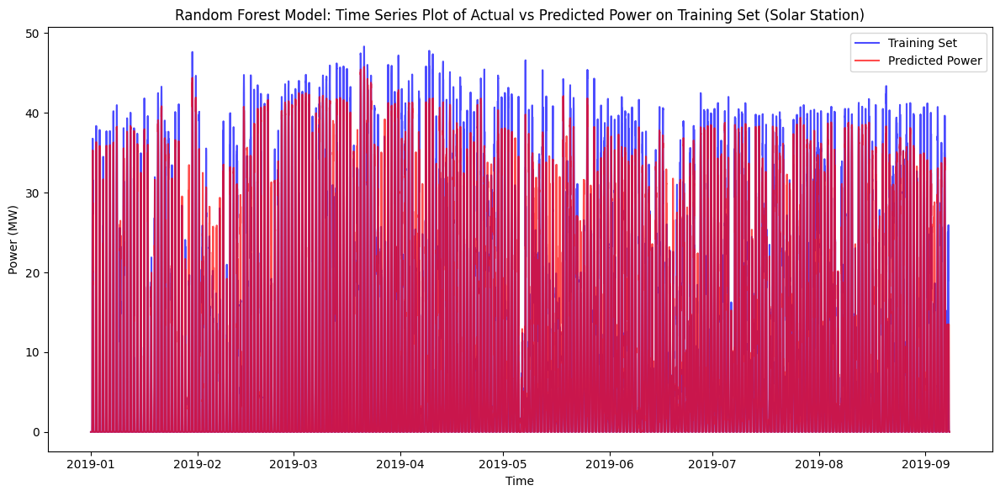

In [ ]:
# Plot Actual vs Predicted Power on Training Set
plt.figure(figsize=(12, 6))
plt.plot(train_ss.index, y_train_ss, color='blue', label='Training Set', alpha=0.7)
plt.plot(train_ss.index, y_pred_train, color='red', label='Predicted Power', alpha=0.7)
plt.xlabel('Time')
plt.ylabel('Power (MW)')
plt.title('Random Forest Model: Time Series Plot of Actual vs Predicted Power on Training Set (Solar Station)')
plt.legend()
plt.tight_layout()
plt.savefig('images/Random Forest Model: Predicted_power_on_Training_set.png')  # Save the plot in the 'images' folder
plt.show()

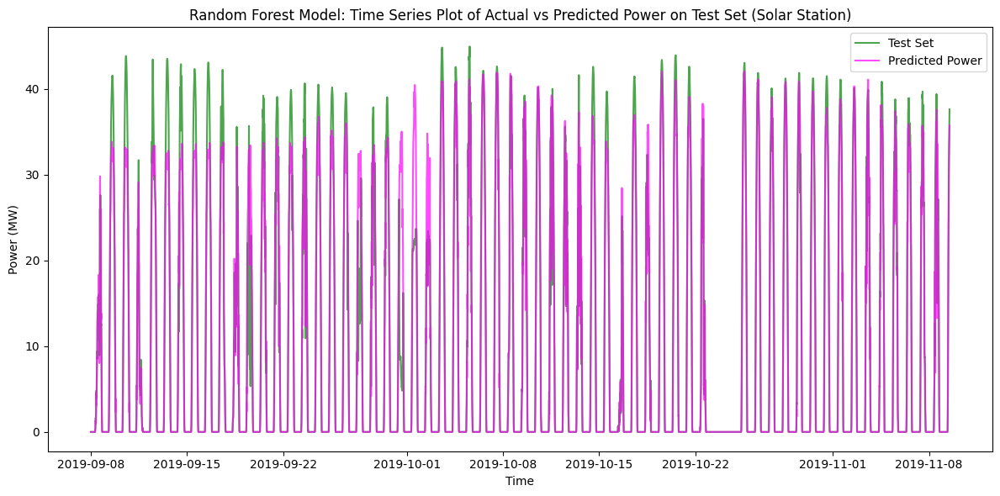

In [ ]:
# Plot Actual vs Predicted Power on Test Set
plt.figure(figsize=(12, 6))
plt.plot(test_ss.index, y_test_ss, color='green', label='Test Set', alpha=0.7)
plt.plot(test_ss.index, y_pred_test, color='magenta', label='Predicted Power', alpha=0.7)
plt.xlabel('Time')
plt.ylabel('Power (MW)')
plt.title('Random Forest Model: Time Series Plot of Actual vs Predicted Power on Test Set (Solar Station)')
plt.legend()
plt.tight_layout()
plt.savefig('images/Random Forest Model: Predicted_power_on_Test_set.png')  # Save the plot in the 'images' folder
plt.show()

In [ ]:
# define helper functions
def mape(y_true, y_pred):
    """
    Calculate the Mean Absolute Percentage Error (MAPE).

    Args:
        y_true (array-like): Array of true values.
        y_pred (array-like): Array of predicted values.

    Returns:
        float: MAPE value as a percentage.
    """
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

def calculate_metrics(y_true, y_pred):
    """
    Calculate regression metrics including MSE, RMSE, MAE, R2, and MAPE.

    Args:
        y_true (array-like): Array of true values.
        y_pred (array-like): Array of predicted values.

    Returns:
        tuple: A tuple containing MSE, RMSE, MAE, R2, and MAPE.
    """
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    mape_value = mape(y_true, y_pred)
    return mse, rmse, mae, r2, mape_value


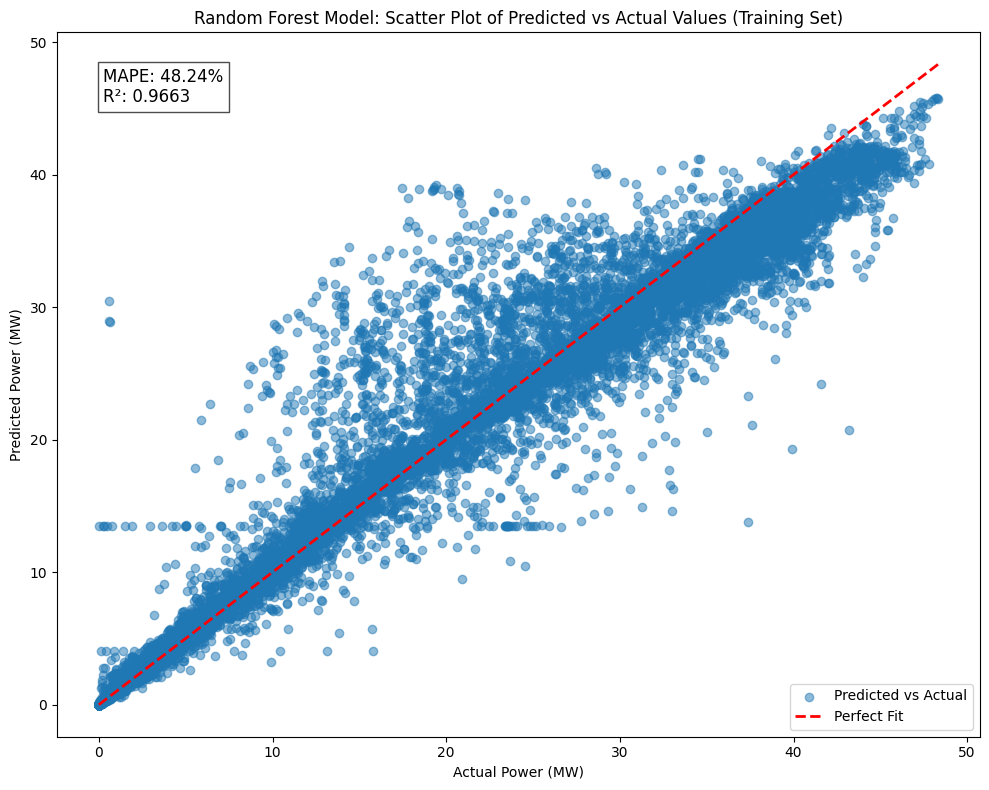

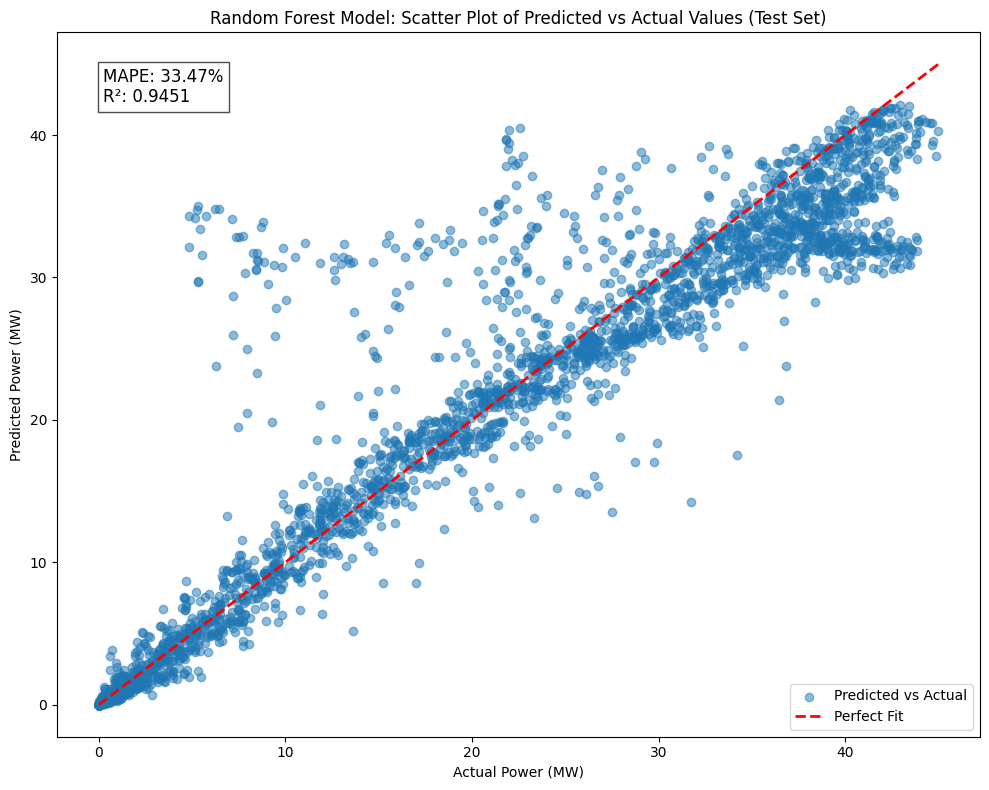

In [ ]:
# Predicted vs Actual (Training Set)
plt.figure(figsize=(10, 8))
plt.scatter(y_train_ss, y_pred_train, alpha=0.5, label='Predicted vs Actual')
plt.plot([y_train_ss.min(), y_train_ss.max()], [y_train_ss.min(), y_train_ss.max()], 'r--', lw=2, label='Perfect Fit')
plt.xlabel('Actual Power (MW)')
plt.ylabel('Predicted Power (MW)')
plt.title('Random Forest Model: Scatter Plot of Predicted vs Actual Values (Training Set)')

# Calculate and display metrics
rf_mape_train = mape(y_train_ss, y_pred_train)
rf_r2_train = r2_score(y_train_ss, y_pred_train)
plt.text(0.05, 0.95, f'MAPE: {rf_mape_train:.2f}%\nR²: {rf_r2_train:.4f}', transform=plt.gca().transAxes,
         fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7))

# Move legend to lower right
plt.legend(loc='lower right')

plt.tight_layout()
plt.savefig('images/Random_Forest_Model_Scatter_Plot_Training_Set.png')  # Save the plot in the 'images' folder
plt.show()

# Predicted vs Actual (Test Set)
plt.figure(figsize=(10, 8))
plt.scatter(y_test_ss, y_pred_test, alpha=0.5, label='Predicted vs Actual')
plt.plot([y_test_ss.min(), y_test_ss.max()], [y_test_ss.min(), y_test_ss.max()], 'r--', lw=2, label='Perfect Fit')
plt.xlabel('Actual Power (MW)')
plt.ylabel('Predicted Power (MW)')
plt.title('Random Forest Model: Scatter Plot of Predicted vs Actual Values (Test Set)')

# Calculate and display metrics
rf_mape_test = mape(y_test_ss, y_pred_test)
rf_r2_test = r2_score(y_test_ss, y_pred_test)
plt.text(0.05, 0.95, f'MAPE: {rf_mape_test:.2f}%\nR²: {rf_r2_test:.4f}', transform=plt.gca().transAxes,
         fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7))

# Move legend to lower right
plt.legend(loc='lower right')

plt.tight_layout()
plt.savefig('images/Random_Forest_Model_Scatter_Plot_Test_Set.png')  # Save the plot in the 'images' folder
plt.show()

In [ ]:
# Calculate metrics for the Random Forest model
# Training set metrics
rf_mse_train, rf_rmse_train, rf_mae_train, rf_r2_train, rf_mape_train = calculate_metrics(y_train_ss, y_pred_train)

# Test set metrics
rf_mse_test, rf_rmse_test, rf_mae_test, rf_r2_test, rf_mape_test = calculate_metrics(y_test_ss, y_pred_test)


In [ ]:
# Below set of code prints the model's performance on the training set
print("Random Forest Model on Train set performance:")
print(f"MSE: {rf_mse_train:.2f}")
print(f"RMSE: {rf_rmse_train:.2f}")
print(f"MAE: {rf_mae_train:.2f}")
print(f"R2 Score: {rf_r2_train:.2f}")
print(f"MAPE: {rf_mape_train:.2f}%")

# Below set of code prints the model's performance on the test set
print("\nRandom Forest Model on Test set performance:")
print(f"MSE: {rf_mse_test:.2f}")
print(f"RMSE: {rf_rmse_test:.2f}")
print(f"MAE: {rf_mae_test:.2f}")
print(f"R2 Score: {rf_r2_test:.2f}")
print(f"MAPE: {rf_mape_test:.2f}%")


Random Forest Model on Train set performance:
MSE: 6.45
RMSE: 2.54
MAE: 1.07
R2 Score: 0.97
MAPE: 48.24%

Random Forest Model on Test set performance:
MSE: 11.45
RMSE: 3.38
MAE: 1.34
R2 Score: 0.95
MAPE: 33.47%


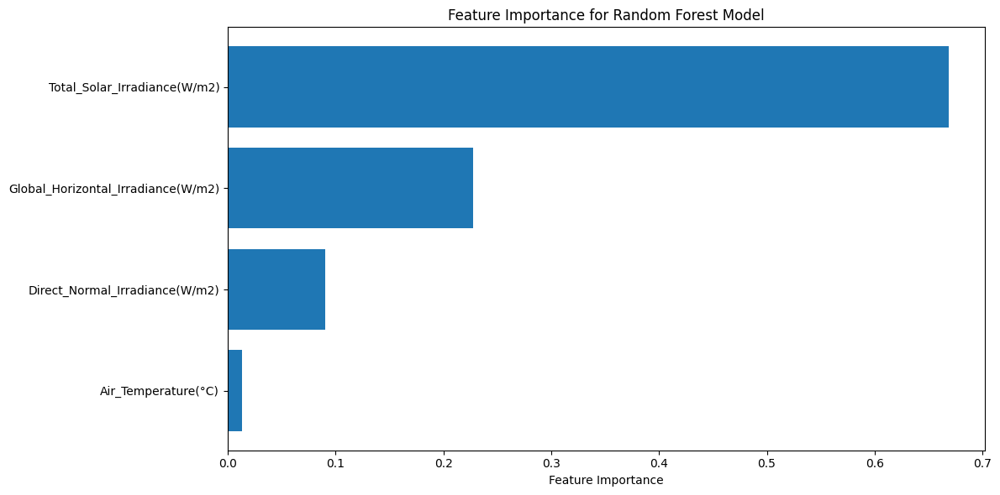

In [ ]:
# Feature importance
feature_importance = best_rf_model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5

plt.figure(figsize=(12, 6))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_train_ss.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Feature Importance for Random Forest Model')
plt.tight_layout()
plt.savefig('images/Feature Importance for Random Forest Model.png')  # Save the plot in the 'images' folder
plt.show()

## MODEL 2: XGBOOST REGRESSOR MODEL

In [ ]:
#pip install xgboost

In [ ]:
# Import the XGBoost regressor model from XGBoost library
from xgboost import XGBRegressor

using the hyperparameter for the XGBoost regressor model param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]

In [ ]:
# Create the XGBoost Regressor
xgb_model = XGBRegressor(random_state=42)

# Define the hyperparameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

In [ ]:
# Perform RandomizedSearchCV
xgb_random = RandomizedSearchCV(estimator=xgb_model, param_distributions=param_grid,
                                n_iter=100, cv=3, verbose=2, random_state=42, n_jobs=-1)

# Fit the model
xgb_random.fit(X_train_ss, y_train_ss)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None,
                                          n_estimators=None, n_jobs=None,
                                          num_parallel_tree=None,
                                          random_state=42, ...),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.8, 0.9, 1.0],
                                        'learning_rate': [0.01, 0.1, 0.2],
                                        'max_depth': [3, 4, 5, 6],
                                        'n_estimators': [100, 200, 300],
                                        'subsample': [0.8, 0.9, 1.0]},
                   random_state=42, verbose=2)

In [ ]:
# Get the best model
best_xgb_model = xgb_random.best_estimator_

# Print the best model parameters
print("Best Model Parameters:")
for param, value in best_xgb_model.get_params().items():
    print(f"{param}: {value}")

Best Model Parameters:
objective: reg:squarederror
base_score: None
booster: None
callbacks: None
colsample_bylevel: None
colsample_bynode: None
colsample_bytree: 1.0
device: None
early_stopping_rounds: None
enable_categorical: False
eval_metric: None
feature_types: None
gamma: None
grow_policy: None
importance_type: None
interaction_constraints: None
learning_rate: 0.01
max_bin: None
max_cat_threshold: None
max_cat_to_onehot: None
max_delta_step: None
max_depth: 3
max_leaves: None
min_child_weight: None
missing: nan
monotone_constraints: None
multi_strategy: None
n_estimators: 300
n_jobs: None
num_parallel_tree: None
random_state: 42
reg_alpha: None
reg_lambda: None
sampling_method: None
scale_pos_weight: None
subsample: 0.8
tree_method: None
validate_parameters: None
verbosity: None


In [ ]:
# Save the best XGBoost model
model_filename = 'models/best_xgb_model.pkl'
joblib.dump(best_xgb_model, model_filename)

print(f"Model saved to {model_filename}")

Model saved to models/best_xgb_model.pkl


In [ ]:
# Make predictions
y_pred_train = best_xgb_model.predict(X_train_ss)
y_pred_test = best_xgb_model.predict(X_test_ss)

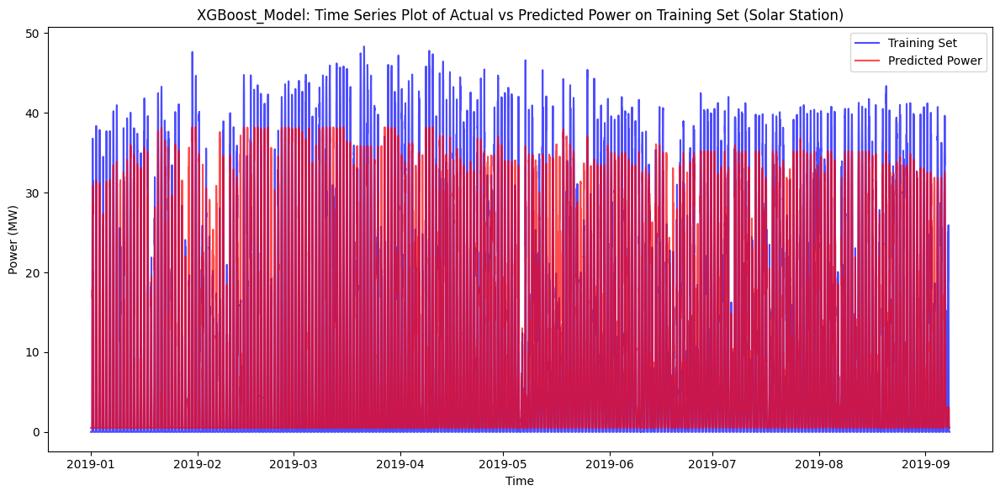

In [ ]:
# Plot Actual vs Predicted Power on Training Set
plt.figure(figsize=(12, 6))
plt.plot(train_ss.index, y_train_ss, color='blue', label='Training Set', alpha=0.7)
plt.plot(train_ss.index, y_pred_train, color='red', label='Predicted Power', alpha=0.7)
plt.xlabel('Time')
plt.ylabel('Power (MW)')
plt.title('XGBoost_Model: Time Series Plot of Actual vs Predicted Power on Training Set (Solar Station)')
plt.legend()
plt.tight_layout()
plt.savefig('images/XGBoost_Model: Predicted_power_on_Training_set.png')  # Save the plot in the 'images' folder
plt.show()

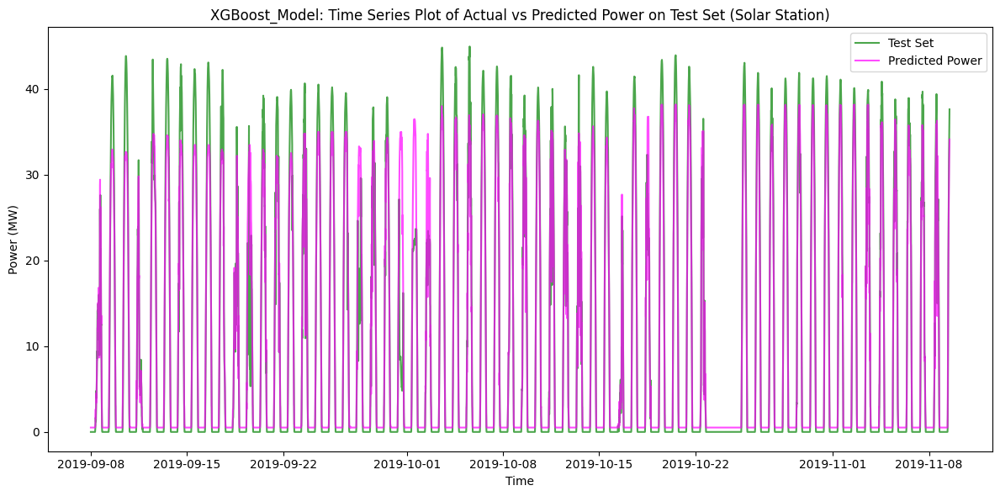

In [ ]:
# Plot Actual vs Predicted Power on Test Set
plt.figure(figsize=(12, 6))
plt.plot(test_ss.index, y_test_ss, color='green', label='Test Set', alpha=0.7)
plt.plot(test_ss.index, y_pred_test, color='magenta', label='Predicted Power', alpha=0.7)
plt.xlabel('Time')
plt.ylabel('Power (MW)')
plt.title('XGBoost_Model: Time Series Plot of Actual vs Predicted Power on Test Set (Solar Station)')
plt.legend()
plt.tight_layout()
plt.savefig('images/XGBoost_Model: Predicted_power_on_Test_set.png')  # Save the plot in the 'images' folder
plt.show()

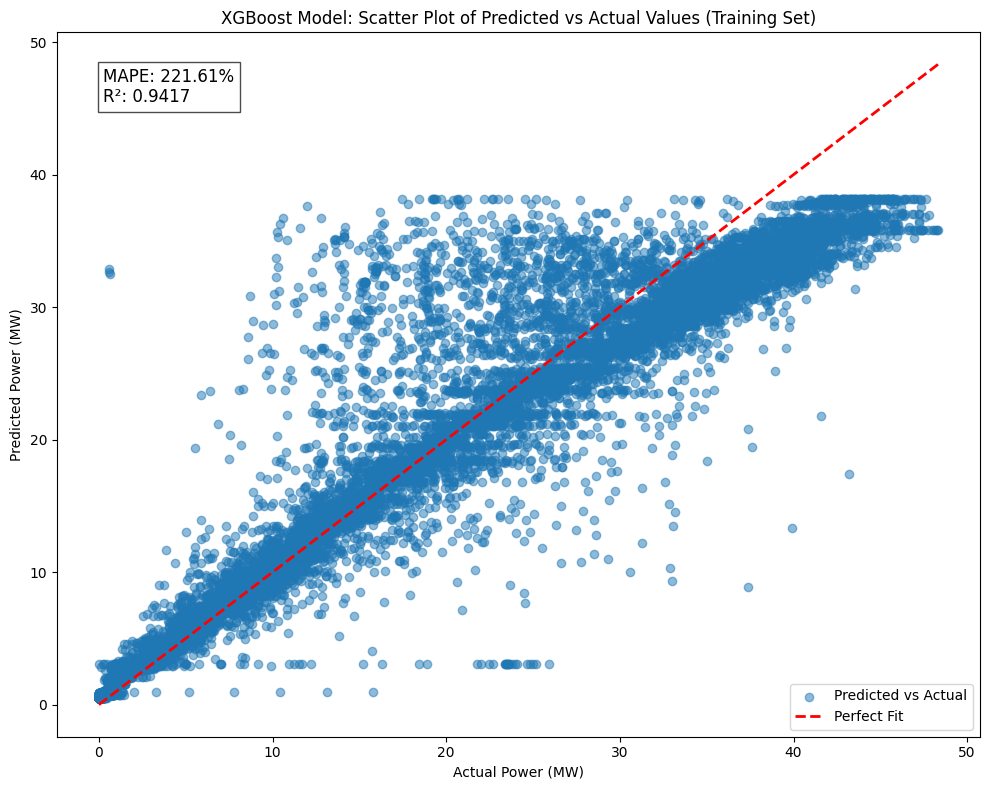

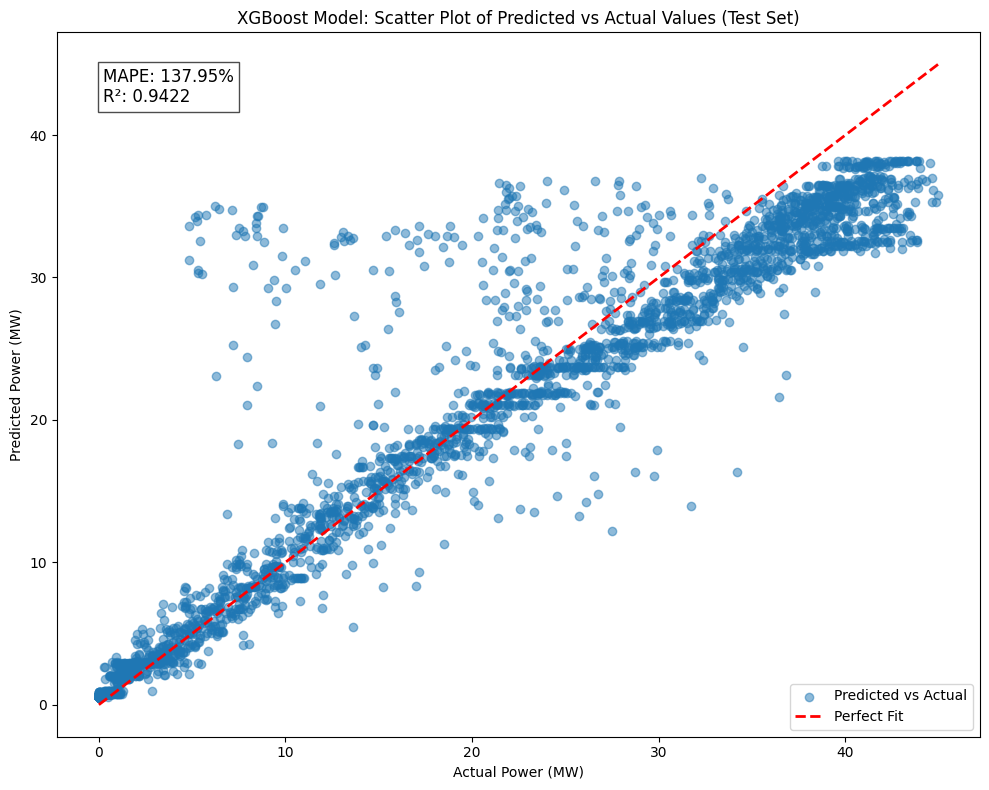

In [ ]:
# Predicted vs Actual (Training Set)
plt.figure(figsize=(10, 8))
plt.scatter(y_train_ss, y_pred_train, alpha=0.5, label='Predicted vs Actual')
plt.plot([y_train_ss.min(), y_train_ss.max()], [y_train_ss.min(), y_train_ss.max()], 'r--', lw=2, label='Perfect Fit')
plt.xlabel('Actual Power (MW)')
plt.ylabel('Predicted Power (MW)')
plt.title('XGBoost Model: Scatter Plot of Predicted vs Actual Values (Training Set)')

# Calculate and display metrics
xgb_mape_train = mape(y_train_ss, y_pred_train)
xgb_r2_train = r2_score(y_train_ss, y_pred_train)
plt.text(0.05, 0.95, f'MAPE: {xgb_mape_train:.2f}%\nR²: {xgb_r2_train:.4f}', transform=plt.gca().transAxes,
         fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7))

plt.legend(loc='lower right')
plt.tight_layout()
plt.savefig('images/XGBoost_Model_Scatter_Plot_Training_Set.png')  # Save the plot in the 'images' folder
plt.show()

# Predicted vs Actual (Test Set)
plt.figure(figsize=(10, 8))
plt.scatter(y_test_ss, y_pred_test, alpha=0.5, label='Predicted vs Actual')
plt.plot([y_test_ss.min(), y_test_ss.max()], [y_test_ss.min(), y_test_ss.max()], 'r--', lw=2, label='Perfect Fit')
plt.xlabel('Actual Power (MW)')
plt.ylabel('Predicted Power (MW)')
plt.title('XGBoost Model: Scatter Plot of Predicted vs Actual Values (Test Set)')

# Calculate and display metrics
xgb_mape_test = mape(y_test_ss, y_pred_test)
xgb_r2_test = r2_score(y_test_ss, y_pred_test)
plt.text(0.05, 0.95, f'MAPE: {xgb_mape_test:.2f}%\nR²: {xgb_r2_test:.4f}', transform=plt.gca().transAxes,
         fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.7))

plt.legend(loc='lower right')
plt.tight_layout()
plt.savefig('images/XGBoost_Model_Scatter_Plot_Test_Set.png')  # Save the plot in the 'images' folder
plt.show()

In [ ]:
# Calculate metrics for the XGBoost model
# Training set metrics
xgb_mse_train, xgb_rmse_train, xgb_mae_train, xgb_r2_train, xgb_mape_train = calculate_metrics(y_train_ss, y_pred_train)

# Test set metrics
xgb_mse_test, xgb_rmse_test, xgb_mae_test, xgb_r2_test, xgb_mape_test = calculate_metrics(y_test_ss, y_pred_test)

In [ ]:
# Below set of code prints the model's performance on the training set
print("XGBoost Model on Train set performance:")
print(f"MSE: {xgb_mse_train:.2f}")
print(f"RMSE: {xgb_rmse_train:.2f}")
print(f"MAE: {xgb_mae_train:.2f}")
print(f"R2 Score: {xgb_r2_train:.2f}")
print(f"MAPE: {xgb_mape_train:.2f}%")

# Below set of code prints the model's performance on the test set
print("\nXGBoost Model on Test set performance:")
print(f"MSE: {xgb_mse_test:.2f}")
print(f"RMSE: {xgb_rmse_test:.2f}")
print(f"MAE: {xgb_mae_test:.2f}")
print(f"R2 Score: {xgb_r2_test:.2f}")
print(f"MAPE: {xgb_mape_test:.2f}%")

XGBoost Model on Train set performance:
MSE: 11.16
RMSE: 3.34
MAE: 1.80
R2 Score: 0.94
MAPE: 221.61%

XGBoost Model on Test set performance:
MSE: 12.04
RMSE: 3.47
MAE: 1.76
R2 Score: 0.94
MAPE: 137.95%


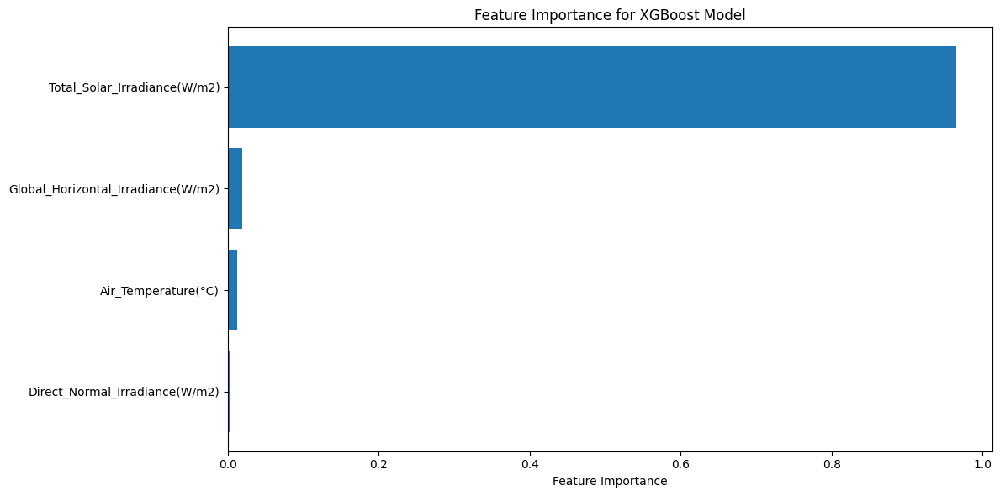

In [ ]:
# Feature importance
feature_importance = best_xgb_model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5

plt.figure(figsize=(12, 6))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_train_ss.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Feature Importance for XGBoost Model')
plt.tight_layout()
plt.savefig('images/Feature Importance for XGBoost Model.png')  # Save the plot in the 'images' folder
plt.show()

Random Forest Regressor Model performed better than the XGBoost Regressor Model.
Result shows that RF generalized when on the test data having far lesser MAPE and it has compared more features than the XGBoost.

# DEEP LEARNING MODELS

### INTRODUCTING LIBRARIES & HELPER FUNCTIONS

In [ ]:
pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.6 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, Input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import (
    Input, Dense, Dropout, Conv1D, MaxPooling1D, Flatten,
    LSTM, Bidirectional, SimpleRNN, GRU,
    LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D)
from tensorflow.keras.optimizers import Adam, Nadam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l1, l2, l1_l2
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import keras_tuner as kt
import joblib

# Set random seeds for reproducibility
import random
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
TIME_STEPS_ss = 96  # 24 hours with 15-minute intervals

In [ ]:
def create_sequences(X, y, time_steps):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X.iloc[i:(i + time_steps)].values)
        y_seq.append(y.iloc[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

In [ ]:
# Create sequences for LSTM
X_train_seq, y_train_seq = create_sequences(X_train_ss, y_train_ss, TIME_STEPS_ss)
X_test_seq, y_test_seq = create_sequences(X_test_ss, y_test_ss, TIME_STEPS_ss)

In [ ]:
print("X_train_seq shape:", X_train_seq.shape)
print("X_test_seq shape:", X_test_seq.shape)
print("y_train_seq shape:", y_train_seq.shape)
print("y_test_seq shape:", y_test_seq.shape)

X_train_seq shape: (23904, 96, 4)
X_test_seq shape: (5904, 96, 4)
y_train_seq shape: (23904,)
y_test_seq shape: (5904,)


In [ ]:
def plot_training_history(history, model_name):
    """
    Plot the training and validation loss over epochs with a title that includes the model name.

    Args:
        history (keras.callbacks.History): Training history of the model.
        model_name (str): The name of the model to include in the plot title.
    """
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Model Loss for {model_name}')  # Title includes the model name
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.tight_layout()
    plot_path = f'images/{model_name}_Model_Loss.png'
    plt.savefig(plot_path)  # Save the plot in the 'images' folder
    plt.show()
    print(f"Training history plot saved to {plot_path}")

def plot_predictions(y_true, y_pred, title):
    """
    Plot the actual vs predicted values, and save the plot.

    Args:
        y_true (pd.Series): Actual values.
        y_pred (pd.Series): Predicted values.
        title (str): Plot title.
    """
    plt.figure(figsize=(12, 6))
    plt.plot(y_true.index, y_true, label='Actual', alpha=0.7)
    plt.plot(y_true.index, y_pred, label='Predicted', alpha=0.7)
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Power (MW)')
    plt.legend()
    plt.tight_layout()
    plot_path = f'images/{title.replace(" ", "_")}.png'
    plt.savefig(plot_path)  # Save the plot in the 'images' folder
    plt.show()
    print(f"Predictions plot saved to {plot_path}")

def plot_scatter(y_true, y_pred, title):
    """
    Create a scatter plot of predicted vs actual values.

    Args:
        y_true (array-like): True values.
        y_pred (array-like): Predicted values.
        title (str): Plot title.
    """
    mape_value = mape(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    plt.figure(figsize=(10, 8))
    plt.scatter(y_true, y_pred, alpha=0.5, label='Predicted vs Actual')
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2, label='Perfect Fit')

    plt.xlabel('Actual Power (MW)')
    plt.ylabel('Predicted Power (MW)')
    plt.title(title)

    plt.text(0.05, 0.95, f'MAPE: {mape_value:.2f}%\nR²: {r2:.4f}',
             transform=plt.gca().transAxes,
             fontsize=12, verticalalignment='top',
             bbox=dict(facecolor='white', alpha=0.7))

    plt.legend(loc='lower right')
    plt.tight_layout()

    plot_path = f'images/{title.replace(" ", "_")}.png'
    plt.savefig(plot_path)  # Save the plot in the 'images' folder
    plt.show()
    print(f"Scatter plot saved to {plot_path}")

### MODEL 1: RECURRENT NEURAL NETWORK (RNN)

The following hyperparameter to be used for the RNN Model.
* 'rnn_units': [32, 64],
* 'num_rnn_layers': [1, 2],
* 'dense_layers': [1, 2],
* 'dense_units': [16, 32],
* 'dropout_rate': [0.1, 0.2, 0.3],
* 'learning_rate': [1e-4, 1e-3, 1e-2],
* 'optimizer': ['adam', 'nadam', 'rmsprop']

In [ ]:
# Define hyperparameter search space for RNN
hp_space_ss_rnn = {
    'rnn_units': [32, 64],
    'num_rnn_layers': [1, 2],
    'dense_layers': [1, 2],
    'dense_units': [16, 32],
    'dropout_rate': [0.1, 0.2, 0.3],
    'learning_rate': [1e-4, 1e-3, 1e-2],
    'optimizer': ['adam', 'nadam', 'rmsprop']
}

In [ ]:
def build_rnn_model(hp):
    """
    Build an RNN model based on the provided hyperparameters.

    Args:
        hp (HyperParameters): Hyperparameter object to sample from.

    Returns:
        keras.Sequential: Compiled RNN model.
    """
    model = keras.Sequential()

    # Adding RNN layers
    num_rnn_layers = hp.Int('num_rnn_layers', hp_space_ss_rnn['num_rnn_layers'][0], hp_space_ss_rnn['num_rnn_layers'][-1])
    for i in range(num_rnn_layers):
        return_sequences = i < num_rnn_layers - 1
        if i == 0:
            model.add(layers.SimpleRNN(
                units=hp.Choice(f'rnn_units_{i}', hp_space_ss_rnn['rnn_units']),
                return_sequences=return_sequences,
                input_shape=(TIME_STEPS_ss, len(FEATURES_ss))
            ))
        else:
            model.add(layers.SimpleRNN(
                units=hp.Choice(f'rnn_units_{i}', hp_space_ss_rnn['rnn_units']),
                return_sequences=return_sequences
            ))
        model.add(layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_rnn['dropout_rate'])))

    # Adding dense layers
    dense_layers = hp.Int('dense_layers', hp_space_ss_rnn['dense_layers'][0], hp_space_ss_rnn['dense_layers'][-1])
    for i in range(dense_layers):
        model.add(layers.Dense(
            units=hp.Choice(f'dense_units_{i}', hp_space_ss_rnn['dense_units']),
            activation='relu'
        ))
        model.add(layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_rnn['dropout_rate'])))

    model.add(layers.Dense(1))

    # Configuring optimizer
    optimizer_choice = hp.Choice('optimizer', hp_space_ss_rnn['optimizer'])
    learning_rate = hp.Float('learning_rate', hp_space_ss_rnn['learning_rate'][0], hp_space_ss_rnn['learning_rate'][-1], sampling='log')

    if optimizer_choice == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = Nadam(learning_rate=learning_rate)
    else:  # rmsprop
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model

In [ ]:
# Initialize the tuner
tuner_rnn = kt.Hyperband(
    build_rnn_model,
    objective='val_loss',
    max_epochs=30,
    factor=3,
    directory='rnn_tuning',
    project_name='solar_power_prediction_rnn'
)

# Search for the best hyperparameters
tuner_rnn.search(X_train_seq, y_train_seq,
                 epochs=50,
                 validation_split=0.2,
                 callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)])

Trial 90 Complete [00h 01m 57s]
val_loss: 15.343759536743164

Best val_loss So Far: 11.547168731689453
Total elapsed time: 01h 22m 37s


In [ ]:
# Get the best hyperparameters
best_rnn_hps = tuner_rnn.get_best_hyperparameters(num_trials=1)[0]
print("The best hyperparameters for RNN are:")
for param, value in best_rnn_hps.values.items():
    print(f"{param}: {value}")

The best hyperparameters for RNN are:
num_rnn_layers: 2
rnn_units_0: 64
dropout_rate: 0.1
dense_layers: 1
dense_units_0: 16
optimizer: adam
learning_rate: 0.00020081195253856304
rnn_units_1: 32
dense_units_1: 16
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 2
tuner/round: 1
tuner/trial_id: 0065


In [ ]:
# Build the model with the best hyperparameters
best_rnn_model = tuner_rnn.hypermodel.build(best_rnn_hps)
best_rnn_model.summary()

# Train the best model
history_rnn = best_rnn_model.fit(X_train_seq, y_train_seq,
                                 epochs=50,
                                 batch_size=32,
                                 validation_split=0.2,
                                 callbacks=[tf.keras.callbacks.EarlyStopping(patience=10)])

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ simple_rnn_2 (SimpleRNN)             │ (None, 96, 64)              │           4,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 96, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_3 (SimpleRNN)             │ (None, 32)                  │           3,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,065 (31.50 KB)

 Trainable params: 8,065 (31.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step - loss: 252.9671 - mae: 9.6880 - val_loss: 119.0458 - val_mae: 6.3824
Epoch 2/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 95.2873 - mae: 5.3338 - val_loss: 36.9802 - val_mae: 3.3267
Epoch 3/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 36.5924 - mae: 3.1964 - val_loss: 17.2225 - val_mae: 2.2440
Epoch 4/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 25.5905 - mae: 2.6752 - val_loss: 14.4568 - val_mae: 2.0963
Epoch 5/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 22.9931 - mae: 2.5017 - val_loss: 12.4618 - val_mae: 1.8805
Epoch 6/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 21.7339 - mae: 2.4260 - val_loss: 12.8153 - val_mae: 1.9143
Epoch 7/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 20.9999 - mae: 2.4086 - val_loss: 12.8024 - val_mae: 1.8980
Epoch 8/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - loss: 21.1917 - mae: 2.3991 - val_loss: 12.2191 - val_mae: 1.9102
Epoch 9/50
598/598 ━━━

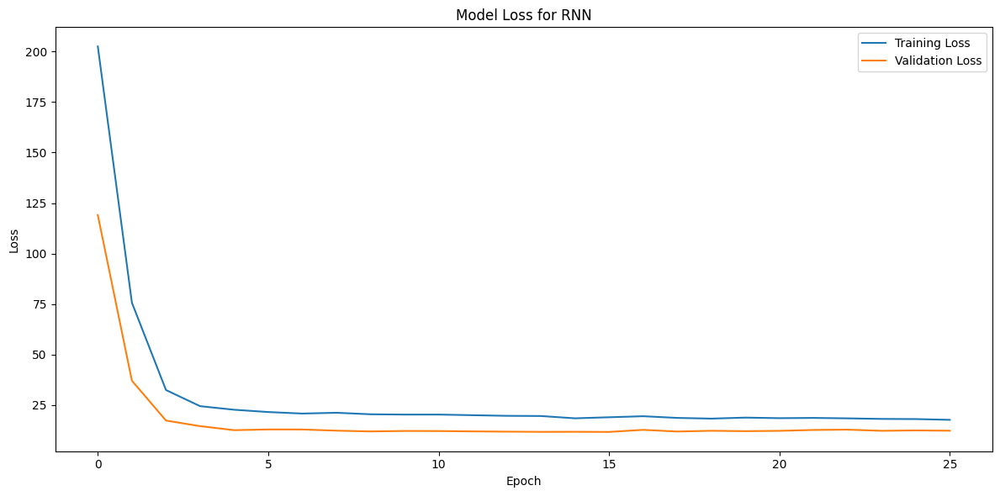

Training history plot saved to images/RNN_Model_Loss.png


In [ ]:
# Plot training history
plot_training_history(history_rnn, model_name='RNN')

In [ ]:
# Make predictions
y_pred_train = best_rnn_model.predict(X_train_seq).flatten()
y_pred_test = best_rnn_model.predict(X_test_seq).flatten()

# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Ensure consistent lengths
y_pred_train = y_pred_train[:len(y_true_train)]
y_pred_test = y_pred_test[:len(y_true_test)]

747/747 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step
185/185 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step


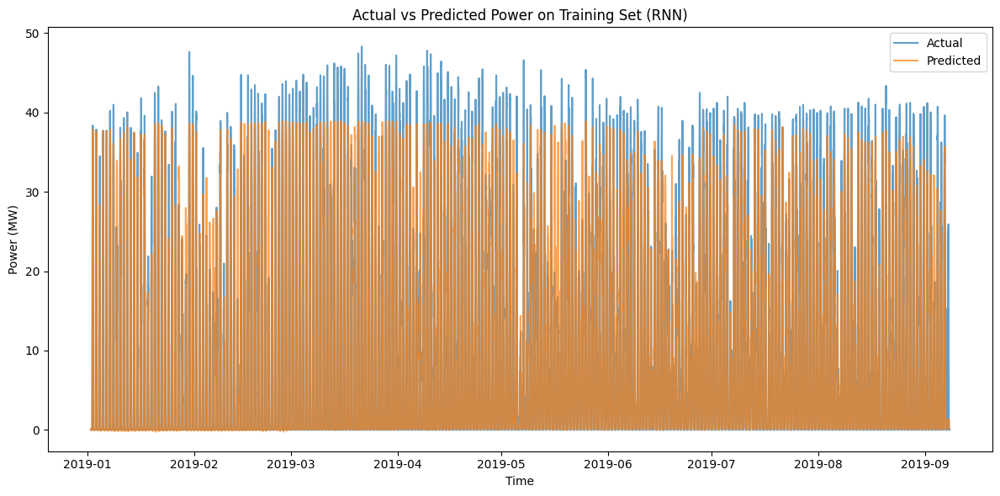

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(RNN).png


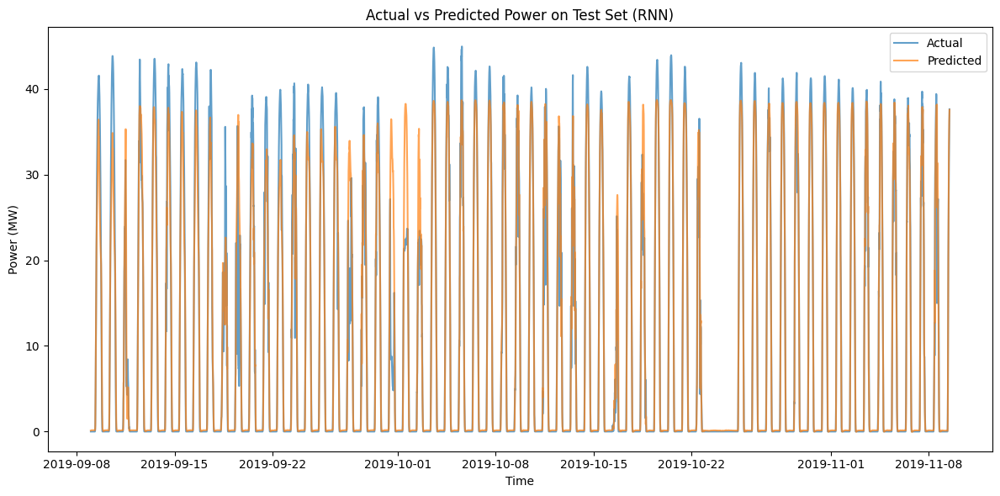

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(RNN).png


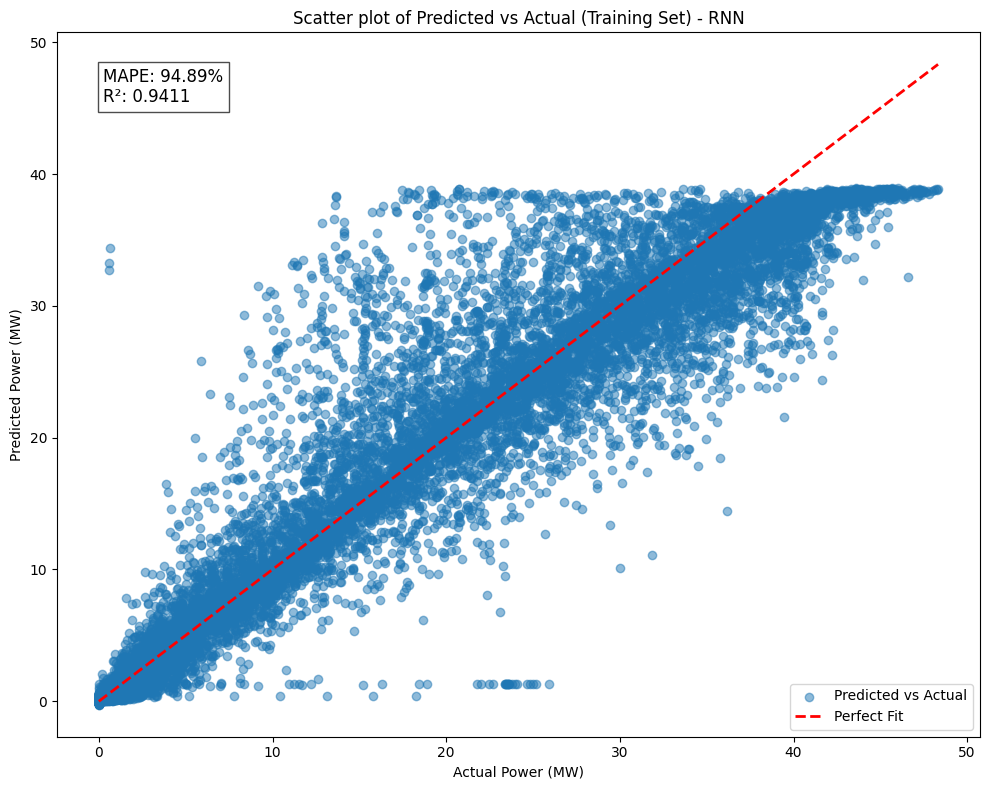

Scatter plot saved to images/Scatter_plot_of_Predicted_vs_Actual_(Training_Set)_-_RNN.png


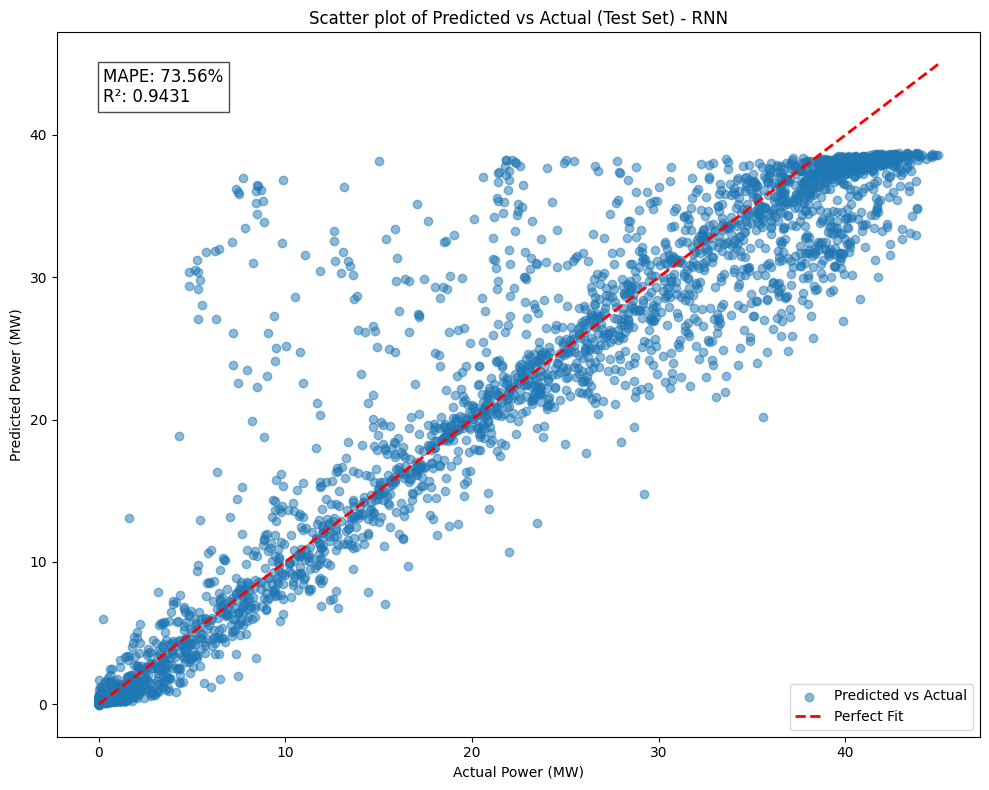

Scatter plot saved to images/Scatter_plot_of_Predicted_vs_Actual_(Test_Set)_-_RNN.png


In [ ]:
# Plot time series of actual vs predicted
plot_predictions(y_true_train, pd.Series(y_pred_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (RNN)')
plot_predictions(y_true_test, pd.Series(y_pred_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (RNN)')

# Scatter plots
plot_scatter(y_true_train, y_pred_train, 'Scatter plot of Predicted vs Actual (Training Set) - RNN')
plot_scatter(y_true_test, y_pred_test, 'Scatter plot of Predicted vs Actual (Test Set) - RNN')

In [ ]:
# Calculate metrics for the RNN model
# Training set metrics
rnn_mse_train, rnn_rmse_train, rnn_mae_train, rnn_r2_train, rnn_mape_train = calculate_metrics(y_true_train, y_pred_train)

# Test set metrics
rnn_mse_test, rnn_rmse_test, rnn_mae_test, rnn_r2_test, rnn_mape_test = calculate_metrics(y_true_test, y_pred_test)

In [ ]:
# Print the model's performance on the training set
print("RNN Model on Train set performance:")
print(f"MSE: {rnn_mse_train:.2f}")
print(f"RMSE: {rnn_rmse_train:.2f}")
print(f"MAE: {rnn_mae_train:.2f}")
print(f"R2 Score: {rnn_r2_train:.2f}")
print(f"MAPE: {rnn_mape_train:.2f}%")

# Print the model's performance on the test set
print("\nRNN Model on Test set performance:")
print(f"MSE: {rnn_mse_test:.2f}")
print(f"RMSE: {rnn_rmse_test:.2f}")
print(f"MAE: {rnn_mae_test:.2f}")
print(f"R2 Score: {rnn_r2_test:.2f}")
print(f"MAPE: {rnn_mape_test:.2f}%")

RNN Model on Train set performance:
MSE: 11.28
RMSE: 3.36
MAE: 1.61
R2 Score: 0.94
MAPE: 94.89%

RNN Model on Test set performance:
MSE: 11.97
RMSE: 3.46
MAE: 1.48
R2 Score: 0.94
MAPE: 73.56%


In [ ]:
# Save the best RNN model in the 'models' folder
model_path = 'models/best_rnn_model.h5'
best_rnn_model.save(model_path)
print("\nBest RNN Model saved successfully at:", model_path)


Best RNN Model saved successfully at: models/best_rnn_model.h5


### MODEL 2: LONG SHORT TERM MEMORY MODEL(LSTM)

The following hyperparameter to be used for the LSTM Model.
* 'lstm_units': [32, 64, 128],
* 'num_lstm_layers': [1, 2, 3],
* 'dense_units': [16, 32, 64],
* 'dropout_rate': [0.1, 0.2, 0.3],
* 'learning_rate': [1e-4, 1e-3, 1e-2],
* 'optimizer': ['adam', 'nadam', 'rmsprop']

In [ ]:
# Define hyperparameter search space for LSTM
hp_space_ss_lstm = {
    'lstm_units': [32, 64],
    'num_lstm_layers': [1, 2],
    'dense_layers': [1, 2],
    'dense_units': [16, 32],
    'dropout_rate': [0.1, 0.2, 0.3],
    'learning_rate': [1e-4, 1e-3, 1e-2],
    'optimizer': ['adam', 'nadam', 'rmsprop']
}

In [ ]:
def build_lstm_model(hp):
    """
    Build an LSTM model based on hyperparameters.

    Args:
        hp (keras_tuner.HyperParameters): Hyperparameters for tuning.

    Returns:
        keras.Sequential: A compiled LSTM model.
    """
    model = Sequential()

    # Add LSTM layers
    num_lstm_layers = hp.Int('num_lstm_layers', hp_space_ss_lstm['num_lstm_layers'][0], hp_space_ss_lstm['num_lstm_layers'][-1])
    for i in range(num_lstm_layers):
        return_sequences = i < num_lstm_layers - 1
        if i == 0:
            model.add(LSTM(
                units=hp.Choice(f'lstm_units_{i}', hp_space_ss_lstm['lstm_units']),
                return_sequences=return_sequences,
                input_shape=(TIME_STEPS_ss, len(FEATURES_ss))
            ))
        else:
            model.add(LSTM(
                units=hp.Choice(f'lstm_units_{i}', hp_space_ss_lstm['lstm_units']),
                return_sequences=return_sequences
            ))
        model.add(Dropout(hp.Choice('dropout_rate', hp_space_ss_lstm['dropout_rate'])))

    # Add Dense layers
    dense_layers = hp.Int('dense_layers', hp_space_ss_lstm['dense_layers'][0], hp_space_ss_lstm['dense_layers'][-1])
    for i in range(dense_layers):
        model.add(Dense(
            units=hp.Choice(f'dense_units_{i}', hp_space_ss_lstm['dense_units']),
            activation='relu'
        ))
        model.add(Dropout(hp.Choice('dropout_rate', hp_space_ss_lstm['dropout_rate'])))

    # Add output layer
    model.add(Dense(1))

    # Configure optimizer
    optimizer_choice = hp.Choice('optimizer', hp_space_ss_lstm['optimizer'])
    learning_rate = hp.Float('learning_rate', hp_space_ss_lstm['learning_rate'][0], hp_space_ss_lstm['learning_rate'][-1], sampling='log')

    if optimizer_choice == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = Nadam(learning_rate=learning_rate)
    else:  # rmsprop
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model

In [ ]:
# Initialize the tuner
tuner_lstm = kt.Hyperband(
    build_lstm_model,
    objective='val_loss',
    max_epochs=30,
    factor=3,
    directory='lstm_tuning',
    project_name='solar_power_prediction_lstm'
)

# Search for the best hyperparameters
tuner_lstm.search(X_train_seq, y_train_seq,
                  epochs=50,
                  validation_split=0.2,
                  callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)])

Trial 90 Complete [00h 00m 58s]
val_loss: 11.918861389160156

Best val_loss So Far: 11.548405647277832
Total elapsed time: 00h 47m 01s


In [ ]:
# Get the best hyperparameters
best_lstm_hps = tuner_lstm.get_best_hyperparameters(num_trials=1)[0]
print("The best hyperparameters for LSTM are:")
for param, value in best_lstm_hps.values.items():
    print(f"{param}: {value}")

The best hyperparameters for LSTM are:
num_lstm_layers: 2
lstm_units_0: 32
dropout_rate: 0.2
dense_layers: 1
dense_units_0: 32
optimizer: adam
learning_rate: 0.0010847808345956858
dense_units_1: 16
tuner/epochs: 30
tuner/initial_epoch: 10
tuner/bracket: 3
tuner/round: 3
lstm_units_1: 32
tuner/trial_id: 0046


In [ ]:
# # Build the model with the best hyperparameters
# best_lstm_model = tuner_lstm.hypermodel.build(best_lstm_hps)
# best_lstm_model.summary()

# # Add ModelCheckpoint callback to save the best model in Keras format
# checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
#     'best_lstm_model.keras',  # Using .keras format
#     monitor='val_loss',
#     save_best_only=True,
#     mode='min'
# )

# # Train the best model
# history_lstm = best_lstm_model.fit(X_train_seq, y_train_seq,
#                                    epochs=50,
#                                    batch_size=32,
#                                    validation_split=0.2,
#                                    callbacks=[checkpoint_callback, tf.keras.callbacks.EarlyStopping(patience=10)])

In [ ]:
# Build the model with the best hyperparameters
best_lstm_model = tuner_lstm.hypermodel.build(best_lstm_hps)
best_lstm_model.summary()

# Train the best model
history_lstm = best_lstm_model.fit(X_train_seq, y_train_seq,
                                   epochs=50,
                                   batch_size=32,
                                   validation_split=0.2,
                                   callbacks=[tf.keras.callbacks.EarlyStopping(patience=10)])

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 96, 32)              │           4,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 96, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 32)                  │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,145 (55.25 KB)

 Trainable params: 14,145 (55.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - loss: 99.1614 - mae: 5.3785 - val_loss: 13.5326 - val_mae: 2.0579
Epoch 2/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - loss: 21.5067 - mae: 2.4727 - val_loss: 13.2228 - val_mae: 2.0049
Epoch 3/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - loss: 20.0140 - mae: 2.3552 - val_loss: 13.7599 - val_mae: 2.0186
Epoch 4/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 19.1012 - mae: 2.2622 - val_loss: 13.0680 - val_mae: 1.9373
Epoch 5/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - loss: 18.5428 - mae: 2.2500 - val_loss: 13.5441 - val_mae: 2.0343
Epoch 6/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 17.0369 - mae: 2.1630 - val_loss: 12.2457 - val_mae: 1.8647
Epoch 7/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - loss: 17.3025 - mae: 2.1731 - val_loss: 11.9904 - val_mae: 1.8483
Epoch 8/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 17.2951 - mae: 2.1737 - val_loss: 13.1316 - val_mae: 1.9485
Epoch 9/50
598/598 ━━━━━━━━━━━━━

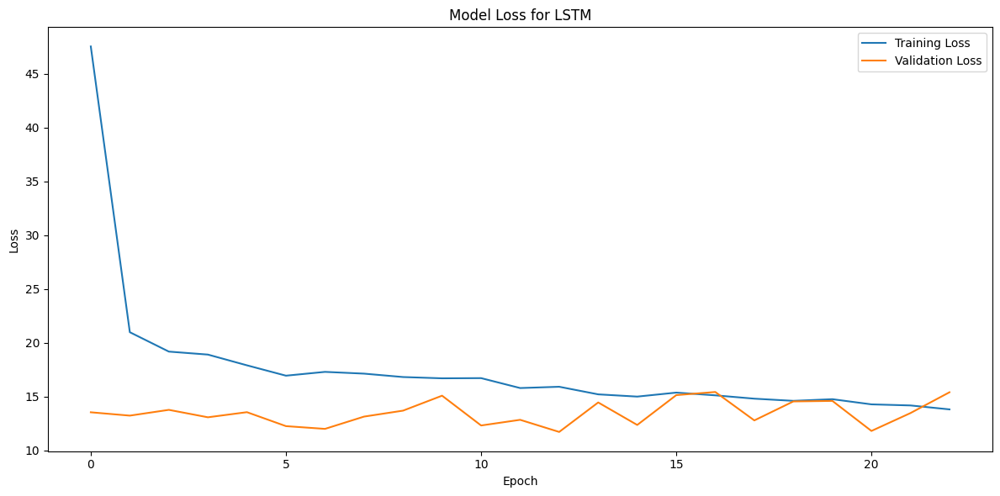

Training history plot saved to images/LSTM_Model_Loss.png


In [ ]:
# Plot training history with model name 'LSTM'
plot_training_history(history_lstm, model_name='LSTM')

In [ ]:
# Make predictions
y_pred_train = best_lstm_model.predict(X_train_seq).flatten()
y_pred_test = best_lstm_model.predict(X_test_seq).flatten()

# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Ensure consistent lengths
y_pred_train = y_pred_train[:len(y_true_train)]
y_pred_test = y_pred_test[:len(y_true_test)]


747/747 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


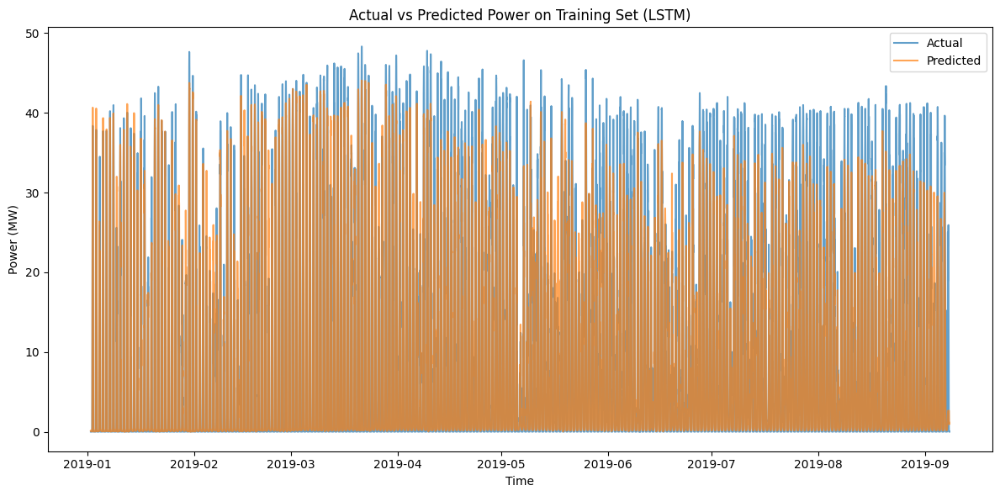

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(LSTM).png


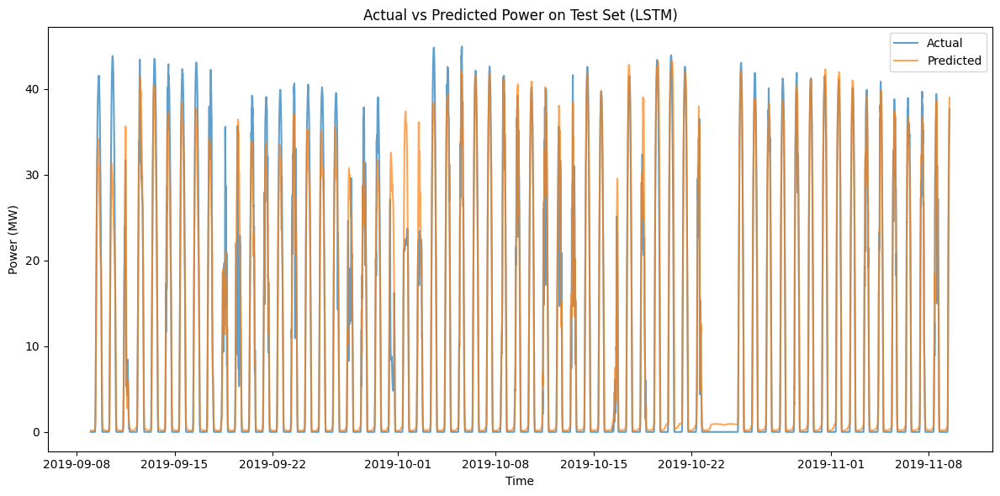

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(LSTM).png


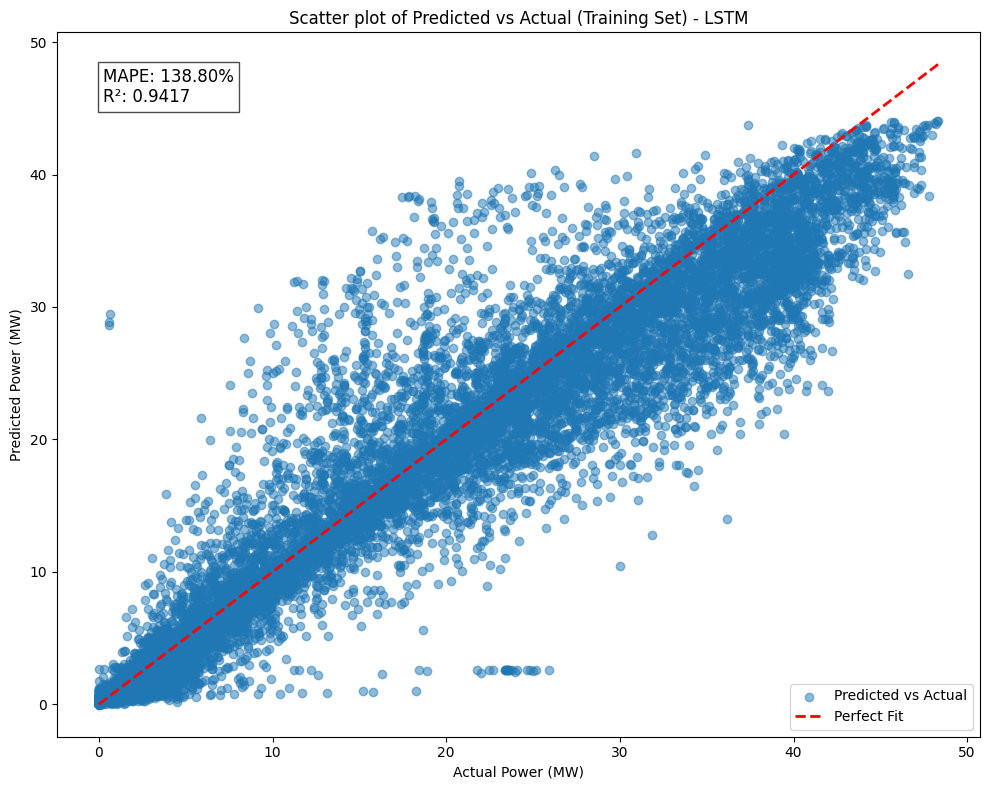

Scatter plot saved to images/Scatter_plot_of_Predicted_vs_Actual_(Training_Set)_-_LSTM.png


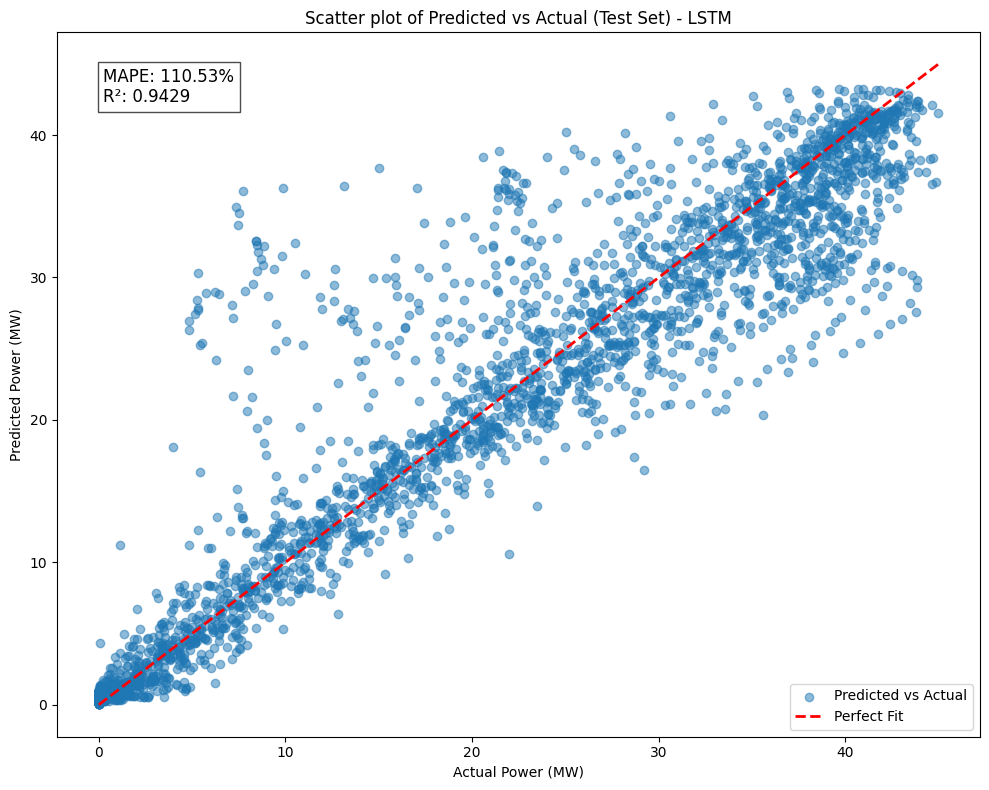

Scatter plot saved to images/Scatter_plot_of_Predicted_vs_Actual_(Test_Set)_-_LSTM.png


In [ ]:
# Plot time series of actual vs predicted for the LSTM model
plot_predictions(y_true_train, pd.Series(y_pred_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (LSTM)')
plot_predictions(y_true_test, pd.Series(y_pred_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (LSTM)')

# Scatter plots with model name 'LSTM'
plot_scatter(y_true_train, y_pred_train, 'Scatter plot of Predicted vs Actual (Training Set) - LSTM')
plot_scatter(y_true_test, y_pred_test, 'Scatter plot of Predicted vs Actual (Test Set) - LSTM')

In [ ]:
# Calculate metrics for the LSTM model
# Training set metrics
lstm_mse_train, lstm_rmse_train, lstm_mae_train, lstm_r2_train, lstm_mape_train = calculate_metrics(y_true_train, y_pred_train)

# Test set metrics
lstm_mse_test, lstm_rmse_test, lstm_mae_test, lstm_r2_test, lstm_mape_test = calculate_metrics(y_true_test, y_pred_test)

# Print the LSTM model's performance on the training set
print("\nLSTM Model on Train set performance:")
print(f"MSE: {lstm_mse_train:.2f}")
print(f"RMSE: {lstm_rmse_train:.2f}")
print(f"MAE: {lstm_mae_train:.2f}")
print(f"R2 Score: {lstm_r2_train:.2f}")
print(f"MAPE: {lstm_mape_train:.2f}%")

# Print the LSTM model's performance on the test set
print("\nLSTM Model on Test set performance:")
print(f"MSE: {lstm_mse_test:.2f}")
print(f"RMSE: {lstm_rmse_test:.2f}")
print(f"MAE: {lstm_mae_test:.2f}")
print(f"R2 Score: {lstm_r2_test:.2f}")
print(f"MAPE: {lstm_mape_test:.2f}%")


LSTM Model on Train set performance:
MSE: 11.17
RMSE: 3.34
MAE: 1.70
R2 Score: 0.94
MAPE: 138.80%

LSTM Model on Test set performance:
MSE: 12.01
RMSE: 3.47
MAE: 1.60
R2 Score: 0.94
MAPE: 110.53%


In [ ]:
# Save the best LSTM model in the 'models' folder
model_path = 'models/best_lstm_model.h5'
best_lstm_model.save(model_path)
print("\nBest LSTM Model saved successfully at:", model_path)


Best LSTM Model saved successfully at: models/best_lstm_model.h5


### MODEL 3: GATED RECURRENT UNIT (GRU) MODEL

The following hyperparametes to be used in the GRU Model
* 'gru_units': [32, 64],
* 'num_gru_layers': [1, 2],
* 'dense_layers': [1, 2],
* 'dense_units': [16, 32],
* 'dropout_rate': [0.1, 0.2, 0.3],
* 'learning_rate': [1e-4, 1e-3, 1e-2],
* 'optimizer': ['adam', 'nadam', 'rmsprop']

In [ ]:
# Define hyperparameter search space for GRU
hp_space_ss_gru = {
    'gru_units': [32, 64],
    'num_gru_layers': [1, 2],
    'dense_layers': [1, 2],
    'dense_units': [16, 32],
    'dropout_rate': [0.1, 0.2, 0.3],
    'learning_rate': [1e-4, 1e-3, 1e-2],
    'optimizer': ['adam', 'nadam', 'rmsprop']
}

In [ ]:
def build_gru_model(hp):
    """
    Build a GRU model based on the provided hyperparameters.

    Args:
        hp (HyperParameters): Hyperparameter object to sample from.

    Returns:
        keras.Sequential: Compiled GRU model.
    """
    model = keras.Sequential()

    # Adding GRU layers
    num_gru_layers = hp.Int('num_gru_layers', hp_space_ss_gru['num_gru_layers'][0], hp_space_ss_gru['num_gru_layers'][-1])
    for i in range(num_gru_layers):
        return_sequences = i < num_gru_layers - 1
        if i == 0:
            model.add(layers.GRU(
                units=hp.Choice(f'gru_units_{i}', hp_space_ss_gru['gru_units']),
                return_sequences=return_sequences,
                input_shape=(TIME_STEPS_ss, len(FEATURES_ss))
            ))
        else:
            model.add(layers.GRU(
                units=hp.Choice(f'gru_units_{i}', hp_space_ss_gru['gru_units']),
                return_sequences=return_sequences
            ))
        model.add(layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_gru['dropout_rate'])))

    # Adding dense layers
    dense_layers = hp.Int('dense_layers', hp_space_ss_gru['dense_layers'][0], hp_space_ss_gru['dense_layers'][-1])
    for i in range(dense_layers):
        model.add(layers.Dense(
            units=hp.Choice(f'dense_units_{i}', hp_space_ss_gru['dense_units']),
            activation='relu'
        ))
        model.add(layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_gru['dropout_rate'])))

    model.add(layers.Dense(1))

    # Configuring optimizer
    optimizer_choice = hp.Choice('optimizer', hp_space_ss_gru['optimizer'])
    learning_rate = hp.Float('learning_rate', hp_space_ss_gru['learning_rate'][0], hp_space_ss_gru['learning_rate'][-1], sampling='log')

    if optimizer_choice == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = Nadam(learning_rate=learning_rate)
    else:  # rmsprop
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model

In [ ]:
# Initialize the tuner
tuner_gru = kt.Hyperband(
    build_gru_model,
    objective='val_loss',
    max_epochs=30,
    factor=3,
    directory='gru_tuning',
    project_name='solar_power_prediction_gru'
)

# Search for the best hyperparameters
tuner_gru.search(X_train_seq, y_train_seq,
                 epochs=50,
                 validation_split=0.2,
                 callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)])


Trial 90 Complete [00h 01m 06s]
val_loss: 13.232236862182617

Best val_loss So Far: 11.428974151611328
Total elapsed time: 00h 48m 28s


In [ ]:
# Get the best hyperparameters
best_gru_hps = tuner_gru.get_best_hyperparameters(num_trials=1)[0]
print("The best hyperparameters for GRU are:")
for param, value in best_gru_hps.values.items():
    print(f"{param}: {value}")


The best hyperparameters for GRU are:
num_gru_layers: 2
gru_units_0: 64
dropout_rate: 0.1
dense_layers: 1
dense_units_0: 32
optimizer: rmsprop
learning_rate: 0.000849815059776374
dense_units_1: 16
gru_units_1: 64
tuner/epochs: 30
tuner/initial_epoch: 10
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0078


In [ ]:
# Build the model with the best hyperparameters
best_gru_model = tuner_gru.hypermodel.build(best_gru_hps)
best_gru_model.summary()

# Train the best model
history_gru = best_gru_model.fit(X_train_seq, y_train_seq,
                                 epochs=50,
                                 batch_size=32,
                                 validation_split=0.2,
                                 callbacks=[tf.keras.callbacks.EarlyStopping(patience=10)])

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_2 (GRU)                          │ (None, 96, 64)              │          13,440 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 96, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_3 (GRU)                          │ (None, 64)                  │          24,960 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 40,513 (158.25 KB)

 Trainable params: 40,513 (158.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - loss: 54.3910 - mae: 3.7631 - val_loss: 14.9028 - val_mae: 2.1735
Epoch 2/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 17.1184 - mae: 2.0864 - val_loss: 14.2504 - val_mae: 2.0784
Epoch 3/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 16.4515 - mae: 2.0398 - val_loss: 13.7670 - val_mae: 1.9858
Epoch 4/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 15.8445 - mae: 1.9901 - val_loss: 12.9084 - val_mae: 1.8835
Epoch 5/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 15.3912 - mae: 1.9481 - val_loss: 13.1116 - val_mae: 1.9014
Epoch 6/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 14.9312 - mae: 1.9213 - val_loss: 12.5778 - val_mae: 1.8649
Epoch 7/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - loss: 14.6720 - mae: 1.9021 - val_loss: 12.7241 - val_mae: 1.8192
Epoch 8/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - loss: 13.9657 - mae: 1.8714 - val_loss: 12.8924 - val_mae: 1.8924
Epoch 9/50
598/598 ━━━━━━━━━━━━━━━━━━━━

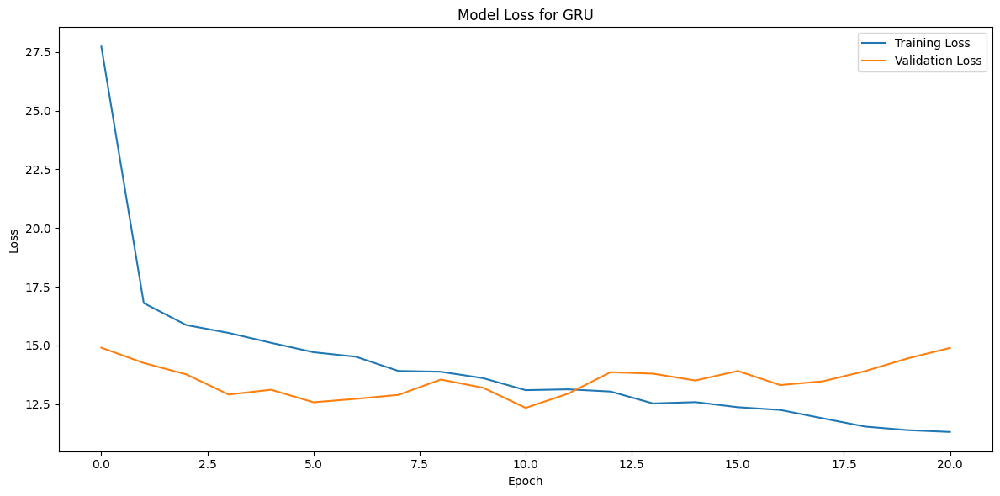

Training history plot saved to images/GRU_Model_Loss.png


In [ ]:
# Plot training history with model name 'GRU'
plot_training_history(history_gru, model_name='GRU')

In [ ]:
# Make predictions
y_pred_train = best_gru_model.predict(X_train_seq).flatten()
y_pred_test = best_gru_model.predict(X_test_seq).flatten()

# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Ensure consistent lengths
y_pred_train = y_pred_train[:len(y_true_train)]
y_pred_test = y_pred_test[:len(y_true_test)]


747/747 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


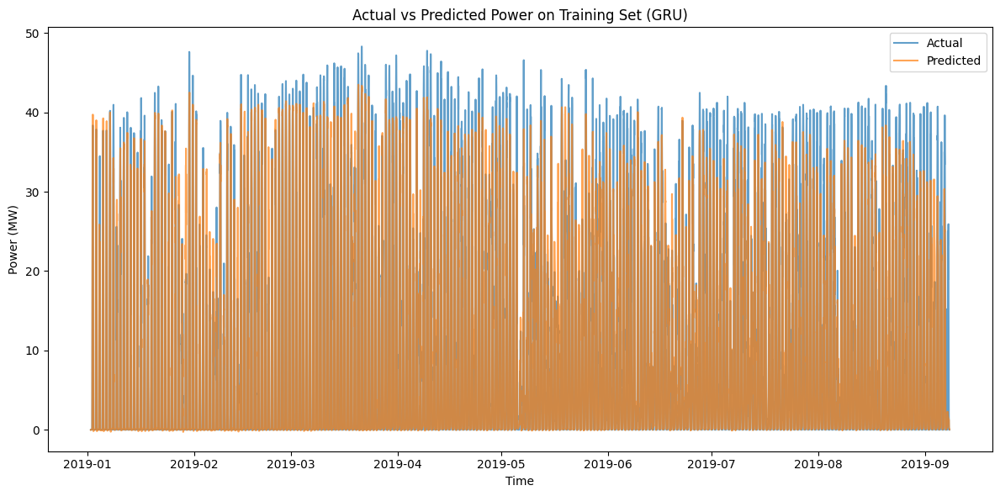

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(GRU).png


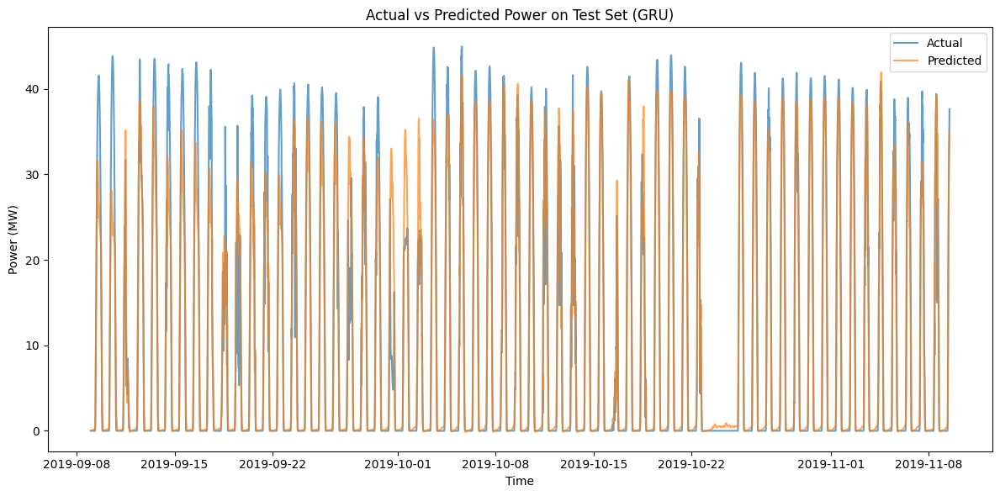

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(GRU).png


In [ ]:
# Plot time series of actual vs predicted for the GRU model
plot_predictions(y_true_train, pd.Series(y_pred_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (GRU)')
plot_predictions(y_true_test, pd.Series(y_pred_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (GRU)')


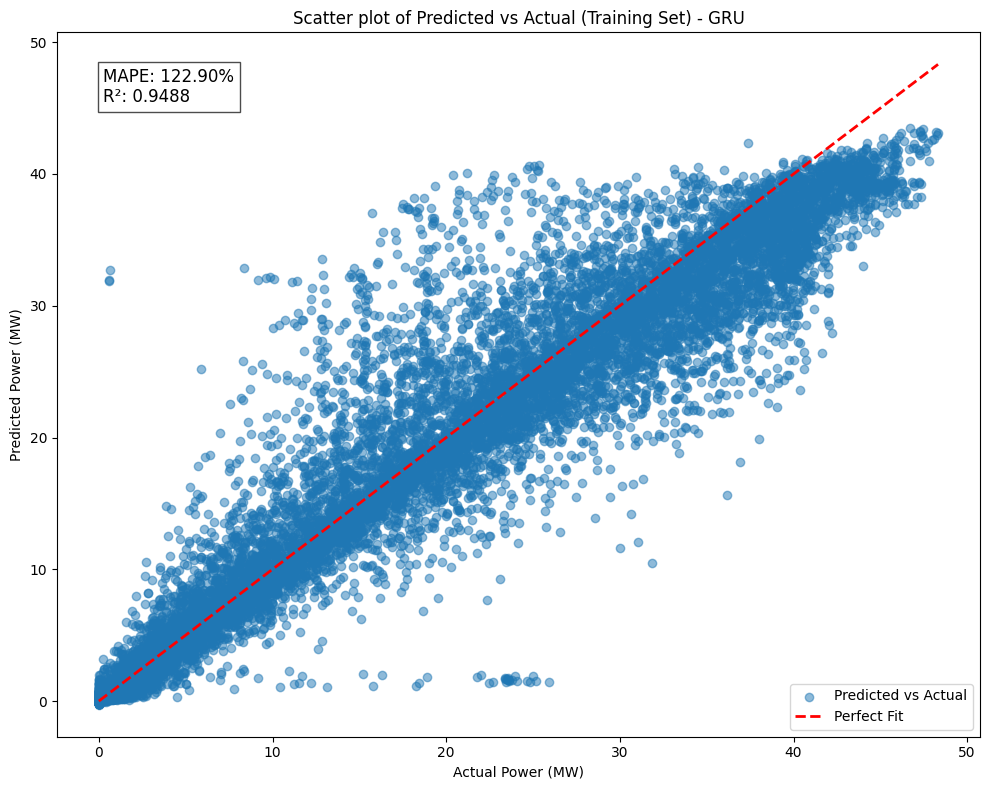

Scatter plot saved to images/Scatter_plot_of_Predicted_vs_Actual_(Training_Set)_-_GRU.png


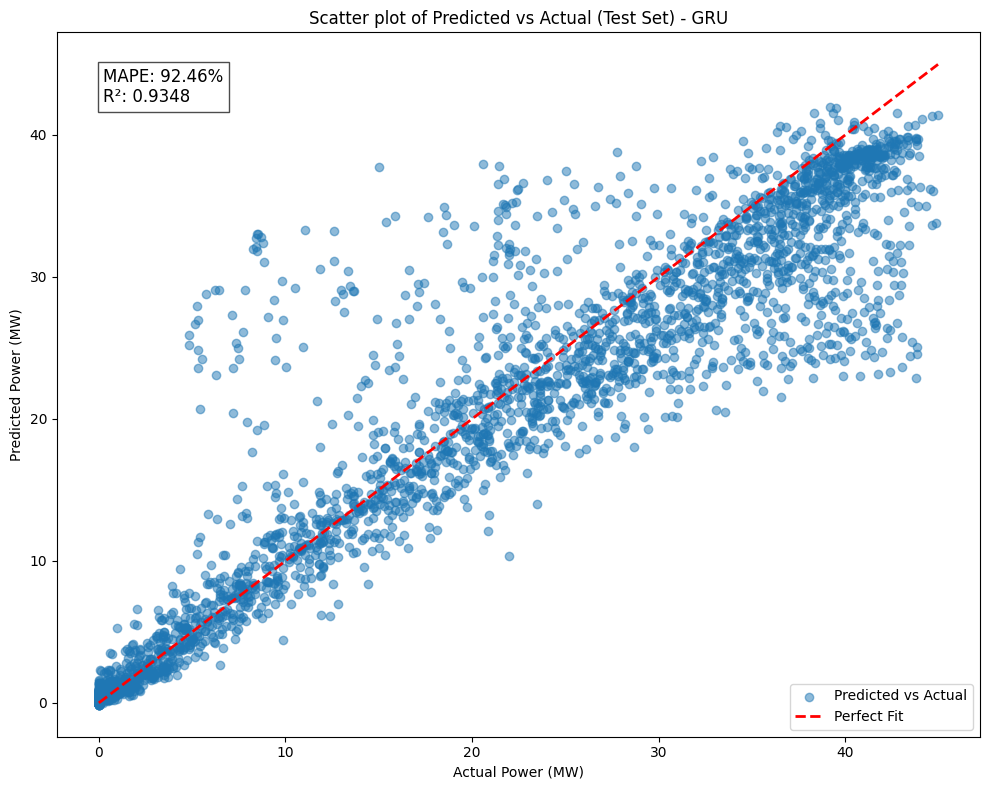

Scatter plot saved to images/Scatter_plot_of_Predicted_vs_Actual_(Test_Set)_-_GRU.png


In [ ]:
# Scatter plots with model name 'GRU'
plot_scatter(y_true_train, y_pred_train, 'Scatter plot of Predicted vs Actual (Training Set) - GRU')
plot_scatter(y_true_test, y_pred_test, 'Scatter plot of Predicted vs Actual (Test Set) - GRU')


In [ ]:
# Calculate metrics for the GRU model
# Training set metrics
(gru_mse_train, gru_rmse_train, gru_mae_train,
 gru_r2_train, gru_mape_train) = calculate_metrics(
    y_true_train, y_pred_train
)

# Test set metrics
(gru_mse_test, gru_rmse_test, gru_mae_test,
 gru_r2_test, gru_mape_test) = calculate_metrics(
    y_true_test, y_pred_test
)

# Print the GRU model's performance on the training set
print("\nGRU Model on Train set performance:")
print(f"MSE: {gru_mse_train:.2f}")
print(f"RMSE: {gru_rmse_train:.2f}")
print(f"MAE: {gru_mae_train:.2f}")
print(f"R2 Score: {gru_r2_train:.2f}")
print(f"MAPE: {gru_mape_train:.2f}%")

# Print the GRU model's performance on the test set
print("\nGRU Model on Test set performance:")
print(f"MSE: {gru_mse_test:.2f}")
print(f"RMSE: {gru_rmse_test:.2f}")
print(f"MAE: {gru_mae_test:.2f}")
print(f"R2 Score: {gru_r2_test:.2f}")
print(f"MAPE: {gru_mape_test:.2f}%")

# Save the best GRU model in the 'models' folder
model_path = 'models/best_gru_model.h5'
best_gru_model.save(model_path)
print("\nBest GRU Model saved successfully at:", model_path)


GRU Model on Train set performance:
MSE: 9.81
RMSE: 3.13
MAE: 1.51
R2 Score: 0.95
MAPE: 122.90%

GRU Model on Test set performance:
MSE: 13.72
RMSE: 3.70
MAE: 1.71
R2 Score: 0.93
MAPE: 92.46%

Best GRU Model saved successfully at: models/best_gru_model.h5


### MODEL 4: USING CONVOLUTIONAL NEURAL NETWORK (CNN)

The following hyperparameters to be used in the CNN Model
* 'conv_filters': [32, 64],
* 'kernel_size': [3,5],
* 'num_conv_layers': [1, 2],
* 'dense_layers': [1, 2],
* 'dense_units': [16, 32],
* 'dropout_rate': [0.1, 0.2, 0.3],
* 'learning_rate': [1e-4, 1e-3, 1e-2],
* 'optimizer': ['adam', 'nadam', 'rmsprop']

In [ ]:
# Define hyperparameter search space for Conv1D
hp_space_ss_cnn = {
    'conv_filters': [32, 64],
    'kernel_size': [3,5],
    'num_conv_layers': [1, 2],
    'dense_layers': [1, 2],
    'dense_units': [16, 32],
    'dropout_rate': [0.1, 0.2, 0.3],
    'learning_rate': [1e-4, 1e-3, 1e-2],
    'optimizer': ['adam', 'nadam', 'rmsprop']
}

In [ ]:
def build_cnn_model(hp):
    """
    Build a Conv1D model based on the provided hyperparameters.

    Args:
        hp (HyperParameters): Hyperparameter object to sample from.

    Returns:
        keras.Sequential: Compiled Conv1D model.
    """
    model = keras.Sequential()

    # Adding Conv1D layers
    num_conv_layers = hp.Int('num_conv_layers', hp_space_ss_cnn['num_conv_layers'][0], hp_space_ss_cnn['num_conv_layers'][-1])
    for i in range(num_conv_layers):
        if i == 0:
            model.add(layers.Conv1D(
                filters=hp.Choice(f'conv_filters_{i}', hp_space_ss_cnn['conv_filters']),
                kernel_size=hp.Choice(f'kernel_size_{i}', hp_space_ss_cnn['kernel_size']),
                activation='relu',
                input_shape=(TIME_STEPS_ss, len(FEATURES_ss))
            ))
        else:
            model.add(layers.Conv1D(
                filters=hp.Choice(f'conv_filters_{i}', hp_space_ss_cnn['conv_filters']),
                kernel_size=hp.Choice(f'kernel_size_{i}', hp_space_ss_cnn['kernel_size']),
                activation='relu'
            ))
        model.add(layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn['dropout_rate'])))
        model.add(layers.MaxPooling1D())

    model.add(layers.Flatten())

    # Adding dense layers
    dense_layers = hp.Int('dense_layers', hp_space_ss_cnn['dense_layers'][0], hp_space_ss_cnn['dense_layers'][-1])
    for i in range(dense_layers):
        model.add(layers.Dense(
            units=hp.Choice(f'dense_units_{i}', hp_space_ss_cnn['dense_units']),
            activation='relu'
        ))
        model.add(layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn['dropout_rate'])))

    model.add(layers.Dense(1))

    # Configuring optimizer
    optimizer_choice = hp.Choice('optimizer', hp_space_ss_cnn['optimizer'])
    learning_rate = hp.Float('learning_rate', hp_space_ss_cnn['learning_rate'][0], hp_space_ss_cnn['learning_rate'][-1], sampling='log')

    if optimizer_choice == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = Nadam(learning_rate=learning_rate)
    else:  # rmsprop
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model

In [ ]:
# Initialize the tuner
tuner_cnn = kt.Hyperband(
    build_cnn_model,
    objective='val_loss',
    max_epochs=30,
    factor=3,
    directory='cnn_tuning',
    project_name='solar_power_prediction_cnn'
)

# Search for the best hyperparameters
tuner_cnn.search(X_train_seq, y_train_seq,
                 epochs=50,
                 validation_split=0.2,
                 callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)])

Trial 90 Complete [00h 00m 31s]
val_loss: 21.3350772857666

Best val_loss So Far: 12.985053062438965
Total elapsed time: 00h 27m 12s


In [ ]:
# Get the best hyperparameters
best_cnn_hps = tuner_cnn.get_best_hyperparameters(num_trials=1)[0]
print("The best hyperparameters for Conv1D are:")
for param, value in best_cnn_hps.values.items():
    print(f"{param}: {value}")

The best hyperparameters for Conv1D are:
num_conv_layers: 1
conv_filters_0: 32
kernel_size_0: 3
dropout_rate: 0.1
dense_layers: 2
dense_units_0: 32
optimizer: rmsprop
learning_rate: 0.0015931111127028602
conv_filters_1: 32
kernel_size_1: 5
dense_units_1: 16
tuner/epochs: 30
tuner/initial_epoch: 10
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 0067


In [ ]:
# Build the model with the best hyperparameters
best_cnn_model = tuner_cnn.hypermodel.build(best_cnn_hps)
best_cnn_model.summary()

# Train the best model
history_cnn = best_cnn_model.fit(X_train_seq, y_train_seq,
                                 epochs=50,
                                 batch_size=32,
                                 validation_split=0.2,
                                 callbacks=[tf.keras.callbacks.EarlyStopping(patience=10)])

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)                    │ (None, 94, 32)              │             416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 94, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 47, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1504)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 32)                  │          48,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 49,121 (191.88 KB)

 Trainable params: 49,121 (191.88 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 40.8438 - mae: 3.4669 - val_loss: 25.1035 - val_mae: 2.9543
Epoch 2/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 21.8881 - mae: 2.4453 - val_loss: 37.6597 - val_mae: 3.6792
Epoch 3/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 20.8263 - mae: 2.3446 - val_loss: 19.4166 - val_mae: 2.5710
Epoch 4/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 19.2056 - mae: 2.2737 - val_loss: 23.1656 - val_mae: 2.8236
Epoch 5/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 17.9613 - mae: 2.2081 - val_loss: 20.8082 - val_mae: 2.7036
Epoch 6/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 17.8519 - mae: 2.1943 - val_loss: 23.3503 - val_mae: 2.9143
Epoch 7/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 17.2656 - mae: 2.1520 - val_loss: 17.6803 - val_mae: 2.4868
Epoch 8/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 16.7655 - mae: 2.1302 - val_loss: 18.6810 - val_mae: 2.5476
Epoch 9/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 

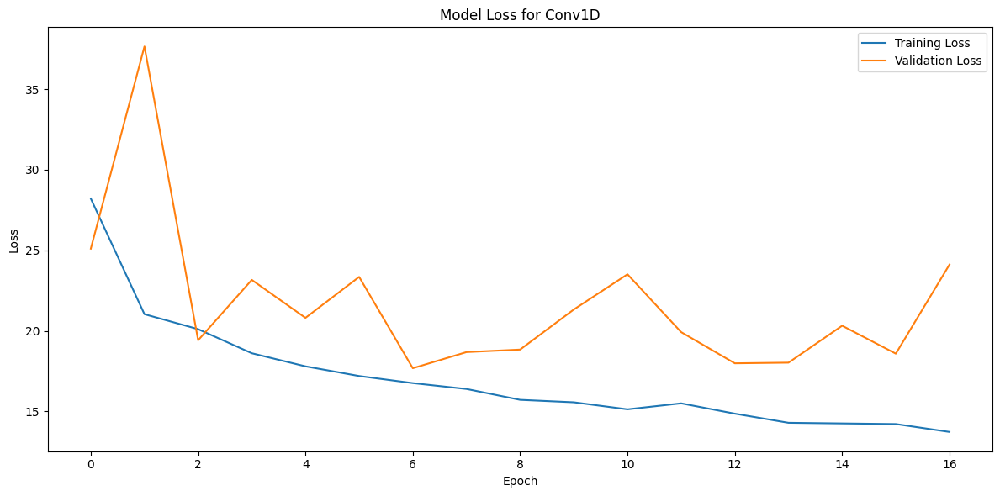

Training history plot saved to images/Conv1D_Model_Loss.png


In [ ]:
# Plot training history with model name 'Conv1D'
plot_training_history(history_cnn, model_name='Conv1D')

In [ ]:
# Make predictions
y_pred_train = best_cnn_model.predict(X_train_seq).flatten()
y_pred_test = best_cnn_model.predict(X_test_seq).flatten()

# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Ensure consistent lengths
y_pred_train = y_pred_train[:len(y_true_train)]
y_pred_test = y_pred_test[:len(y_true_test)]

747/747 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


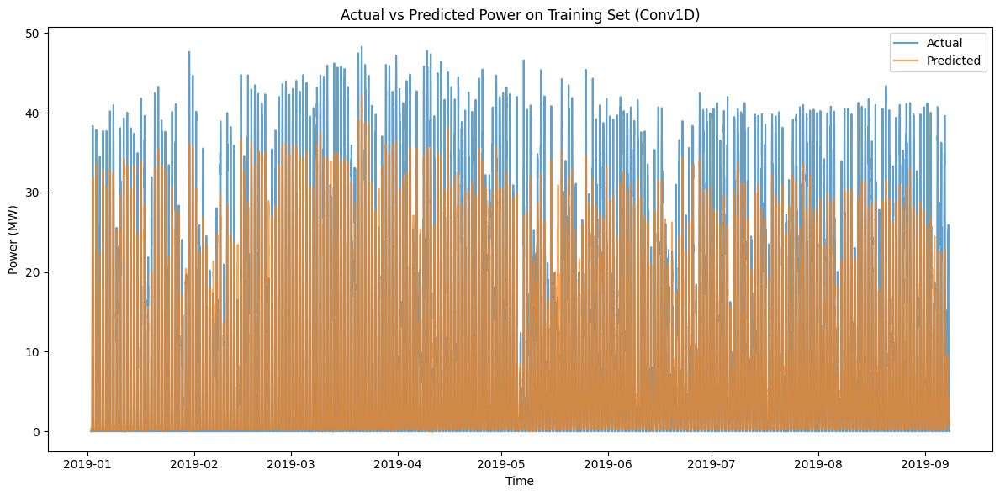

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(Conv1D).png


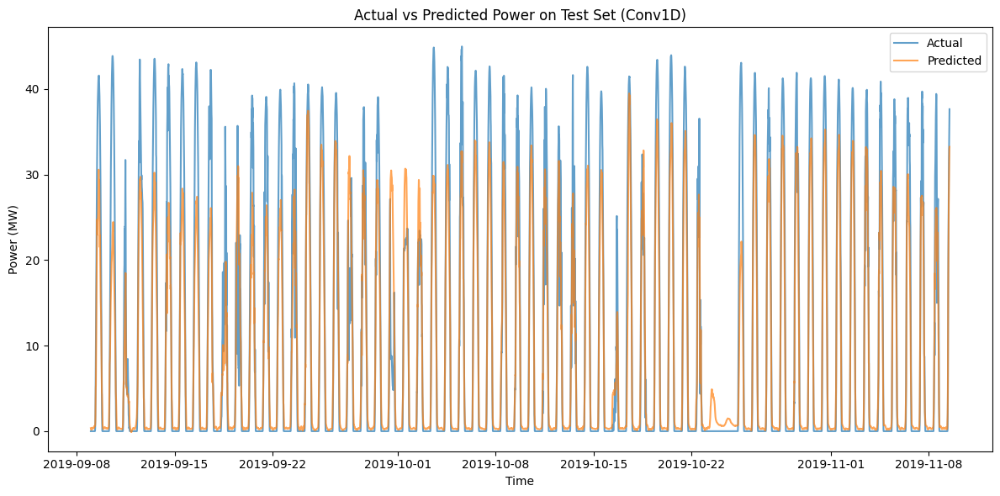

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(Conv1D).png


In [ ]:
# Plot time series of actual vs predicted for the Conv1D model
plot_predictions(y_true_train, pd.Series(y_pred_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (Conv1D)')
plot_predictions(y_true_test, pd.Series(y_pred_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (Conv1D)')


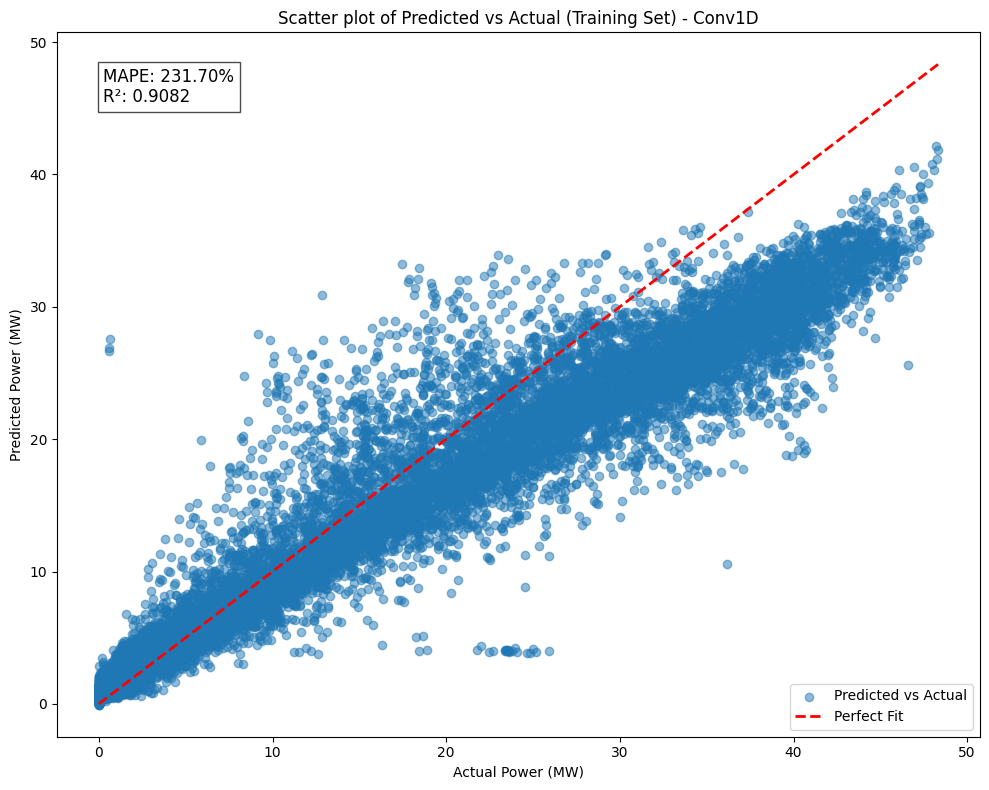

Scatter plot saved to images/Scatter_plot_of_Predicted_vs_Actual_(Training_Set)_-_Conv1D.png


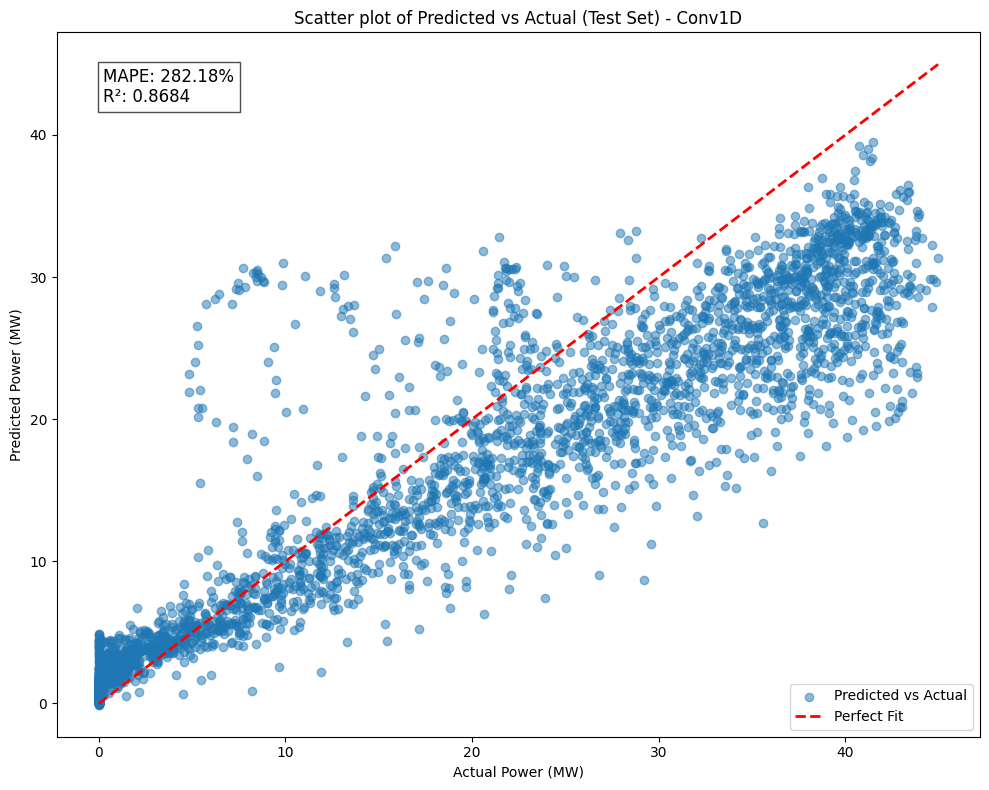

Scatter plot saved to images/Scatter_plot_of_Predicted_vs_Actual_(Test_Set)_-_Conv1D.png


In [ ]:
# Scatter plots with model name 'Conv1D'
plot_scatter(y_true_train, y_pred_train, 'Scatter plot of Predicted vs Actual (Training Set) - Conv1D')
plot_scatter(y_true_test, y_pred_test, 'Scatter plot of Predicted vs Actual (Test Set) - Conv1D')


In [ ]:
# Calculate metrics for the CNN model
# Training set metrics
(cnn_mse_train, cnn_rmse_train, cnn_mae_train,
 cnn_r2_train, cnn_mape_train) = calculate_metrics(
    y_true_train, y_pred_train
)

# Test set metrics
(cnn_mse_test, cnn_rmse_test, cnn_mae_test,
 cnn_r2_test, cnn_mape_test) = calculate_metrics(
    y_true_test, y_pred_test
)

# Print the CNN model's performance on the training set
print("\nCNN Model on Train set performance:")
print(f"MSE: {cnn_mse_train:.2f}")
print(f"RMSE: {cnn_rmse_train:.2f}")
print(f"MAE: {cnn_mae_train:.2f}")
print(f"R2 Score: {cnn_r2_train:.2f}")
print(f"MAPE: {cnn_mape_train:.2f}%")

# Print the CNN model's performance on the test set
print("\nCNN Model on Test set performance:")
print(f"MSE: {cnn_mse_test:.2f}")
print(f"RMSE: {cnn_rmse_test:.2f}")
print(f"MAE: {cnn_mae_test:.2f}")
print(f"R2 Score: {cnn_r2_test:.2f}")
print(f"MAPE: {cnn_mape_test:.2f}%")

# Save the best CNN model in the 'models' folder
model_path = 'models/best_cnn_model.h5'
best_cnn_model.save(model_path)
print("\nBest CNN Model saved successfully at:", model_path)


CNN Model on Train set performance:
MSE: 17.57
RMSE: 4.19
MAE: 2.42
R2 Score: 0.91
MAPE: 231.70%

CNN Model on Test set performance:
MSE: 27.70
RMSE: 5.26
MAE: 2.99
R2 Score: 0.87
MAPE: 282.18%

Best CNN Model saved successfully at: models/best_cnn_model.h5


### MODEL 5: TRANSFORMERS MODEL

The following hyperparameters to be used in the Transformer Model
* 'num_transformer_blocks': [1, 2],
* 'num_heads': [2, 4],
* 'key_dim': [16, 32],
* 'ff_dim': [32, 64],
* 'dense_layers': [1, 2],
* 'dense_units': [32, 64],
* 'dropout_rate': [0.1, 0.2, 0.3],
* 'learning_rate': [1e-4, 1e-3, 1e-2],
* 'optimizer': ['adam', 'nadam', 'rmsprop']

In [ ]:
# Define hyperparameter search space for Transformer
hp_space_ss_transformer = {
    'num_transformer_blocks': [1, 2],
    'num_heads': [2, 4],
    'key_dim': [16, 32],
    'ff_dim': [32, 64],
    'dense_layers': [1, 2],
    'dense_units': [32, 64],
    'dropout_rate': [0.1, 0.2, 0.3],
    'learning_rate': [1e-4, 1e-3, 1e-2],
    'optimizer': ['adam', 'nadam', 'rmsprop']
}

In [ ]:
def build_transformer_model(hp):
    """
    Build a Transformer model based on the provided hyperparameters.

    Args:
        hp (HyperParameters): Hyperparameter object to sample from.

    Returns:
        tf.keras.Model: Compiled Transformer model.
    """
    inputs = layers.Input(shape=(TIME_STEPS_ss, len(FEATURES_ss)))

    x = inputs
    num_transformer_blocks = hp.Int('num_transformer_blocks', hp_space_ss_transformer['num_transformer_blocks'][0], hp_space_ss_transformer['num_transformer_blocks'][-1])
    for _ in range(num_transformer_blocks):
        x = layers.MultiHeadAttention(
            num_heads=hp.Choice('num_heads', hp_space_ss_transformer['num_heads']),
            key_dim=hp.Choice('key_dim', hp_space_ss_transformer['key_dim'])
        )(x, x)
        x = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_transformer['dropout_rate']))(x)
        x = layers.LayerNormalization(epsilon=1e-6)(x)
        x = layers.Dense(hp.Choice('ff_dim', hp_space_ss_transformer['ff_dim']), activation='relu')(x)
        x = layers.Dense(inputs.shape[-1])(x)
        x = layers.Add()([x, inputs])
        x = layers.LayerNormalization(epsilon=1e-6)(x)

    x = layers.GlobalAveragePooling1D()(x)
    dense_layers = hp.Int('dense_layers', hp_space_ss_transformer['dense_layers'][0], hp_space_ss_transformer['dense_layers'][-1])
    for _ in range(dense_layers):
        x = layers.Dense(hp.Choice('dense_units', hp_space_ss_transformer['dense_units']), activation='relu')(x)
        x = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_transformer['dropout_rate']))(x)

    outputs = layers.Dense(1)(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    optimizer_choice = hp.Choice('optimizer', hp_space_ss_transformer['optimizer'])
    learning_rate = hp.Float('learning_rate', hp_space_ss_transformer['learning_rate'][0], hp_space_ss_transformer['learning_rate'][-1], sampling='log')

    if optimizer_choice == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = Nadam(learning_rate=learning_rate)
    else:  # rmsprop
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model

In [ ]:
# Initialize the tuner
tuner_transformer = kt.Hyperband(
    build_transformer_model,
    objective='val_loss',
    max_epochs=30,
    factor=3,
    directory='transformer_tuning',
    project_name='solar_power_prediction_transformer'
)

# Search for the best hyperparameters
tuner_transformer.search(X_train_seq, y_train_seq,
                         epochs=50,
                         validation_split=0.2,
                         callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)])

Trial 90 Complete [00h 01m 00s]
val_loss: 184.85523986816406

Best val_loss So Far: 171.9313507080078
Total elapsed time: 00h 47m 39s


In [ ]:
# Get the best hyperparameters
best_transformer_hps = tuner_transformer.get_best_hyperparameters(num_trials=1)[0]
print("The best hyperparameters for Transformer are:")
for param, value in best_transformer_hps.values.items():
    print(f"{param}: {value}")

The best hyperparameters for Transformer are:
num_transformer_blocks: 1
num_heads: 4
key_dim: 32
dropout_rate: 0.1
ff_dim: 32
dense_layers: 1
dense_units: 32
optimizer: adam
learning_rate: 0.006651041656536996
tuner/epochs: 30
tuner/initial_epoch: 10
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0080


In [ ]:
# Build the model with the best hyperparameters
best_transformer_model = tuner_transformer.hypermodel.build(best_transformer_hps)
best_transformer_model.summary()

# Train the best model
history_transformer = best_transformer_model.fit(X_train_seq, y_train_seq,
                                                 epochs=50,
                                                 batch_size=32,
                                                 validation_split=0.2,
                                                 callbacks=[tf.keras.callbacks.EarlyStopping(patience=10)])

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 96, 4)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention_2    │ (None, 96, 4)          │          2,436 │ input_layer_1[0][0],   │
│ (MultiHeadAttention)      │                        │                │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_7 (Dropout)       │ (None, 96, 4)          │              0 │ multi_head_attention_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_4     │ (None, 96, 4)          │              8 │ dropout_7[0][0]        │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 96, 32)         │            160 │ layer_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_8 (Dense)           │ (None, 96, 4)          │            132 │ dense_7[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 96, 4)          │              0 │ dense_8[0][0],         │
│                           │                        │                │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_5     │ (None, 96, 4)          │              8 │ add_2[0][0]            │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling1d… │ (None, 4)              │              0 │ layer_normalization_5… │
│ (GlobalAveragePooling1D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_9 (Dense)           │ (None, 32)             │            160 │ global_average_poolin… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_8 (Dropout)       │ (None, 32)             │              0 │ dense_9[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_10 (Dense)          │ (None, 1)              │             33 │ dropout_8[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,937 (11.47 KB)

 Trainable params: 2,937 (11.47 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 202.7316 - mae: 11.4890 - val_loss: 186.1287 - val_mae: 11.6491
Epoch 2/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 188.0218 - mae: 11.5849 - val_loss: 190.0635 - val_mae: 11.2260
Epoch 3/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 186.3119 - mae: 11.5137 - val_loss: 187.6801 - val_mae: 11.4622
Epoch 4/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 181.7736 - mae: 11.2605 - val_loss: 190.9982 - val_mae: 11.2730
Epoch 5/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 180.5779 - mae: 11.2127 - val_loss: 193.7455 - val_mae: 11.3204
Epoch 6/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 177.3790 - mae: 11.0644 - val_loss: 189.2566 - val_mae: 10.8858
Epoch 7/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 175.9360 - mae: 11.0137 - val_loss: 189.8398 - val_mae: 10.9616
Epoch 8/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 177.5067 - mae: 11.0539 - val_loss: 188.1637 - val_mae: 11.5387
Epoch 9

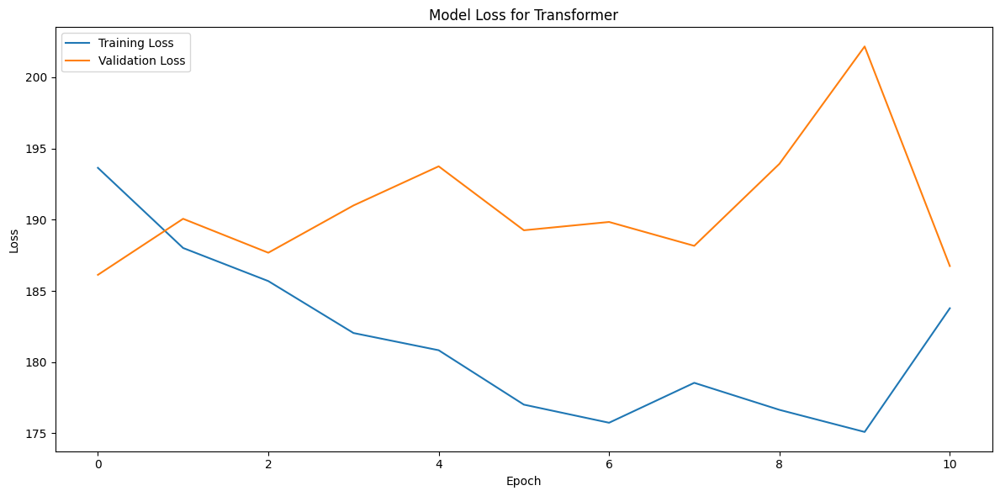

Training history plot saved to images/Transformer_Model_Loss.png


In [ ]:
# Plot training history with model name 'Transformer'
plot_training_history(history_transformer, model_name='Transformer')

In [ ]:
# Make predictions
y_pred_train = best_transformer_model.predict(X_train_seq).flatten()
y_pred_test = best_transformer_model.predict(X_test_seq).flatten()

# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Ensure consistent lengths
y_pred_train = y_pred_train[:len(y_true_train)]
y_pred_test = y_pred_test[:len(y_true_test)]

747/747 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


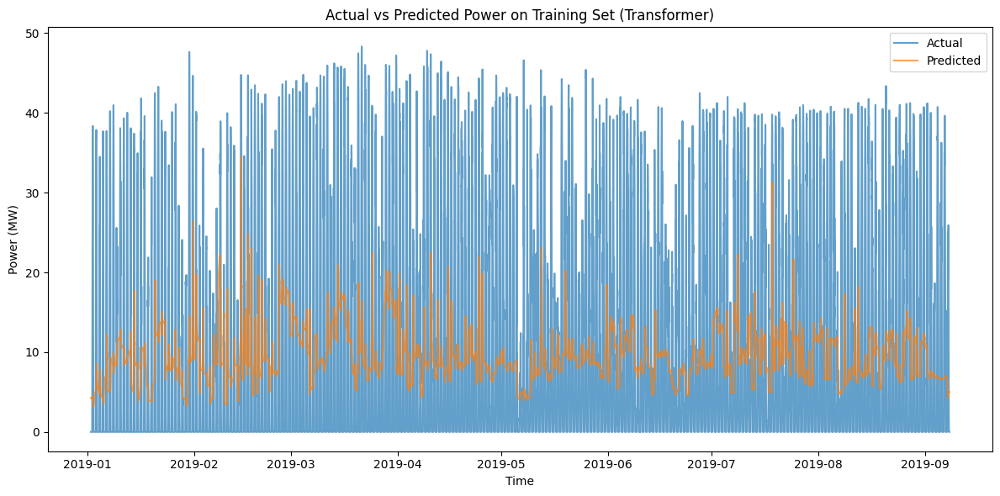

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(Transformer).png


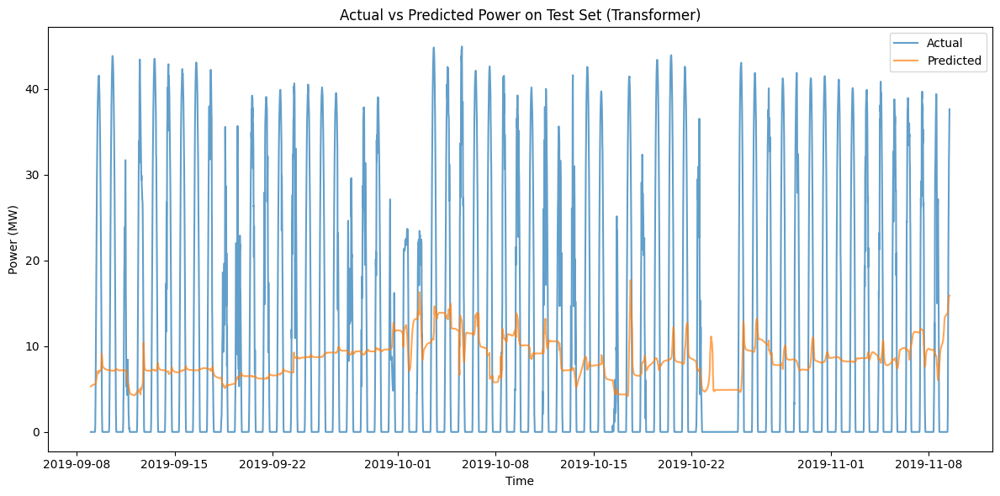

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(Transformer).png


In [ ]:

# Plot time series of actual vs predicted for the Transformer model
plot_predictions(y_true_train, pd.Series(y_pred_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (Transformer)')
plot_predictions(y_true_test, pd.Series(y_pred_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (Transformer)')


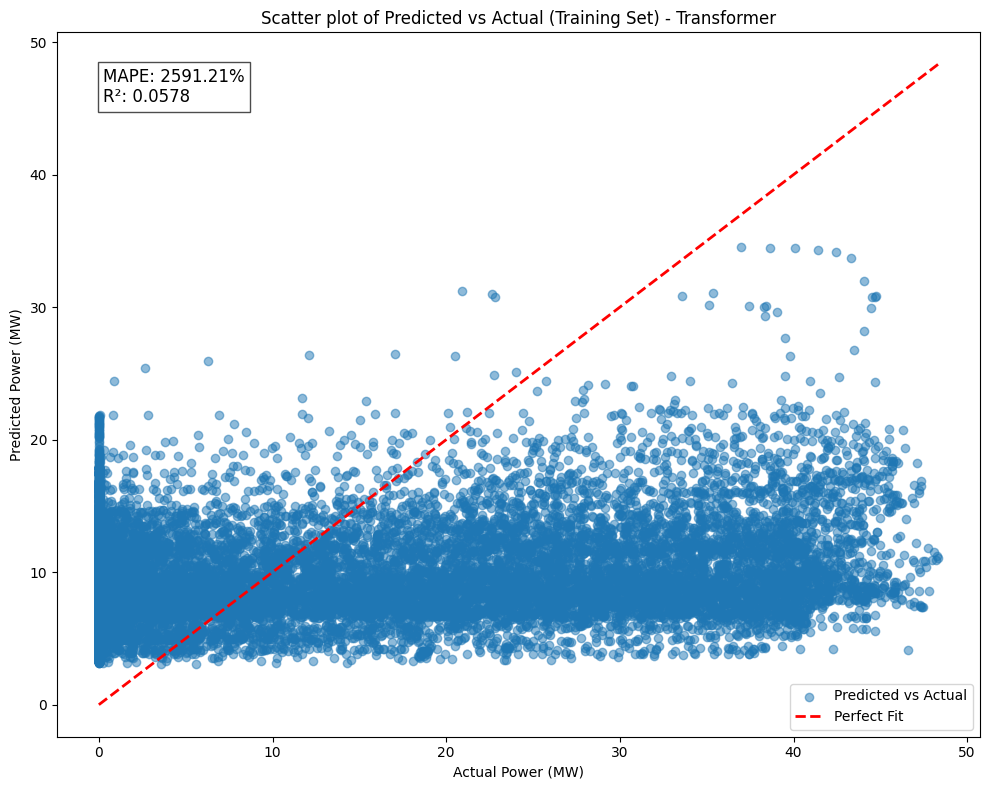

Scatter plot saved to images/Scatter_plot_of_Predicted_vs_Actual_(Training_Set)_-_Transformer.png


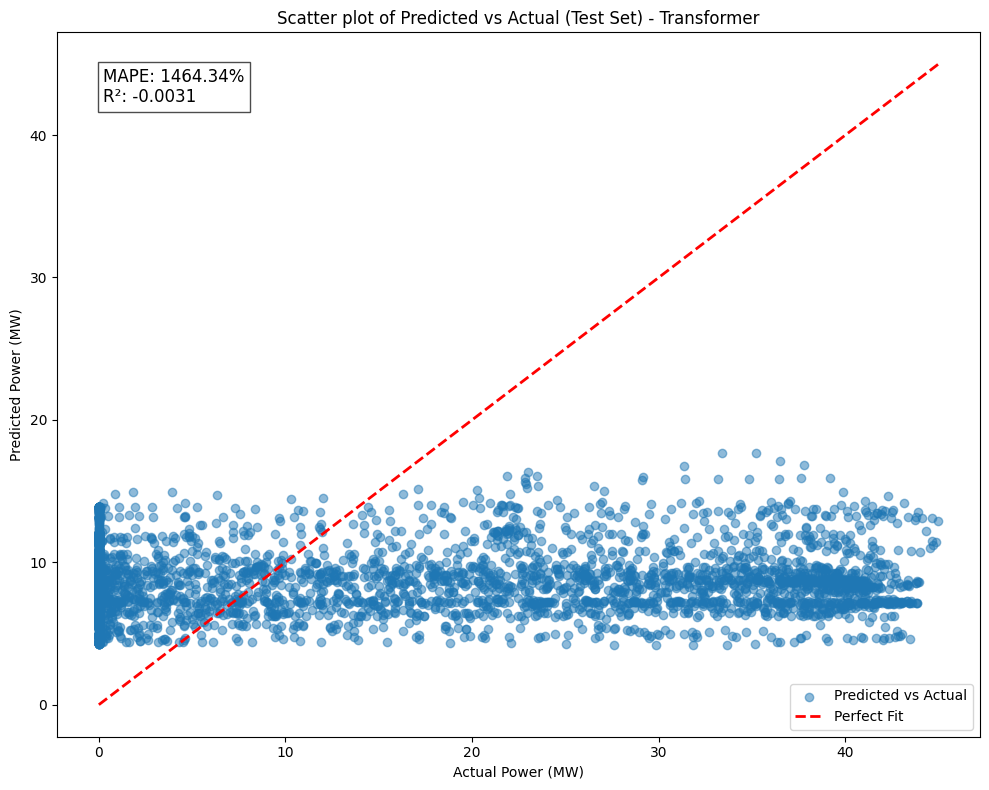

Scatter plot saved to images/Scatter_plot_of_Predicted_vs_Actual_(Test_Set)_-_Transformer.png


In [ ]:
# Scatter plots with model name 'Transformer'
plot_scatter(y_true_train, y_pred_train, 'Scatter plot of Predicted vs Actual (Training Set) - Transformer')
plot_scatter(y_true_test, y_pred_test, 'Scatter plot of Predicted vs Actual (Test Set) - Transformer')

In [ ]:
# Calculate metrics for the Transformer model
# Training set metrics
tr_mse_train, tr_rmse_train, tr_mae_train, tr_r2_train, tr_mape_train = calculate_metrics(y_true_train, y_pred_train)

# Test set metrics
tr_mse_test, tr_rmse_test, tr_mae_test, tr_r2_test, tr_mape_test = calculate_metrics(y_true_test, y_pred_test)

# Print the Transformer model's performance on the training set
print("\nTransformer Model on Train set performance:")
print(f"MSE: {tr_mse_train:.2f}")
print(f"RMSE: {tr_rmse_train:.2f}")
print(f"MAE: {tr_mae_train:.2f}")
print(f"R2 Score: {tr_r2_train:.2f}")
print(f"MAPE: {tr_mape_train:.2f}%")

# Print the Transformer model's performance on the test set
print("\nTransformer Model on Test set performance:")
print(f"MSE: {tr_mse_test:.2f}")
print(f"RMSE: {tr_rmse_test:.2f}")
print(f"MAE: {tr_mae_test:.2f}")
print(f"R2 Score: {tr_r2_test:.2f}")
print(f"MAPE: {tr_mape_test:.2f}%")


# Save the best Transformer model in the 'models' folder
model_path = 'models/best_transformer_model.h5'
best_transformer_model.save(model_path)
print("\nBest Transformer Model saved successfully at:", model_path)


Transformer Model on Train set performance:
MSE: 180.45
RMSE: 13.43
MAE: 11.08
R2 Score: 0.06
MAPE: 2591.21%

Transformer Model on Test set performance:
MSE: 211.21
RMSE: 14.53
MAE: 11.82
R2 Score: -0.00
MAPE: 1464.34%

Best Transformer Model saved successfully at: models/best_transformer_model.h5


# HYBRID MODELS

### MODEL 1: CNN-LSTM Model

The following hyperparameters to be used in the CNN-LSTM Model
* 'num_cnn_layers': [1, 2],
* 'cnn_filters': [32, 64],
* 'cnn_kernel_size': [3, 5],
* 'lstm_units': [32, 64],
* 'num_lstm_layers': [1, 2],
* 'dense_layers': [1, 2],
* 'dense_units': [16, 32],
* 'dropout_rate': [0.1, 0.2, 0.3],
* 'learning_rate': [1e-4, 1e-3, 1e-2],
* 'optimizer': ['adam', 'nadam', 'rmsprop']

In [ ]:
# Define hyperparameter search space for CNN-LSTM
hp_space_ss_cnn_lstm = {
    'num_cnn_layers': [1, 2],
    'cnn_filters': [32, 64],
    'cnn_kernel_size': [3, 5],
    'lstm_units': [32, 64],
    'num_lstm_layers': [1, 2],
    'dense_layers': [1, 2],
    'dense_units': [16, 32],
    'dropout_rate': [0.1, 0.2, 0.3],
    'learning_rate': [1e-4, 1e-3, 1e-2],
    'optimizer': ['adam', 'nadam', 'rmsprop']
}

In [ ]:
def build_cnn_lstm_model(hp):
    """
    Build a CNN-LSTM model based on the provided hyperparameters.

    Args:
        hp (HyperParameters): Hyperparameter object to sample from.

    Returns:
        tf.keras.Model: Compiled CNN-LSTM model.
    """
    inputs = layers.Input(shape=(TIME_STEPS_ss, len(FEATURES_ss)))

    # CNN layers
    x = inputs
    num_cnn_layers = hp.Int('num_cnn_layers', hp_space_ss_cnn_lstm['num_cnn_layers'][0], hp_space_ss_cnn_lstm['num_cnn_layers'][-1])
    for i in range(num_cnn_layers):
        x = layers.Conv1D(
            filters=hp.Choice(f'cnn_filters_{i}', hp_space_ss_cnn_lstm['cnn_filters']),
            kernel_size=hp.Choice(f'cnn_kernel_size_{i}', hp_space_ss_cnn_lstm['cnn_kernel_size']),
            activation='relu'
        )(x)
        x = layers.MaxPooling1D(pool_size=2)(x)
        x = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_lstm['dropout_rate']))(x)

    # LSTM layers
    num_lstm_layers = hp.Int('num_lstm_layers', hp_space_ss_cnn_lstm['num_lstm_layers'][0], hp_space_ss_cnn_lstm['num_lstm_layers'][-1])
    for i in range(num_lstm_layers):
        return_sequences = i < num_lstm_layers - 1
        if i == 0:
            x = layers.LSTM(
                units=hp.Choice(f'lstm_units_{i}', hp_space_ss_cnn_lstm['lstm_units']),
                return_sequences=return_sequences
            )(x)
        else:
            x = layers.LSTM(
                units=hp.Choice(f'lstm_units_{i}', hp_space_ss_cnn_lstm['lstm_units']),
                return_sequences=return_sequences
            )(x)
        x = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_lstm['dropout_rate']))(x)

    # Dense layers
    dense_layers = hp.Int('dense_layers', hp_space_ss_cnn_lstm['dense_layers'][0], hp_space_ss_cnn_lstm['dense_layers'][-1])
    for i in range(dense_layers):
        x = layers.Dense(
            units=hp.Choice(f'dense_units_{i}', hp_space_ss_cnn_lstm['dense_units']),
            activation='relu'
        )(x)
        x = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_lstm['dropout_rate']))(x)

    outputs = layers.Dense(1)(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    optimizer_choice = hp.Choice('optimizer', hp_space_ss_cnn_lstm['optimizer'])
    learning_rate = hp.Float('learning_rate', hp_space_ss_cnn_lstm['learning_rate'][0], hp_space_ss_cnn_lstm['learning_rate'][-1], sampling='log')

    if optimizer_choice == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = Nadam(learning_rate=learning_rate)
    else:  # rmsprop
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model

In [ ]:
# Initialize the tuner
tuner_cnn_lstm = kt.Hyperband(
    build_cnn_lstm_model,
    objective='val_loss',
    max_epochs=30,
    factor=3,
    directory='cnn_lstm_tuning',
    project_name='solar_power_prediction_cnn_lstm'
)

# Search for the best hyperparameters
tuner_cnn_lstm.search(X_train_seq, y_train_seq,
                      epochs=50,
                      validation_split=0.2,
                      callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)])

Trial 90 Complete [00h 01m 38s]
val_loss: 11.380146980285645

Best val_loss So Far: 11.005393028259277
Total elapsed time: 00h 56m 09s


In [ ]:
# Get the best hyperparameters
best_cnn_lstm_hps = tuner_cnn_lstm.get_best_hyperparameters(num_trials=1)[0]
print("The best hyperparameters for CNN-LSTM are:")
for param, value in best_cnn_lstm_hps.values.items():
    print(f"{param}: {value}")

The best hyperparameters for CNN-LSTM are:
num_cnn_layers: 1
cnn_filters_0: 32
cnn_kernel_size_0: 5
dropout_rate: 0.1
num_lstm_layers: 2
lstm_units_0: 32
dense_layers: 2
dense_units_0: 16
optimizer: rmsprop
learning_rate: 0.0006068110204571213
cnn_filters_1: 32
cnn_kernel_size_1: 3
lstm_units_1: 32
dense_units_1: 16
tuner/epochs: 30
tuner/initial_epoch: 10
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0078


In [ ]:
# Build the model with the best hyperparameters
best_cnn_lstm_model = tuner_cnn_lstm.hypermodel.build(best_cnn_lstm_hps)
best_cnn_lstm_model.summary()

# Train the best model
history_cnn_lstm = best_cnn_lstm_model.fit(X_train_seq, y_train_seq,
                                           epochs=50,
                                           batch_size=32,
                                           validation_split=0.2,
                                           callbacks=[tf.keras.callbacks.EarlyStopping(patience=10)])

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 96, 4)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_2 (Conv1D)                    │ (None, 92, 32)              │             672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 46, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 46, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 46, 32)              │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 46, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 32)                  │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 16)                  │             272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,129 (70.82 KB)

 Trainable params: 18,129 (70.82 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - loss: 139.2584 - mae: 7.3154 - val_loss: 18.0380 - val_mae: 2.5276
Epoch 2/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 28.2300 - mae: 2.8833 - val_loss: 17.4798 - val_mae: 2.4035
Epoch 3/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 25.2607 - mae: 2.6750 - val_loss: 19.1107 - val_mae: 2.5126
Epoch 4/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 24.8963 - mae: 2.5954 - val_loss: 16.9244 - val_mae: 2.3269
Epoch 5/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 23.2759 - mae: 2.5162 - val_loss: 14.3848 - val_mae: 2.1121
Epoch 6/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 21.6625 - mae: 2.4268 - val_loss: 14.4139 - val_mae: 2.0993
Epoch 7/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 20.7019 - mae: 2.3734 - val_loss: 12.0138 - val_mae: 1.8118
Epoch 8/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 21.5046 - mae: 2.4274 - val_loss: 14.4824 - val_mae: 2.1272
Epoch 9/50
598/598 ━━━━━━━━━━━━━━━━━━━━

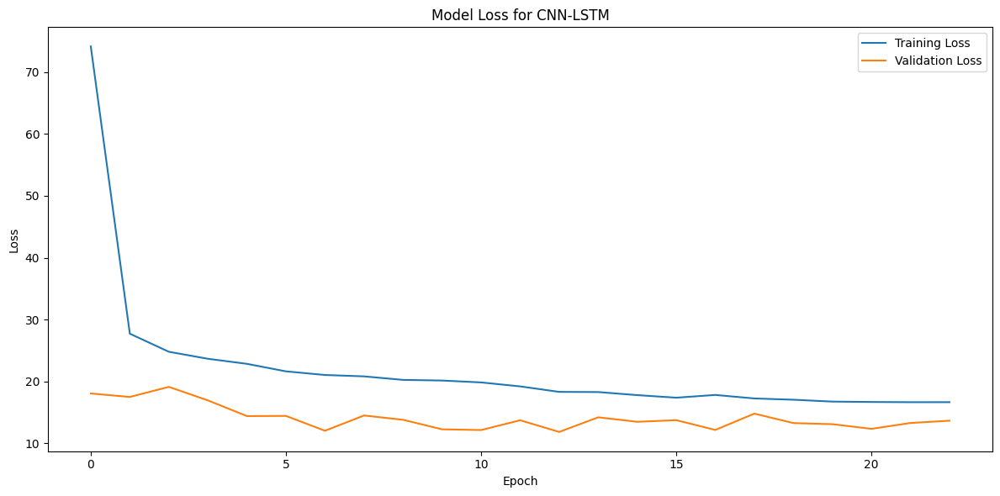

Training history plot saved to images/CNN-LSTM_Model_Loss.png


In [ ]:
# Plot training history with model name 'CNN-LSTM'
plot_training_history(history_cnn_lstm, model_name='CNN-LSTM')

In [ ]:
# Make predictions
y_pred_train = best_cnn_lstm_model.predict(X_train_seq).flatten()
y_pred_test = best_cnn_lstm_model.predict(X_test_seq).flatten()

# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Ensure consistent lengths
y_pred_train = y_pred_train[:len(y_true_train)]
y_pred_test = y_pred_test[:len(y_true_test)]

747/747 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


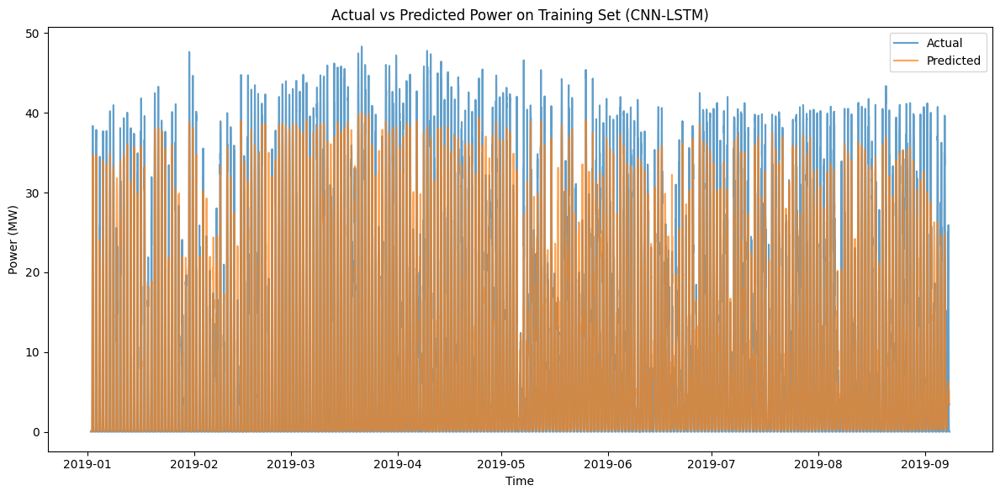

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(CNN-LSTM).png


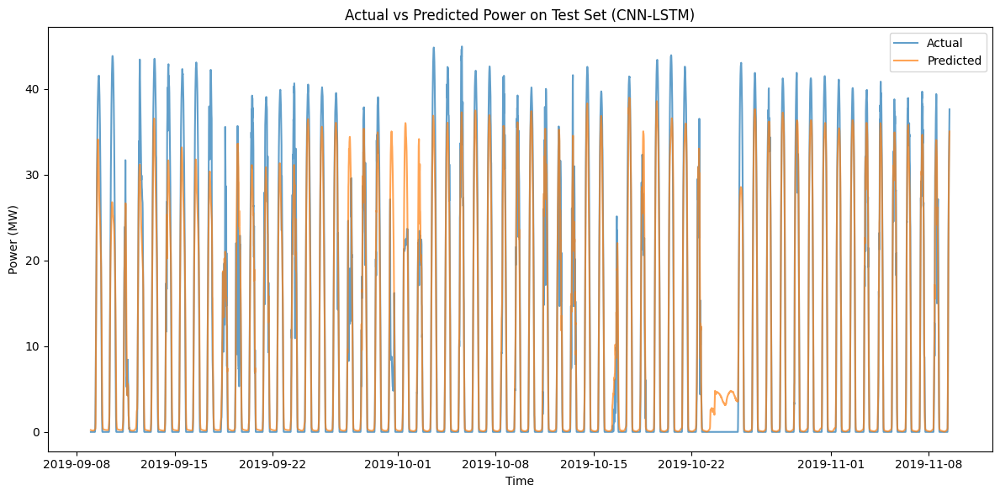

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(CNN-LSTM).png


In [ ]:
# Plot time series of actual vs predicted for the CNN-LSTM model
plot_predictions(y_true_train, pd.Series(y_pred_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (CNN-LSTM)')
plot_predictions(y_true_test, pd.Series(y_pred_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (CNN-LSTM)')

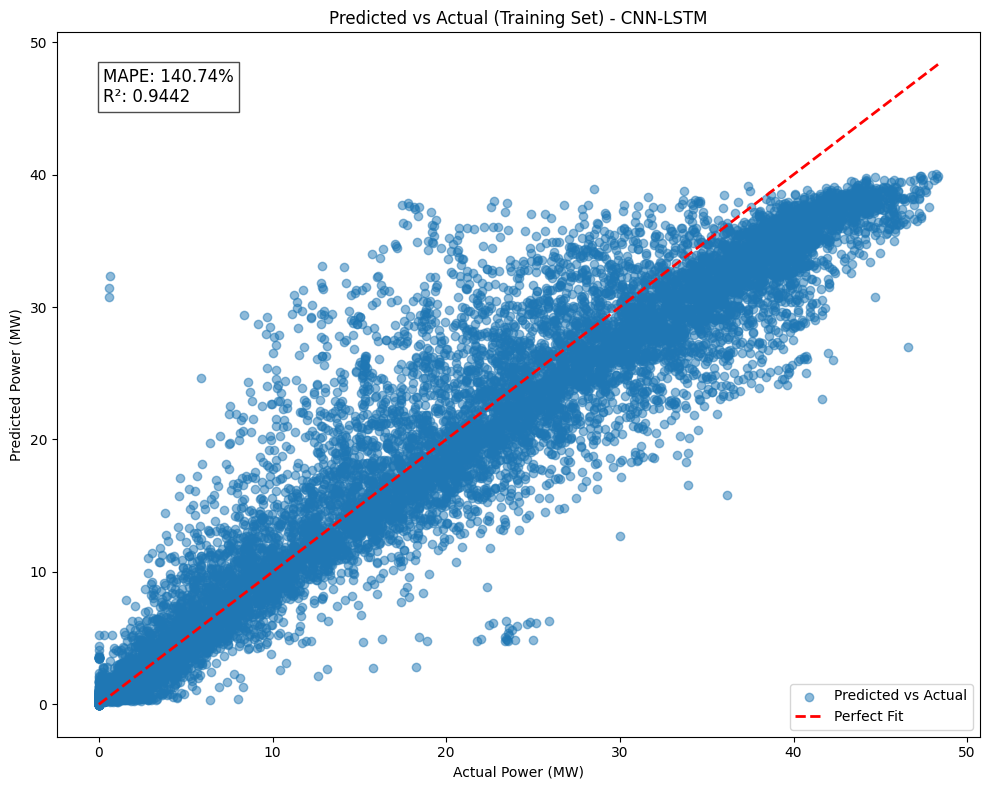

Scatter plot saved to images/Predicted_vs_Actual_(Training_Set)_-_CNN-LSTM.png


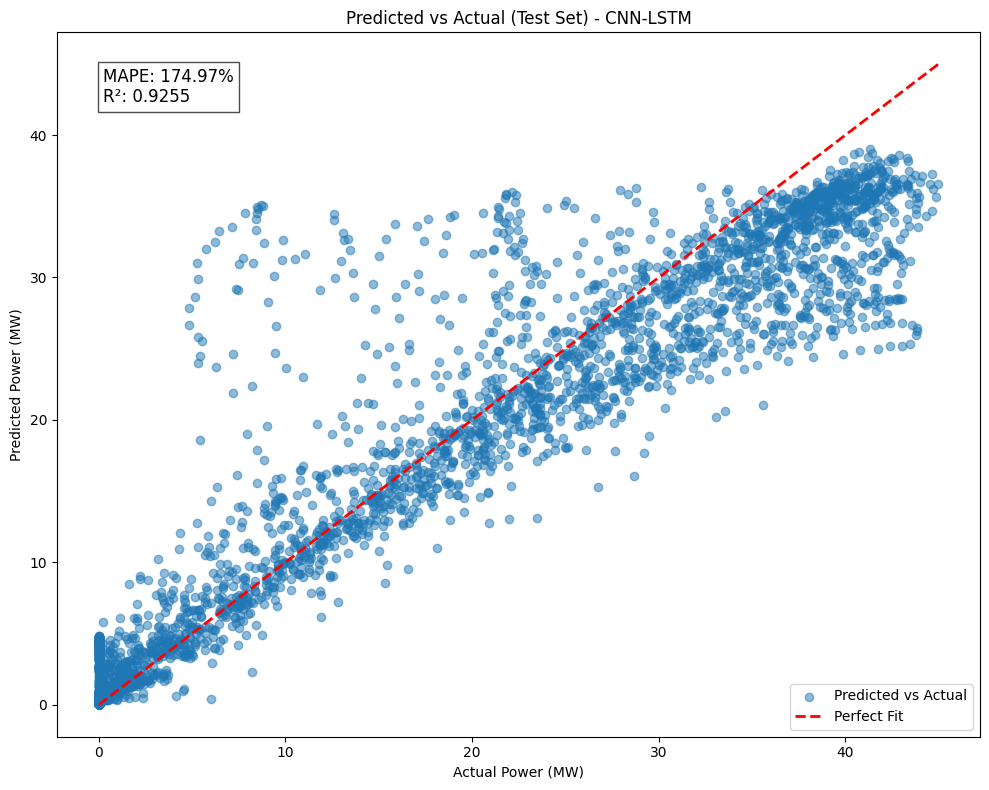

Scatter plot saved to images/Predicted_vs_Actual_(Test_Set)_-_CNN-LSTM.png


In [ ]:
# Scatter plots with model name 'CNN-LSTM'
plot_scatter(y_true_train, y_pred_train, 'Predicted vs Actual (Training Set) - CNN-LSTM')
plot_scatter(y_true_test, y_pred_test, 'Predicted vs Actual (Test Set) - CNN-LSTM')

In [ ]:
# Calculate metrics for the CNN-LSTM model
# Training set metrics
cnn_lstm_mse_train, cnn_lstm_rmse_train, cnn_lstm_mae_train, cnn_lstm_r2_train, cnn_lstm_mape_train = calculate_metrics(y_true_train, y_pred_train)

# Test set metrics
cnn_lstm_mse_test, cnn_lstm_rmse_test, cnn_lstm_mae_test, cnn_lstm_r2_test, cnn_lstm_mape_test = calculate_metrics(y_true_test, y_pred_test)

# Print the CNN-LSTM model's performance on the training set
print("\nCNN-LSTM Model on Train set performance:")
print(f"MSE: {cnn_lstm_mse_train:.2f}")
print(f"RMSE: {cnn_lstm_rmse_train:.2f}")
print(f"MAE: {cnn_lstm_mae_train:.2f}")
print(f"R2 Score: {cnn_lstm_r2_train:.2f}")
print(f"MAPE: {cnn_lstm_mape_train:.2f}%")

# Print the CNN-LSTM model's performance on the test set
print("\nCNN-LSTM Model on Test set performance:")
print(f"MSE: {cnn_lstm_mse_test:.2f}")
print(f"RMSE: {cnn_lstm_rmse_test:.2f}")
print(f"MAE: {cnn_lstm_mae_test:.2f}")
print(f"R2 Score: {cnn_lstm_r2_test:.2f}")
print(f"MAPE: {cnn_lstm_mape_test:.2f}%")

# Save the best CNN-LSTM model in the 'models' folder
model_path = 'models/best_cnn_lstm_model.h5'
best_cnn_lstm_model.save(model_path)
print("\nBest CNN-LSTM Model saved successfully at:", model_path)


CNN-LSTM Model on Train set performance:
MSE: 10.69
RMSE: 3.27
MAE: 1.76
R2 Score: 0.94
MAPE: 140.74%

CNN-LSTM Model on Test set performance:
MSE: 15.68
RMSE: 3.96
MAE: 2.02
R2 Score: 0.93
MAPE: 174.97%

Best CNN-LSTM Model saved successfully at: models/best_cnn_lstm_model.h5


### MODEL 2: CNN-LSTM-RF MODEL

In [ ]:
# Load the trained CNN-LSTM model with all necessary custom objects
best_cnn_lstm_model = tf.keras.models.load_model(
    'models/best_cnn_lstm_model.h5',
    custom_objects={
        'mse': tf.keras.losses.MeanSquaredError(),  # or specify your custom function
        # Add other custom objects as needed
    }
)

# Load the trained Random Forest model (RF1) using joblib
best_rf_model = joblib.load('models/best_rf_model.pkl')


In [ ]:
# Generate predictions using the CNN-LSTM model
cnn_lstm_train_preds = best_cnn_lstm_model.predict(X_train_seq).flatten()
cnn_lstm_test_preds = best_cnn_lstm_model.predict(X_test_seq).flatten()

# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Truncate predictions to match the actual data lengths
cnn_lstm_train_preds = cnn_lstm_train_preds[:len(y_true_train)]
cnn_lstm_test_preds = cnn_lstm_test_preds[:len(y_true_test)]

747/747 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


In [ ]:
# Combine CNN-LSTM predictions with original features
X_train_cnn_lstm_rf_combined = pd.concat([X_train_ss.iloc[TIME_STEPS_ss:],
                                 pd.DataFrame(cnn_lstm_train_preds, index=y_true_train.index,
                                              columns=['cnn_lstm_pred'])], axis=1)

X_test_cnn_lstm_rf_combined = pd.concat([X_test_ss.iloc[TIME_STEPS_ss:],
                                pd.DataFrame(cnn_lstm_test_preds, index=y_true_test.index,
                                             columns=['cnn_lstm_pred'])], axis=1)


In [ ]:
# Train the Random Forest model on the combined features
best_rf_model.fit(X_train_cnn_lstm_rf_combined, y_true_train)

RandomForestRegressor(max_depth=10, max_features=2, min_samples_leaf=4,
                      min_samples_split=5, n_estimators=300, random_state=42)

In [ ]:
# Make predictions on the training and test sets
y_pred_cnn_lstm_rf_train = best_rf_model.predict(X_train_cnn_lstm_rf_combined)
y_pred_cnn_lstm_rf_test = best_rf_model.predict(X_test_cnn_lstm_rf_combined)

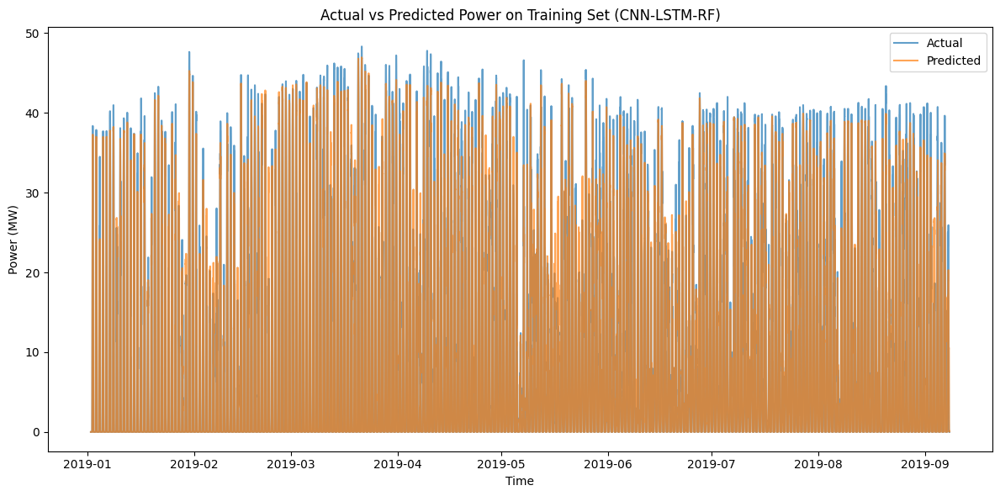

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(CNN-LSTM-RF).png


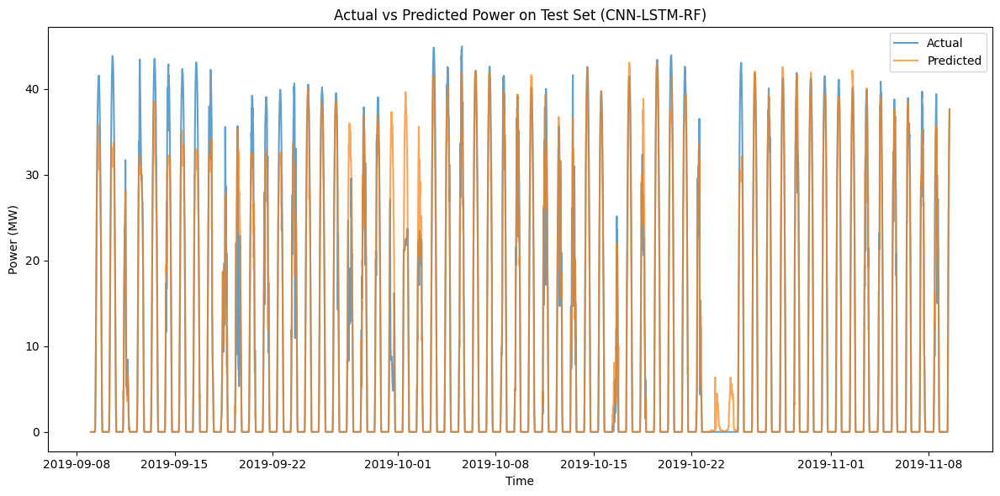

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(CNN-LSTM-RF).png


In [ ]:
# Plot time series of actual vs predicted for the CNN-LSTM-RF hybrid model
plot_predictions(y_true_train, pd.Series(y_pred_cnn_lstm_rf_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (CNN-LSTM-RF)')
plot_predictions(y_true_test, pd.Series(y_pred_cnn_lstm_rf_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (CNN-LSTM-RF)')

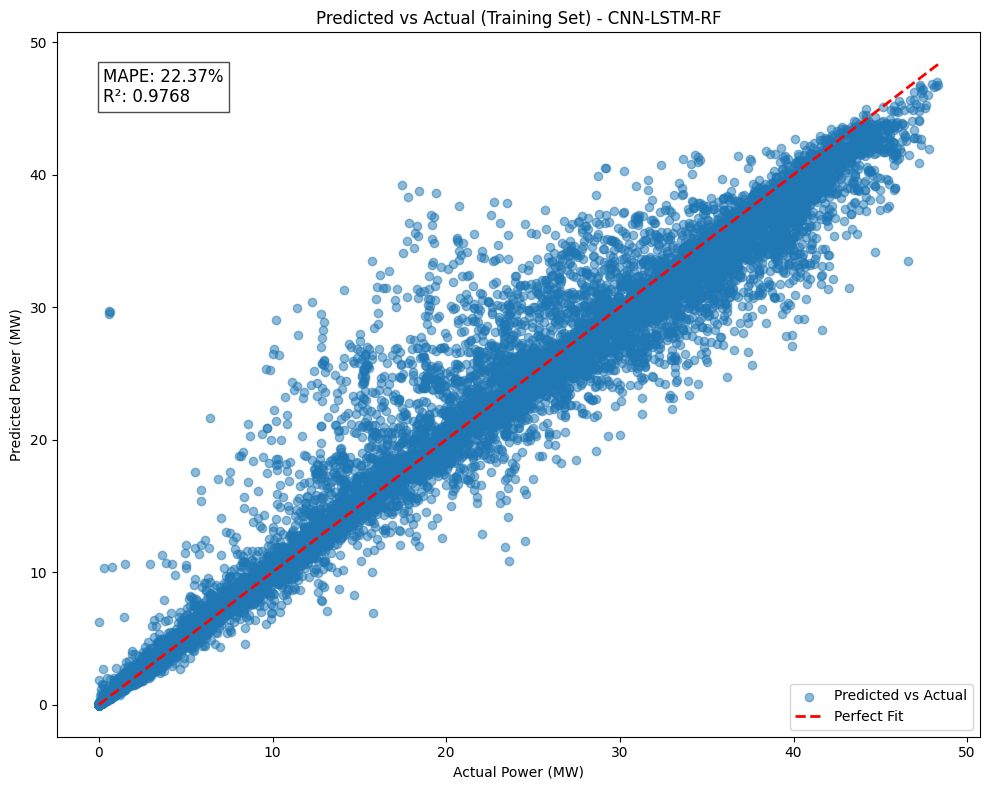

Scatter plot saved to images/Predicted_vs_Actual_(Training_Set)_-_CNN-LSTM-RF.png


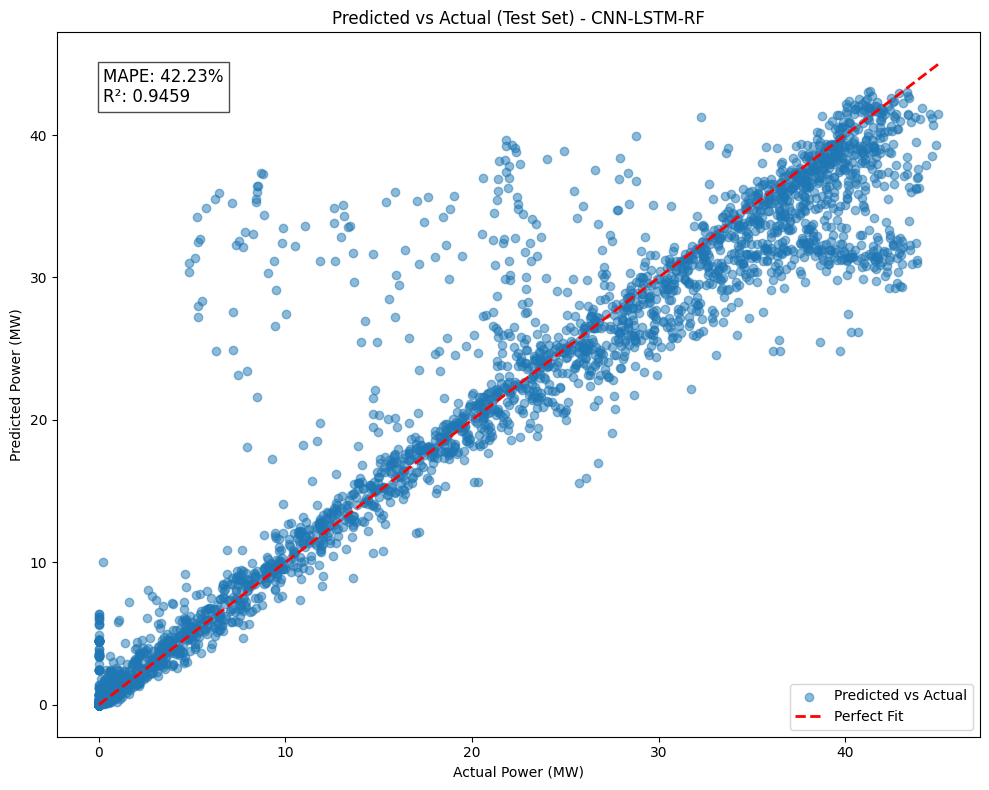

Scatter plot saved to images/Predicted_vs_Actual_(Test_Set)_-_CNN-LSTM-RF.png


In [ ]:
# Scatter plots with model name 'CNN-LSTM-RF'
plot_scatter(y_true_train, y_pred_cnn_lstm_rf_train, 'Predicted vs Actual (Training Set) - CNN-LSTM-RF')
plot_scatter(y_true_test, y_pred_cnn_lstm_rf_test, 'Predicted vs Actual (Test Set) - CNN-LSTM-RF')

In [ ]:
# Evaluate the model on the training set
(cnn_lstm_rf_mse_train, cnn_lstm_rf_rmse_train, cnn_lstm_rf_mae_train,
 cnn_lstm_rf_r2_train, cnn_lstm_rf_mape_train) = calculate_metrics(
    y_train_ss[TIME_STEPS_ss:], y_pred_cnn_lstm_rf_train
)

print("Random Forest Train set performance with CNN-LSTM features:")
print(f"MSE: {cnn_lstm_rf_mse_train:.2f}")
print(f"RMSE: {cnn_lstm_rf_rmse_train:.2f}")
print(f"MAE: {cnn_lstm_rf_mae_train:.2f}")
print(f"R2 Score: {cnn_lstm_rf_r2_train:.2f}")
print(f"MAPE: {cnn_lstm_rf_mape_train:.2f}%")

# Evaluate the model on the test set
(cnn_lstm_rf_mse_test, cnn_lstm_rf_rmse_test, cnn_lstm_rf_mae_test,
 cnn_lstm_rf_r2_test, cnn_lstm_rf_mape_test) = calculate_metrics(
    y_test_ss[TIME_STEPS_ss:], y_pred_cnn_lstm_rf_test
)

print("\nRandom Forest Test set performance with CNN-LSTM features:")
print(f"MSE: {cnn_lstm_rf_mse_test:.2f}")
print(f"RMSE: {cnn_lstm_rf_rmse_test:.2f}")
print(f"MAE: {cnn_lstm_rf_mae_test:.2f}")
print(f"R2 Score: {cnn_lstm_rf_r2_test:.2f}")
print(f"MAPE: {cnn_lstm_rf_mape_test:.2f}%")

Random Forest Train set performance with CNN-LSTM features:
MSE: 4.45
RMSE: 2.11
MAE: 0.88
R2 Score: 0.98
MAPE: 22.37%

Random Forest Test set performance with CNN-LSTM features:
MSE: 11.40
RMSE: 3.38
MAE: 1.26
R2 Score: 0.95
MAPE: 42.23%


### MODEL 2: CNN-LSTM-TRANSFORMER MODEL (CNN-LSTM-TR)

The following hyperparameters are to be used in the CNN-LSTM-TR Model
* 'num_cnn_layers': [1, 2],
* 'cnn_filters': [16, 32],
* 'cnn_kernel_size': [3, 5],
* 'lstm_units': [32, 64],
* 'num_lstm_layers': [1, 2],
* 'num_transformer_blocks': [1, 2],
* 'num_heads': [2, 4],
* 'key_dim': [16, 32],
* 'ff_dim': [32, 64],
* 'dense_layers': [1, 2],
* 'dense_units': [32, 64],
* 'dropout_rate': [0.1, 0.2, 0.3],
* 'learning_rate': [1e-4, 1e-3, 1e-2],
* 'optimizer': ['adam', 'nadam', 'rmsprop']

In [ ]:
hp_space_ss_cnn_lstm_transformer = {
    'num_cnn_layers': [1, 2],
    'cnn_filters': [16, 32],
    'cnn_kernel_size': [3, 5],
    'lstm_units': [32, 64],
    'num_lstm_layers': [1, 2],
    'num_transformer_blocks': [1, 2],
    'num_heads': [2, 4],
    'key_dim': [16, 32],
    'ff_dim': [32, 64],
    'dense_layers': [1, 2],
    'dense_units': [32, 64],
    'dropout_rate': [0.1, 0.2, 0.3],
    'learning_rate': [1e-4, 1e-3, 1e-2],
    'optimizer': ['adam', 'nadam', 'rmsprop']
}


In [ ]:
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dropout, Dense, LayerNormalization, MultiHeadAttention, Add, Flatten
import tensorflow as tf

def build_cnn_lstm_transformer_model(hp):
    inputs = layers.Input(shape=(TIME_STEPS_ss, len(FEATURES_ss)))

    # CNN Layers
    x = inputs
    num_cnn_layers = hp.Int('num_cnn_layers', hp_space_ss_cnn_lstm_transformer['num_cnn_layers'][0], hp_space_ss_cnn_lstm_transformer['num_cnn_layers'][-1])
    for i in range(num_cnn_layers):
        x = layers.Conv1D(
            filters=hp.Choice(f'cnn_filters_{i}', hp_space_ss_cnn_lstm_transformer['cnn_filters']),
            kernel_size=hp.Choice(f'cnn_kernel_size_{i}', hp_space_ss_cnn_lstm_transformer['cnn_kernel_size']),
            activation='relu',
            padding='same'
        )(x)
        x = layers.MaxPooling1D(pool_size=2)(x)

    # LSTM Layers
    num_lstm_layers = hp.Int('num_lstm_layers', hp_space_ss_cnn_lstm_transformer['num_lstm_layers'][0], hp_space_ss_cnn_lstm_transformer['num_lstm_layers'][-1])
    for i in range(num_lstm_layers):
        return_sequences = i < num_lstm_layers - 1 or hp.Int('num_transformer_blocks', hp_space_ss_cnn_lstm_transformer['num_transformer_blocks'][0], hp_space_ss_cnn_lstm_transformer['num_transformer_blocks'][-1]) > 0
        x = layers.LSTM(
            units=hp.Choice(f'lstm_units_{i}', hp_space_ss_cnn_lstm_transformer['lstm_units']),
            return_sequences=return_sequences
        )(x)
        x = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_lstm_transformer['dropout_rate']))(x)

    # Ensure we have a 3D tensor for the Transformer blocks
    if len(x.shape) == 2:
        x = layers.Reshape((1, -1))(x)

    # Transformer Layers
    num_transformer_blocks = hp.Int('num_transformer_blocks', hp_space_ss_cnn_lstm_transformer['num_transformer_blocks'][0], hp_space_ss_cnn_lstm_transformer['num_transformer_blocks'][-1])
    for _ in range(num_transformer_blocks):
        # Multi-Head Attention
        attention = layers.MultiHeadAttention(
            num_heads=hp.Choice('num_heads', hp_space_ss_cnn_lstm_transformer['num_heads']),
            key_dim=hp.Choice('key_dim', hp_space_ss_cnn_lstm_transformer['key_dim'])
        )(x, x)
        attention = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_lstm_transformer['dropout_rate']))(attention)
        x = layers.Add()([x, attention])
        x = layers.LayerNormalization(epsilon=1e-6)(x)

        # Feed-Forward Network
        ff_dim = hp.Choice('ff_dim', hp_space_ss_cnn_lstm_transformer['ff_dim'])
        ff = layers.Dense(ff_dim, activation='relu')(x)
        ff = layers.Dense(x.shape[-1])(ff)
        ff = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_lstm_transformer['dropout_rate']))(ff)
        x = layers.Add()([x, ff])
        x = layers.LayerNormalization(epsilon=1e-6)(x)

    # Flatten the output if it's still 3D
    if len(x.shape) > 2:
        x = layers.GlobalAveragePooling1D()(x)

    # Dense Layers
    dense_layers = hp.Int('dense_layers', hp_space_ss_cnn_lstm_transformer['dense_layers'][0], hp_space_ss_cnn_lstm_transformer['dense_layers'][-1])
    for i in range(dense_layers):
        x = layers.Dense(
            units=hp.Choice(f'dense_units_{i}', hp_space_ss_cnn_lstm_transformer['dense_units']),
            activation='relu'
        )(x)
        x = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_lstm_transformer['dropout_rate']))(x)

    outputs = layers.Dense(1)(x)

    model = models.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    optimizer_choice = hp.Choice('optimizer', hp_space_ss_cnn_lstm_transformer['optimizer'])
    learning_rate = hp.Float('learning_rate', hp_space_ss_cnn_lstm_transformer['learning_rate'][0], hp_space_ss_cnn_lstm_transformer['learning_rate'][-1], sampling='log')

    if optimizer_choice == 'adam':
        optimizer = optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = optimizers.Nadam(learning_rate=learning_rate)
    else:  # rmsprop
        optimizer = optimizers.RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model


In [ ]:
import keras_tuner as kt

# Initialize the tuner
tuner_cnn_lstm_transformer = kt.Hyperband(
    build_cnn_lstm_transformer_model,
    objective='val_loss',
    max_epochs=30,
    factor=3,
    directory='cnn_lstm_transformer_tuning',
    project_name='cnn_lstm_transformer_prediction'
)

# Search for the best hyperparameters
tuner_cnn_lstm_transformer.search(X_train_seq, y_train_seq,
                                  epochs=50,
                                  validation_split=0.2,
                                  callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)])


Trial 90 Complete [00h 03m 03s]
val_loss: 12.123564720153809

Best val_loss So Far: 10.809256553649902
Total elapsed time: 01h 40m 19s


In [ ]:
# Get the best hyperparameters
best_cnn_lstm_transformer_hps = tuner_cnn_lstm_transformer.get_best_hyperparameters(num_trials=1)[0]
print("The best hyperparameters for CNN-LSTM-Transformer are:")
for param, value in best_cnn_lstm_transformer_hps.values.items():
    print(f"{param}: {value}")

The best hyperparameters for CNN-LSTM-Transformer are:
num_cnn_layers: 2
cnn_filters_0: 16
cnn_kernel_size_0: 5
num_lstm_layers: 1
num_transformer_blocks: 2
lstm_units_0: 64
dropout_rate: 0.1
num_heads: 2
key_dim: 32
ff_dim: 64
dense_layers: 2
dense_units_0: 64
optimizer: adam
learning_rate: 0.0028727886699530594
cnn_filters_1: 16
cnn_kernel_size_1: 3
dense_units_1: 64
lstm_units_1: 32
tuner/epochs: 10
tuner/initial_epoch: 4
tuner/bracket: 2
tuner/round: 1
tuner/trial_id: 0056


In [ ]:
# Build the model with the best hyperparameters
best_cnn_lstm_transformer_model = tuner_cnn_lstm_transformer.hypermodel.build(best_cnn_lstm_transformer_hps)
best_cnn_lstm_transformer_model.summary()

# Train the best model
history_cnn_lstm_transformer = best_cnn_lstm_transformer_model.fit(X_train_seq, y_train_seq,
                                                                   epochs=50,
                                                                   batch_size=32,
                                                                   validation_split=0.2,
                                                                   callbacks=[tf.keras.callbacks.EarlyStopping(patience=10)])

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 96, 4)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_1 (Conv1D)         │ (None, 96, 16)         │            336 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_1           │ (None, 48, 16)         │              0 │ conv1d_1[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 48, 16)         │            784 │ max_pooling1d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_2           │ (None, 24, 16)         │              0 │ conv1d_2[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_2 (LSTM)             │ (None, 24, 64)         │         20,736 │ max_pooling1d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_10 (Dropout)      │ (None, 24, 64)         │              0 │ lstm_2[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention_2    │ (None, 24, 64)         │         16,640 │ dropout_10[0][0],      │
│ (MultiHeadAttention)      │                        │                │ dropout_10[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_12 (Dropout)      │ (None, 24, 64)         │              0 │ multi_head_attention_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_4 (Add)               │ (None, 24, 64)         │              0 │ dropout_10[0][0],      │
│                           │                        │                │ dropout_12[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_4     │ (None, 24, 64)         │            128 │ add_4[0][0]            │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 24, 64)         │          4,160 │ layer_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_8 (Dense)           │ (None, 24, 64)         │          4,160 │ dense_7[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_13 (Dropout)      │ (None, 24, 64)         │              0 │ dense_8[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_5 (Add)               │ (None, 24, 64)         │              0 │ layer_normalization_4… │
│                           │                        │                │ dropout_13[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_5     │ (None, 24, 64)         │            128 │ add_5[0][0]            │
│ (LayerNormalization) 

 Total params: 80,673 (315.13 KB)

 Trainable params: 80,673 (315.13 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 16s 17ms/step - loss: 85.6765 - mae: 6.0462 - val_loss: 19.6604 - val_mae: 2.3935
Epoch 2/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 23.9956 - mae: 2.7345 - val_loss: 13.0736 - val_mae: 2.0008
Epoch 3/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 18.1380 - mae: 2.2932 - val_loss: 14.1482 - val_mae: 2.1582
Epoch 4/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - loss: 18.2882 - mae: 2.3287 - val_loss: 12.5381 - val_mae: 1.9930
Epoch 5/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 19.1473 - mae: 2.2729 - val_loss: 40.1872 - val_mae: 4.9333
Epoch 6/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 32.4186 - mae: 3.3702 - val_loss: 16.9552 - val_mae: 2.4018
Epoch 7/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - loss: 20.0798 - mae: 2.4912 - val_loss: 18.6101 - val_mae: 2.6396
Epoch 8/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - loss: 19.5848 - mae: 2.4593 - val_loss: 18.4105 - val_mae: 2.4945
Epoch 9/50
598/598 ━━━━━━━

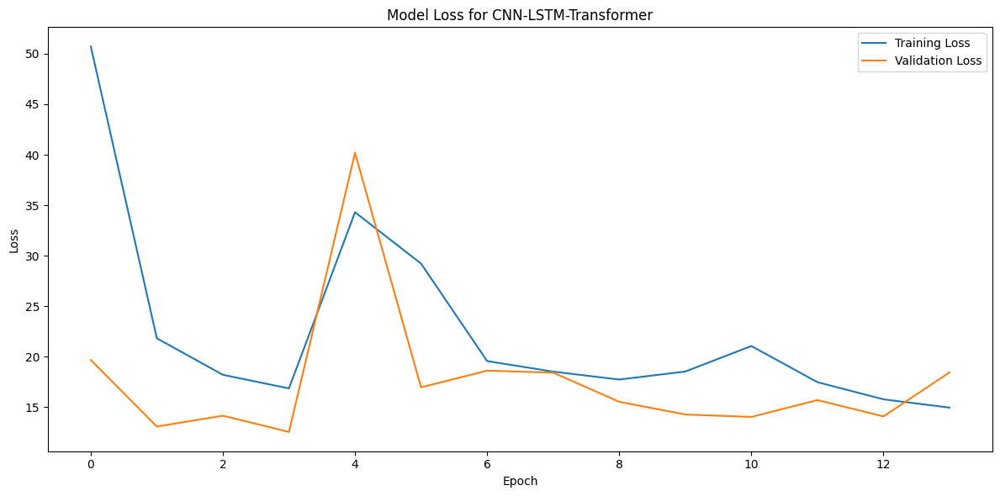

Training history plot saved to images/CNN-LSTM-Transformer_Model_Loss.png


In [ ]:
# Plot training history with model name 'CNN-LSTM-Transformer'
plot_training_history(history_cnn_lstm_transformer, model_name='CNN-LSTM-Transformer')

In [ ]:
# Make predictions
y_pred_train = best_cnn_lstm_transformer_model.predict(X_train_seq).flatten()
y_pred_test = best_cnn_lstm_transformer_model.predict(X_test_seq).flatten()

# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Ensure consistent lengths
y_pred_train = y_pred_train[:len(y_true_train)]
y_pred_test = y_pred_test[:len(y_true_test)]

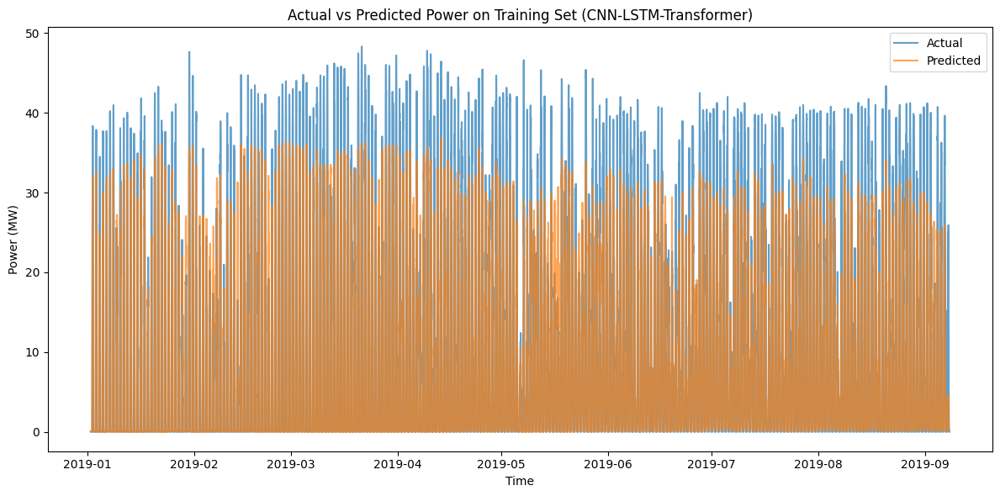

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(CNN-LSTM-Transformer).png


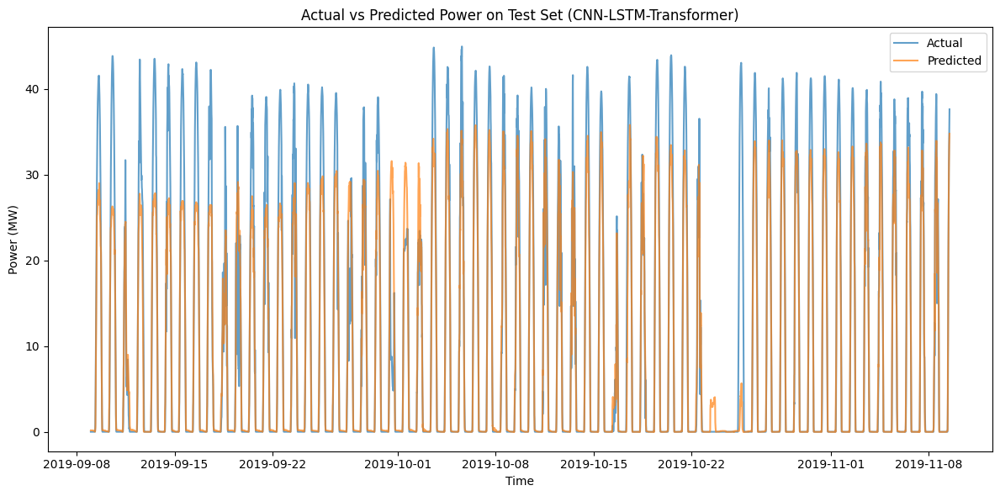

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(CNN-LSTM-Transformer).png


In [ ]:
# Plot time series of actual vs predicted for the CNN-LSTM-Transformer model
plot_predictions(y_true_train, pd.Series(y_pred_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (CNN-LSTM-Transformer)')
plot_predictions(y_true_test, pd.Series(y_pred_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (CNN-LSTM-Transformer)')

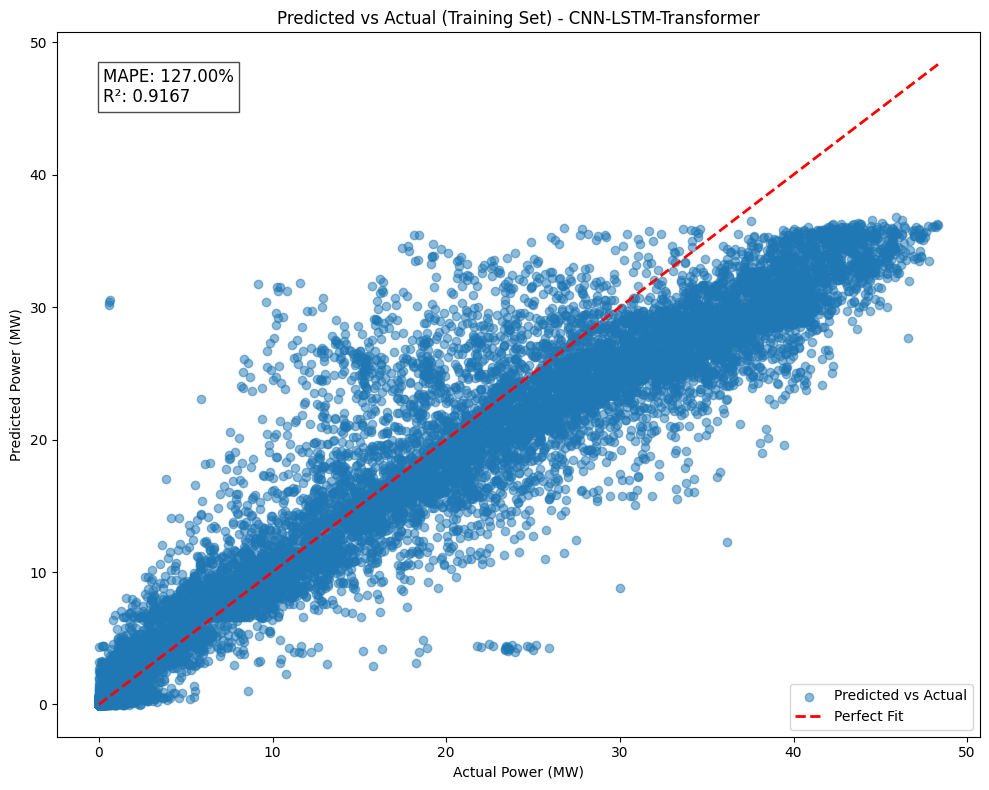

Scatter plot saved to images/Predicted_vs_Actual_(Training_Set)_-_CNN-LSTM-Transformer.png


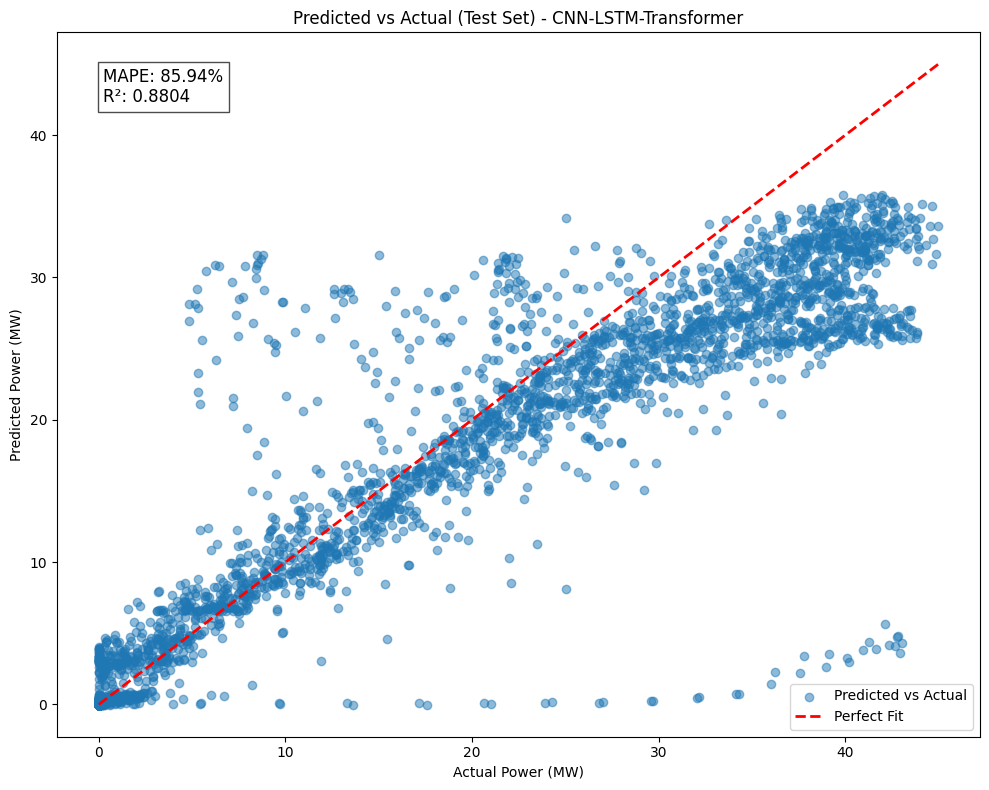

Scatter plot saved to images/Predicted_vs_Actual_(Test_Set)_-_CNN-LSTM-Transformer.png


In [ ]:
# Scatter plots with model name 'CNN-LSTM-Transformer'
plot_scatter(y_true_train, y_pred_train, 'Predicted vs Actual (Training Set) - CNN-LSTM-Transformer')
plot_scatter(y_true_test, y_pred_test, 'Predicted vs Actual (Test Set) - CNN-LSTM-Transformer')

In [ ]:
# Calculate metrics for the CNN-LSTM-Transformer model
# Training set metrics
(cnn_lstm_tr_mse_train, cnn_lstm_tr_rmse_train, cnn_lstm_tr_mae_train,
 cnn_lstm_tr_r2_train, cnn_lstm_tr_mape_train) = calculate_metrics(
    y_true_train, y_pred_train
)

# Test set metrics
(cnn_lstm_tr_mse_test, cnn_lstm_tr_rmse_test, cnn_lstm_tr_mae_test,
 cnn_lstm_tr_r2_test, cnn_lstm_tr_mape_test) = calculate_metrics(
    y_true_test, y_pred_test
)

# Print the CNN-LSTM-Transformer model's performance on the training set
print("\nCNN-LSTM-Transformer Model on Train set performance:")
print(f"MSE: {cnn_lstm_tr_mse_train:.2f}")
print(f"RMSE: {cnn_lstm_tr_rmse_train:.2f}")
print(f"MAE: {cnn_lstm_tr_mae_train:.2f}")
print(f"R2 Score: {cnn_lstm_tr_r2_train:.2f}")
print(f"MAPE: {cnn_lstm_tr_mape_train:.2f}%")

# Print the CNN-LSTM-Transformer model's performance on the test set
print("\nCNN-LSTM-Transformer Model on Test set performance:")
print(f"MSE: {cnn_lstm_tr_mse_test:.2f}")
print(f"RMSE: {cnn_lstm_tr_rmse_test:.2f}")
print(f"MAE: {cnn_lstm_tr_mae_test:.2f}")
print(f"R2 Score: {cnn_lstm_tr_r2_test:.2f}")
print(f"MAPE: {cnn_lstm_tr_mape_test:.2f}%")

# Save the best CNN-LSTM-Transformer model
model_path = 'models/best_cnn_lstm_transformer_model.h5'
best_cnn_lstm_transformer_model.save(model_path)
print("\nBest CNN-LSTM-Transformer Model saved successfully at:", model_path)


CNN-LSTM-Transformer Model on Train set performance:
MSE: 15.95
RMSE: 3.99
MAE: 2.17
R2 Score: 0.92
MAPE: 127.00%

CNN-LSTM-Transformer Model on Test set performance:
MSE: 25.19
RMSE: 5.02
MAE: 2.38
R2 Score: 0.88
MAPE: 85.94%

Best CNN-LSTM-Transformer Model saved successfully at: models/best_cnn_lstm_transformer_model.h5


### MODEL : CNN-LSTM-TR-RF

In [ ]:
# Load the trained CNN-LSTM-Transformer model
best_cnn_lstm_tr_model = tf.keras.models.load_model(
    'models/best_cnn_lstm_transformer_model.h5',
    custom_objects={
        'mse': tf.keras.losses.MeanSquaredError(),  # Add other custom objects if needed
    }
)

# Load the trained Random Forest model
best_rf_model = joblib.load('models/best_rf_model.pkl')


In [ ]:
# Generate predictions using the CNN-LSTM-Transformer model
cnn_lstm_tr_train_preds = best_cnn_lstm_tr_model.predict(X_train_seq).flatten()
cnn_lstm_tr_test_preds = best_cnn_lstm_tr_model.predict(X_test_seq).flatten()


# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Truncate predictions to match the actual data lengths
cnn_lstm_tr_train_preds = cnn_lstm_tr_train_preds[:len(y_true_train)]
cnn_lstm_tr_test_preds = cnn_lstm_tr_test_preds[:len(y_true_test)]

# Combine CNN-LSTM-Transformer predictions with original features
X_train_cnn_lstm_tr_rf_combined = pd.concat([X_train_ss.iloc[TIME_STEPS_ss:],
                                 pd.DataFrame(cnn_lstm_tr_train_preds, index=y_true_train.index,
                                              columns=['cnn_lstm_tr_pred'])], axis=1)

X_test_cnn_lstm_tr_rf_combined = pd.concat([X_test_ss.iloc[TIME_STEPS_ss:],
                                pd.DataFrame(cnn_lstm_tr_test_preds, index=y_true_test.index,
                                             columns=['cnn_lstm_tr_pred'])], axis=1)

747/747 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


In [ ]:
# Train the Random Forest model on the combined features
best_rf_model.fit(X_train_cnn_lstm_tr_rf_combined, y_true_train)

RandomForestRegressor(max_depth=10, max_features=2, min_samples_leaf=4,
                      min_samples_split=5, n_estimators=300, random_state=42)

In [ ]:
# Make predictions on the training and test sets
y_pred_cnn_lstm_tr_rf_train = best_rf_model.predict(X_train_cnn_lstm_tr_rf_combined)
y_pred_cnn_lstm_tr_rf_test = best_rf_model.predict(X_test_cnn_lstm_tr_rf_combined)


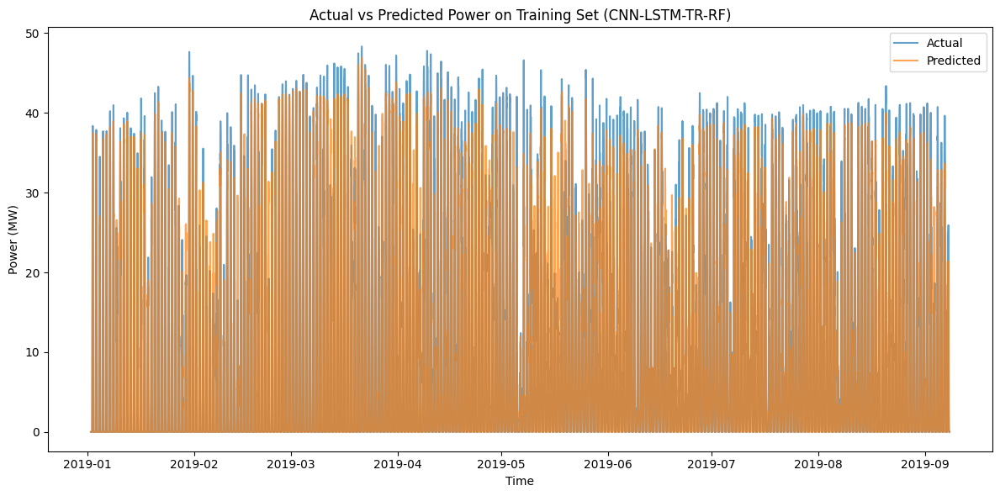

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(CNN-LSTM-TR-RF).png


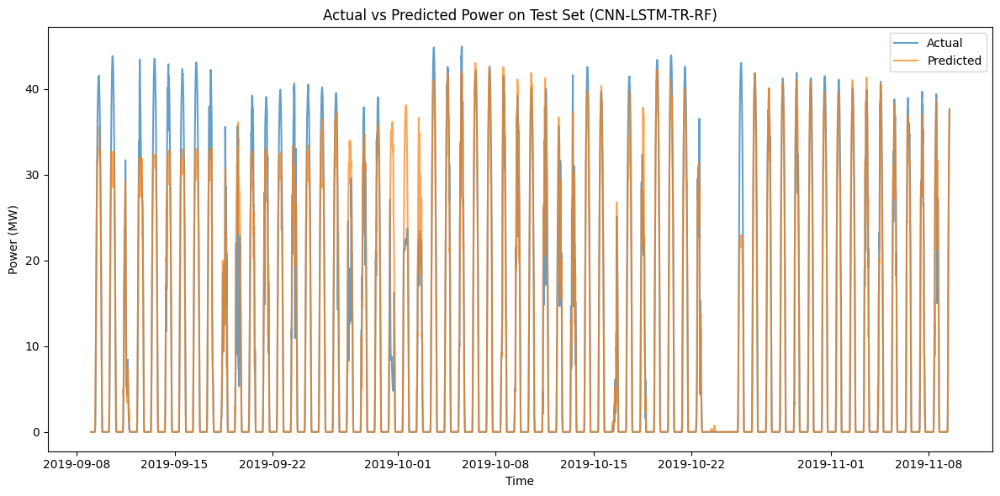

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(CNN-LSTM-TR-RF).png


In [ ]:
# Plot time series of actual vs predicted for the CNN-LSTM-TR-RF hybrid model
plot_predictions(y_true_train, pd.Series(y_pred_cnn_lstm_tr_rf_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (CNN-LSTM-TR-RF)')
plot_predictions(y_true_test, pd.Series(y_pred_cnn_lstm_tr_rf_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (CNN-LSTM-TR-RF)')

In [ ]:
# Scatter plots with model name 'CNN-LSTM-TR-RF'
plot_scatter(y_true_train, y_pred_cnn_lstm_tr_rf_train, 'Predicted vs Actual (Training Set) - CNN-LSTM-TR-RF')
plot_scatter(y_true_test, y_pred_cnn_lstm_tr_rf_test, 'Predicted vs Actual (Test Set) - CNN-LSTM-TR-RF')

In [ ]:
# Evaluate the model on the training set
(cnn_lstm_tr_rf_mse_train, cnn_lstm_tr_rf_rmse_train, cnn_lstm_tr_rf_mae_train,
 cnn_lstm_tr_rf_r2_train, cnn_lstm_tr_rf_mape_train) = calculate_metrics(
    y_true_train, y_pred_cnn_lstm_tr_rf_train
)

print("Random Forest Train set performance with CNN-LSTM-Transformer features:")
print(f"MSE: {cnn_lstm_tr_rf_mse_train:.2f}")
print(f"RMSE: {cnn_lstm_tr_rf_rmse_train:.2f}")
print(f"MAE: {cnn_lstm_tr_rf_mae_train:.2f}")
print(f"R2 Score: {cnn_lstm_tr_rf_r2_train:.2f}")
print(f"MAPE: {cnn_lstm_tr_rf_mape_train:.2f}%")

# Evaluate the model on the test set
(cnn_lstm_tr_rf_mse_test, cnn_lstm_tr_rf_rmse_test, cnn_lstm_tr_rf_mae_test,
 cnn_lstm_tr_rf_r2_test, cnn_lstm_tr_rf_mape_test) = calculate_metrics(
    y_true_test, y_pred_cnn_lstm_tr_rf_test
)

print("\nRandom Forest Test set performance with CNN-LSTM-Transformer features:")
print(f"MSE: {cnn_lstm_tr_rf_mse_test:.2f}")
print(f"RMSE: {cnn_lstm_tr_rf_rmse_test:.2f}")
print(f"MAE: {cnn_lstm_tr_rf_mae_test:.2f}")
print(f"R2 Score: {cnn_lstm_tr_rf_r2_test:.2f}")
print(f"MAPE: {cnn_lstm_tr_rf_mape_test:.2f}%")

Random Forest Train set performance with CNN-LSTM-Transformer features:
MSE: 5.50
RMSE: 2.35
MAE: 0.98
R2 Score: 0.97
MAPE: 24.84%

Random Forest Test set performance with CNN-LSTM-Transformer features:
MSE: 12.65
RMSE: 3.56
MAE: 1.36
R2 Score: 0.94
MAPE: 33.04%


### MODEL 3: CNN-BiLSTM-TRANSFORMER (PROPOSED MODEL)

In [ ]:
# Define the hyperparameter search space
hp_space_ss_cnn_bilstm_transformer = {
    'num_cnn_layers': [1, 2],
    'cnn_filters': [16, 32],
    'cnn_kernel_size': [3, 5],
    'bilstm_units': [32, 64],
    'num_bilstm_layers': [1, 2],
    'num_transformer_blocks': [1, 2],
    'num_heads': [2, 4],
    'key_dim': [16, 32],
    'ff_dim': [32, 64],
    'dense_layers': [1, 2],
    'dense_units': [32, 64],
    'dropout_rate': [0.1, 0.2, 0.3],
    'learning_rate': [1e-4, 1e-3, 1e-2],
    'optimizer': ['adam', 'nadam', 'rmsprop']
}

In [ ]:
# Build CNN-BiLSTM-Transformer Model
def build_cnn_bilstm_transformer_model(hp):
    inputs = layers.Input(shape=(TIME_STEPS_ss, len(FEATURES_ss)))

    # CNN Layers
    x = inputs
    num_cnn_layers = hp.Int('num_cnn_layers', hp_space_ss_cnn_bilstm_transformer['num_cnn_layers'][0], hp_space_ss_cnn_bilstm_transformer['num_cnn_layers'][-1])
    for i in range(num_cnn_layers):
        x = layers.Conv1D(
            filters=hp.Choice(f'cnn_filters_{i}', hp_space_ss_cnn_bilstm_transformer['cnn_filters']),
            kernel_size=hp.Choice(f'cnn_kernel_size_{i}', hp_space_ss_cnn_bilstm_transformer['cnn_kernel_size']),
            activation='relu',
            padding='same'
        )(x)
        x = layers.MaxPooling1D(pool_size=2)(x)

    # BiLSTM Layers
    num_bilstm_layers = hp.Int('num_bilstm_layers', hp_space_ss_cnn_bilstm_transformer['num_bilstm_layers'][0], hp_space_ss_cnn_bilstm_transformer['num_bilstm_layers'][-1])
    for i in range(num_bilstm_layers):
        return_sequences = i < num_bilstm_layers - 1 or hp.Int('num_transformer_blocks', hp_space_ss_cnn_bilstm_transformer['num_transformer_blocks'][0], hp_space_ss_cnn_bilstm_transformer['num_transformer_blocks'][-1]) > 0
        x = layers.Bidirectional(
            layers.LSTM(
                units=hp.Choice(f'bilstm_units_{i}', hp_space_ss_cnn_bilstm_transformer['bilstm_units']),
                return_sequences=return_sequences
            )
        )(x)
        x = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_bilstm_transformer['dropout_rate']))(x)

    # Ensure we have a 3D tensor for the Transformer blocks
    if len(x.shape) == 2:
        x = layers.Reshape((1, -1))(x)

    # Transformer Layers
    num_transformer_blocks = hp.Int('num_transformer_blocks', hp_space_ss_cnn_bilstm_transformer['num_transformer_blocks'][0], hp_space_ss_cnn_bilstm_transformer['num_transformer_blocks'][-1])
    for _ in range(num_transformer_blocks):
        # Multi-Head Attention
        attention = layers.MultiHeadAttention(
            num_heads=hp.Choice('num_heads', hp_space_ss_cnn_bilstm_transformer['num_heads']),
            key_dim=hp.Choice('key_dim', hp_space_ss_cnn_bilstm_transformer['key_dim'])
        )(x, x)
        attention = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_bilstm_transformer['dropout_rate']))(attention)
        x = layers.Add()([x, attention])
        x = layers.LayerNormalization(epsilon=1e-6)(x)

        # Feed-Forward Network
        ff_dim = hp.Choice('ff_dim', hp_space_ss_cnn_bilstm_transformer['ff_dim'])
        ff = layers.Dense(ff_dim, activation='relu')(x)
        ff = layers.Dense(x.shape[-1])(ff)
        ff = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_bilstm_transformer['dropout_rate']))(ff)
        x = layers.Add()([x, ff])
        x = layers.LayerNormalization(epsilon=1e-6)(x)

    # Flatten the output if it's still 3D
    if len(x.shape) > 2:
        x = layers.GlobalAveragePooling1D()(x)

    # Dense Layers
    dense_layers = hp.Int('dense_layers', hp_space_ss_cnn_bilstm_transformer['dense_layers'][0], hp_space_ss_cnn_bilstm_transformer['dense_layers'][-1])
    for i in range(dense_layers):
        x = layers.Dense(
            units=hp.Choice(f'dense_units_{i}', hp_space_ss_cnn_bilstm_transformer['dense_units']),
            activation='relu'
        )(x)
        x = layers.Dropout(hp.Choice('dropout_rate', hp_space_ss_cnn_bilstm_transformer['dropout_rate']))(x)

    outputs = layers.Dense(1)(x)

    model = models.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    optimizer_choice = hp.Choice('optimizer', hp_space_ss_cnn_bilstm_transformer['optimizer'])
    learning_rate = hp.Float('learning_rate', hp_space_ss_cnn_bilstm_transformer['learning_rate'][0], hp_space_ss_cnn_bilstm_transformer['learning_rate'][-1], sampling='log')

    if optimizer_choice == 'adam':
        optimizer = optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = optimizers.Nadam(learning_rate=learning_rate)
    else:  # rmsprop
        optimizer = optimizers.RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    return model

In [ ]:
# Initialize the tuner
tuner_cnn_bilstm_transformer = kt.Hyperband(
    build_cnn_bilstm_transformer_model,
    objective='val_loss',
    max_epochs=30,
    factor=3,
    directory='cnn_bilstm_transformer_tuning',
    project_name='cnn_bilstm_transformer_prediction'
)

# Search for the best hyperparameters
tuner_cnn_bilstm_transformer.search(X_train_seq, y_train_seq,
                                    epochs=50,
                                    validation_split=0.2,
                                    callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)])

Trial 90 Complete [00h 03m 01s]
val_loss: 10.421364784240723

Best val_loss So Far: 10.421364784240723
Total elapsed time: 02h 03m 25s


In [ ]:
# Get the best hyperparameters
best_cnn_bilstm_transformer_hps = tuner_cnn_bilstm_transformer.get_best_hyperparameters(num_trials=1)[0]
print("The best hyperparameters for CNN-BiLSTM-Transformer are:")
for param, value in best_cnn_bilstm_transformer_hps.values.items():
    print(f"{param}: {value}")


The best hyperparameters for CNN-BiLSTM-Transformer are:
num_cnn_layers: 2
cnn_filters_0: 16
cnn_kernel_size_0: 3
num_bilstm_layers: 1
num_transformer_blocks: 2
bilstm_units_0: 64
dropout_rate: 0.2
num_heads: 2
key_dim: 32
ff_dim: 32
dense_layers: 2
dense_units_0: 64
optimizer: adam
learning_rate: 0.00038747292328016573
cnn_filters_1: 32
cnn_kernel_size_1: 3
bilstm_units_1: 32
dense_units_1: 64
tuner/epochs: 30
tuner/initial_epoch: 0
tuner/bracket: 0
tuner/round: 0


In [ ]:
# Build the model with the best hyperparameters
best_cnn_bilstm_transformer_model = tuner_cnn_bilstm_transformer.hypermodel.build(best_cnn_bilstm_transformer_hps)
best_cnn_bilstm_transformer_model.summary()

# Train the best model
history_cnn_bilstm_transformer = best_cnn_bilstm_transformer_model.fit(X_train_seq, y_train_seq,
                                                                       epochs=50,
                                                                       batch_size=32,
                                                                       validation_split=0.2,
                                                                       callbacks=[tf.keras.callbacks.EarlyStopping(patience=10)])

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 96, 4)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 96, 16)         │            208 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_2           │ (None, 48, 16)         │              0 │ conv1d_2[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_3 (Conv1D)         │ (None, 48, 32)         │          1,568 │ max_pooling1d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_3           │ (None, 24, 32)         │              0 │ conv1d_3[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_1           │ (None, 24, 128)        │         49,664 │ max_pooling1d_3[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_9 (Dropout)       │ (None, 24, 128)        │              0 │ bidirectional_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention_2    │ (None, 24, 128)        │         33,088 │ dropout_9[0][0],       │
│ (MultiHeadAttention)      │                        │                │ dropout_9[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_11 (Dropout)      │ (None, 24, 128)        │              0 │ multi_head_attention_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_4 (Add)               │ (None, 24, 128)        │              0 │ dropout_9[0][0],       │
│                           │                        │                │ dropout_11[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_4     │ (None, 24, 128)        │            256 │ add_4[0][0]            │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 24, 32)         │          4,128 │ layer_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_8 (Dense)           │ (None, 24, 128)        │          4,224 │ dense_7[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_12 (Dropout)      │ (None, 24, 128)        │              0 │ dense_8[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_5 (Add)               │ (None, 24, 128)        │              0 │ layer_normalization_4… │
│                           │                        │                │ dropout_12[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_5

 Total params: 147,825 (577.44 KB)

 Trainable params: 147,825 (577.44 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 18s 18ms/step - loss: 113.0585 - mae: 6.8577 - val_loss: 14.0343 - val_mae: 2.2331
Epoch 2/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 22.0353 - mae: 2.5349 - val_loss: 12.2628 - val_mae: 1.8379
Epoch 3/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 19.9424 - mae: 2.3621 - val_loss: 11.5492 - val_mae: 1.7366
Epoch 4/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - loss: 18.6695 - mae: 2.2671 - val_loss: 12.4771 - val_mae: 2.0299
Epoch 5/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 11s 18ms/step - loss: 17.9631 - mae: 2.2245 - val_loss: 12.4618 - val_mae: 1.8586
Epoch 6/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 17.5504 - mae: 2.1842 - val_loss: 12.4944 - val_mae: 1.8808
Epoch 7/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 16.1934 - mae: 2.0926 - val_loss: 11.7098 - val_mae: 1.8388
Epoch 8/50
598/598 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 16.3866 - mae: 2.1178 - val_loss: 12.8622 - val_mae: 1.7790
Epoch 9/50
598/598 ━━━━

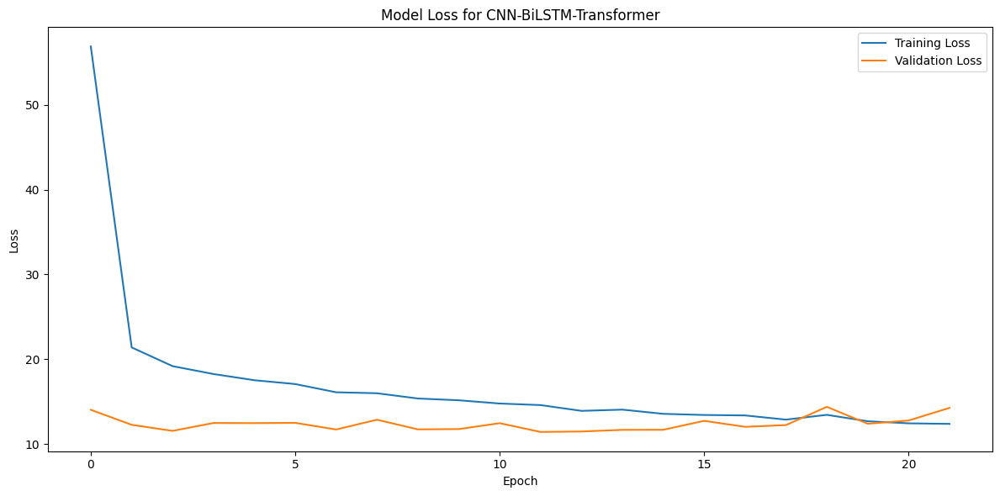

Training history plot saved to images/CNN-BiLSTM-Transformer_Model_Loss.png


In [ ]:
# Plot training history with model name 'CNN-BiLSTM-Transformer'
plot_training_history(history_cnn_bilstm_transformer, model_name='CNN-BiLSTM-Transformer')

In [ ]:
# Make predictions
y_pred_train = best_cnn_bilstm_transformer_model.predict(X_train_seq).flatten()
y_pred_test = best_cnn_bilstm_transformer_model.predict(X_test_seq).flatten()

# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Ensure consistent lengths
y_pred_train = y_pred_train[:len(y_true_train)]
y_pred_test = y_pred_test[:len(y_true_test)]

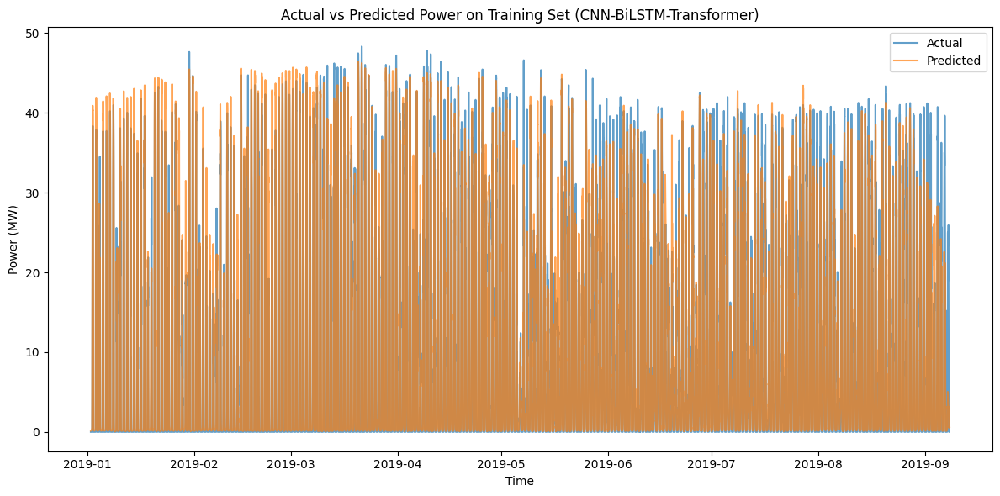

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(CNN-BiLSTM-Transformer).png


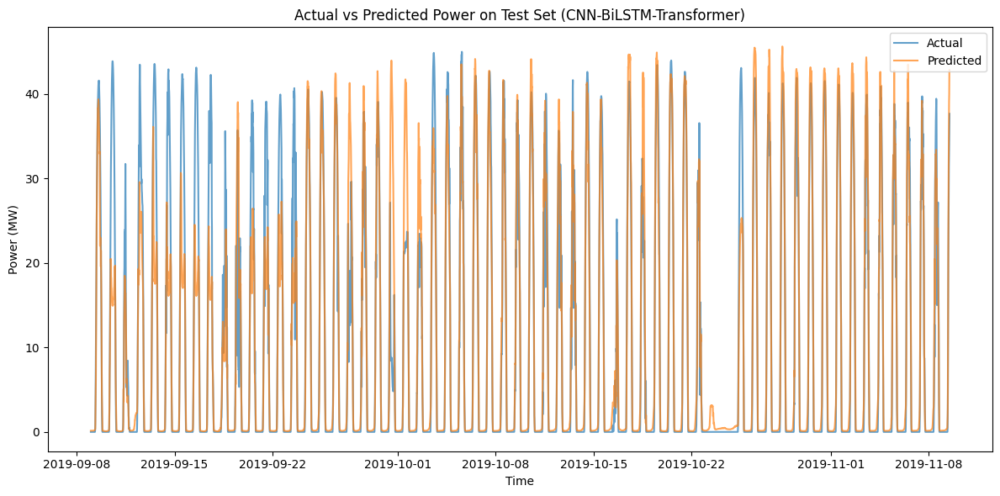

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(CNN-BiLSTM-Transformer).png


In [ ]:
# Plot time series of actual vs predicted for the CNN-BiLSTM-Transformer model
plot_predictions(y_true_train, pd.Series(y_pred_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (CNN-BiLSTM-Transformer)')
plot_predictions(y_true_test, pd.Series(y_pred_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (CNN-BiLSTM-Transformer)')


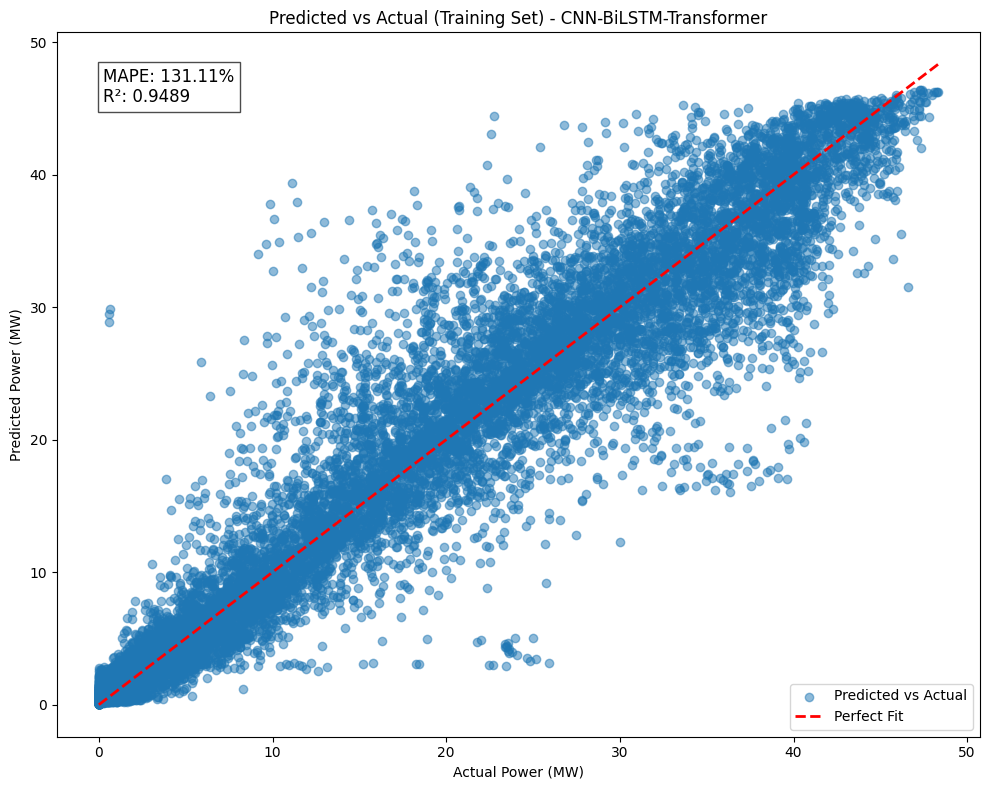

Scatter plot saved to images/Predicted_vs_Actual_(Training_Set)_-_CNN-BiLSTM-Transformer.png


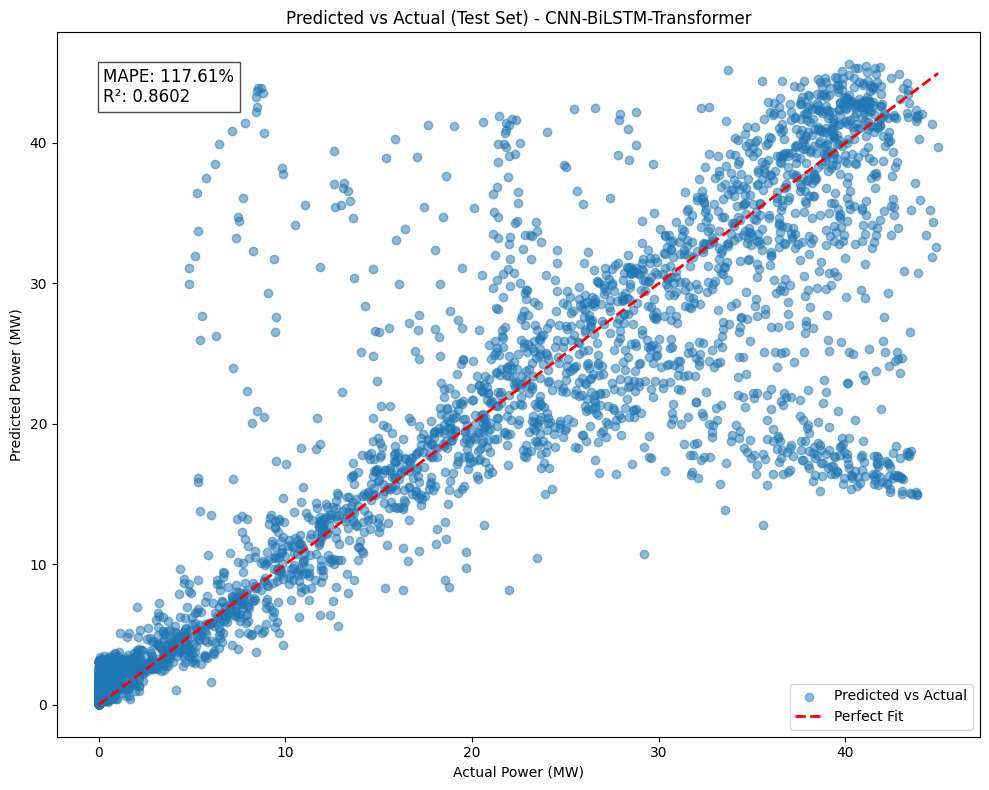

Scatter plot saved to images/Predicted_vs_Actual_(Test_Set)_-_CNN-BiLSTM-Transformer.png


In [ ]:
# Scatter plots with model name 'CNN-BiLSTM-Transformer'
plot_scatter(y_true_train, y_pred_train, 'Predicted vs Actual (Training Set) - CNN-BiLSTM-Transformer')
plot_scatter(y_true_test, y_pred_test, 'Predicted vs Actual (Test Set) - CNN-BiLSTM-Transformer')


In [ ]:
# Calculate metrics for the CNN-BiLSTM-Transformer model
# Training set metrics
(cnn_bilstm_tr_mse_train, cnn_bilstm_tr_rmse_train, cnn_bilstm_tr_mae_train,
 cnn_bilstm_tr_r2_train, cnn_bilstm_tr_mape_train) = calculate_metrics(
    y_true_train, y_pred_train
)

# Test set metrics
(cnn_bilstm_tr_mse_test, cnn_bilstm_tr_rmse_test, cnn_bilstm_tr_mae_test,
 cnn_bilstm_tr_r2_test, cnn_bilstm_tr_mape_test) = calculate_metrics(
    y_true_test, y_pred_test
)

# Print the CNN-BiLSTM-Transformer model's performance on the training set
print("\nCNN-BiLSTM-Transformer Model on Train set performance:")
print(f"MSE: {cnn_bilstm_tr_mse_train:.2f}")
print(f"RMSE: {cnn_bilstm_tr_rmse_train:.2f}")
print(f"MAE: {cnn_bilstm_tr_mae_train:.2f}")
print(f"R2 Score: {cnn_bilstm_tr_r2_train:.2f}")
print(f"MAPE: {cnn_bilstm_tr_mape_train:.2f}%")

# Print the CNN-BiLSTM-Transformer model's performance on the test set
print("\nCNN-BiLSTM-Transformer Model on Test set performance:")
print(f"MSE: {cnn_bilstm_tr_mse_test:.2f}")
print(f"RMSE: {cnn_bilstm_tr_rmse_test:.2f}")
print(f"MAE: {cnn_bilstm_tr_mae_test:.2f}")
print(f"R2 Score: {cnn_bilstm_tr_r2_test:.2f}")
print(f"MAPE: {cnn_bilstm_tr_mape_test:.2f}%")

# Save the best CNN-BiLSTM-Transformer model
model_path = 'models/best_cnn_bilstm_transformer_model.h5'
best_cnn_bilstm_transformer_model.save(model_path)
print("\nBest CNN-BiLSTM-Transformer Model saved successfully at:", model_path)


CNN-BiLSTM-Transformer Model on Train set performance:
MSE: 9.78
RMSE: 3.13
MAE: 1.58
R2 Score: 0.95
MAPE: 131.11%

CNN-BiLSTM-Transformer Model on Test set performance:
MSE: 29.43
RMSE: 5.43
MAE: 2.32
R2 Score: 0.86
MAPE: 117.61%

Best CNN-BiLSTM-Transformer Model saved successfully at: models/best_cnn_bilstm_transformer_model.h5


### MODEL: CNN-BiLSTM-TR-RF

In [ ]:
# Load the trained CNN-BiLSTM-Transformer model
best_cnn_bilstm_tr_model = tf.keras.models.load_model(
    'models/best_cnn_bilstm_transformer_model.h5',
    custom_objects={
        'mse': tf.keras.losses.MeanSquaredError(),  # Add other custom objects if needed
    }
)

# Load the trained Random Forest model
best_rf_model = joblib.load('models/best_rf_model.pkl')

In [ ]:
# Generate predictions using the CNN-BiLSTM-Transformer model
cnn_bilstm_tr_train_preds = best_cnn_bilstm_tr_model.predict(X_train_seq).flatten()
cnn_bilstm_tr_test_preds = best_cnn_bilstm_tr_model.predict(X_test_seq).flatten()

# Prepare actual values
y_true_train = y_train_ss.iloc[TIME_STEPS_ss:]
y_true_test = y_test_ss.iloc[TIME_STEPS_ss:]

# Truncate predictions to match the actual data lengths
cnn_bilstm_tr_train_preds = cnn_bilstm_tr_train_preds[:len(y_true_train)]
cnn_bilstm_tr_test_preds = cnn_bilstm_tr_test_preds[:len(y_true_test)]

# Combine CNN-BiLSTM-Transformer predictions with original features
X_train_cnn_bilstm_tr_rf_combined = pd.concat([X_train_ss.iloc[TIME_STEPS_ss:],
                                 pd.DataFrame(cnn_bilstm_tr_train_preds, index=y_true_train.index,
                                              columns=['cnn_bilstm_tr_pred'])], axis=1)

X_test_cnn_bilstm_tr_rf_combined = pd.concat([X_test_ss.iloc[TIME_STEPS_ss:],
                                pd.DataFrame(cnn_bilstm_tr_test_preds, index=y_true_test.index,
                                             columns=['cnn_bilstm_tr_pred'])], axis=1)

747/747 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
185/185 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


In [ ]:
# Train the Random Forest model on the combined features
best_rf_model.fit(X_train_cnn_bilstm_tr_rf_combined, y_true_train)


RandomForestRegressor(max_depth=10, max_features=2, min_samples_leaf=4,
                      min_samples_split=5, n_estimators=300, random_state=42)

In [ ]:
# Make predictions on the training and test sets
y_pred_cnn_bilstm_tr_rf_train = best_rf_model.predict(X_train_cnn_bilstm_tr_rf_combined)
y_pred_cnn_bilstm_tr_rf_test = best_rf_model.predict(X_test_cnn_bilstm_tr_rf_combined)

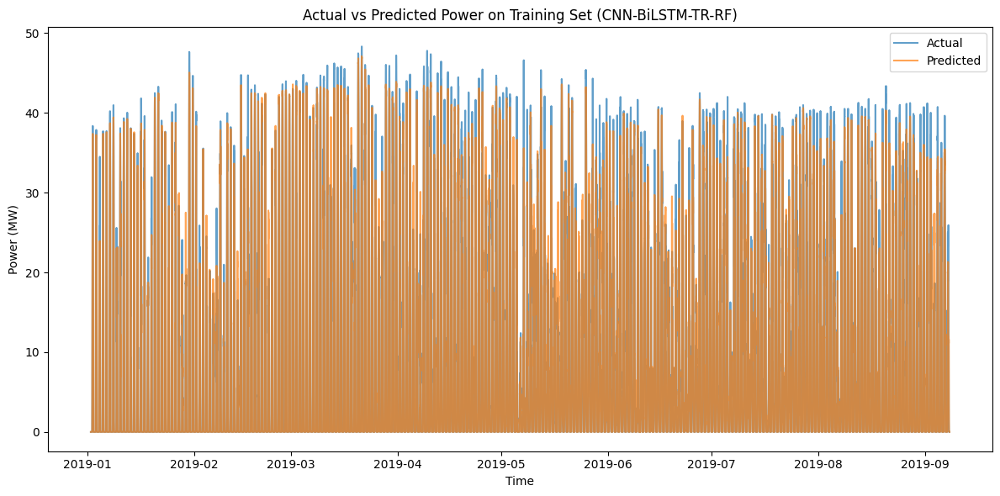

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Training_Set_(CNN-BiLSTM-TR-RF).png


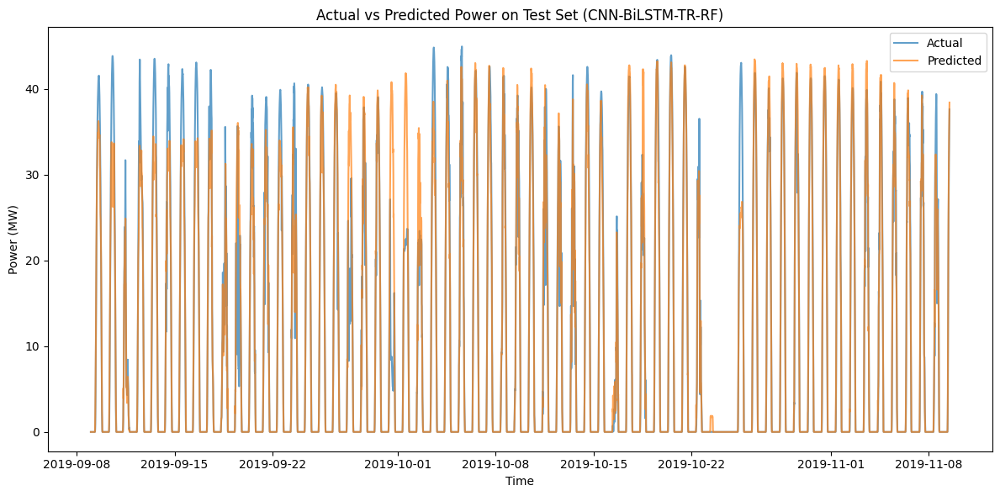

Predictions plot saved to images/Actual_vs_Predicted_Power_on_Test_Set_(CNN-BiLSTM-TR-RF).png


In [ ]:
# Plot time series of actual vs predicted for the CNN-BiLSTM-TR-RF hybrid model
plot_predictions(y_true_train, pd.Series(y_pred_cnn_bilstm_tr_rf_train, index=y_true_train.index),
                 'Actual vs Predicted Power on Training Set (CNN-BiLSTM-TR-RF)')
plot_predictions(y_true_test, pd.Series(y_pred_cnn_bilstm_tr_rf_test, index=y_true_test.index),
                 'Actual vs Predicted Power on Test Set (CNN-BiLSTM-TR-RF)')

In [ ]:
# Scatter plots with model name 'CNN-BiLSTM-TR-RF'
plot_scatter(y_true_train, y_pred_cnn_bilstm_tr_rf_train, 'Predicted vs Actual (Training Set) - CNN-BiLSTM-TR-RF')
plot_scatter(y_true_test, y_pred_cnn_bilstm_tr_rf_test, 'Predicted vs Actual (Test Set) - CNN-BiLSTM-TR-RF')

NameError: name 'plot_scatter' is not defined

In [ ]:
# Evaluate the model on the training set
(cnn_bilstm_tr_rf_mse_train, cnn_bilstm_tr_rf_rmse_train, cnn_bilstm_tr_rf_mae_train,
 cnn_bilstm_tr_rf_r2_train, cnn_bilstm_tr_rf_mape_train) = calculate_metrics(
    y_true_train, y_pred_cnn_bilstm_tr_rf_train
)

print("Random Forest Train set performance with CNN-BiLSTM-Transformer features:")
print(f"MSE: {cnn_bilstm_tr_rf_mse_train:.2f}")
print(f"RMSE: {cnn_bilstm_tr_rf_rmse_train:.2f}")
print(f"MAE: {cnn_bilstm_tr_rf_mae_train:.2f}")
print(f"R2 Score: {cnn_bilstm_tr_rf_r2_train:.2f}")
print(f"MAPE: {cnn_bilstm_tr_rf_mape_train:.2f}%")

# Evaluate the model on the test set
(cnn_bilstm_tr_rf_mse_test, cnn_bilstm_tr_rf_rmse_test, cnn_bilstm_tr_rf_mae_test,
 cnn_bilstm_tr_rf_r2_test, cnn_bilstm_tr_rf_mape_test) = calculate_metrics(
    y_true_test, y_pred_cnn_bilstm_tr_rf_test
)

print("\nRandom Forest Test set performance with CNN-BiLSTM-Transformer features:")
print(f"MSE: {cnn_bilstm_tr_rf_mse_test:.2f}")
print(f"RMSE: {cnn_bilstm_tr_rf_rmse_test:.2f}")
print(f"MAE: {cnn_bilstm_tr_rf_mae_test:.2f}")
print(f"R2 Score: {cnn_bilstm_tr_rf_r2_test:.2f}")
print(f"MAPE: {cnn_bilstm_tr_rf_mape_test:.2f}%")

Random Forest Train set performance with CNN-BiLSTM-Transformer features:
MSE: 3.65
RMSE: 1.91
MAE: 0.80
R2 Score: 0.98
MAPE: 21.43%

Random Forest Test set performance with CNN-BiLSTM-Transformer features:
MSE: 14.58
RMSE: 3.82
MAE: 1.39
R2 Score: 0.93
MAPE: 39.56%


# MODEL METRICS COMPARISONS

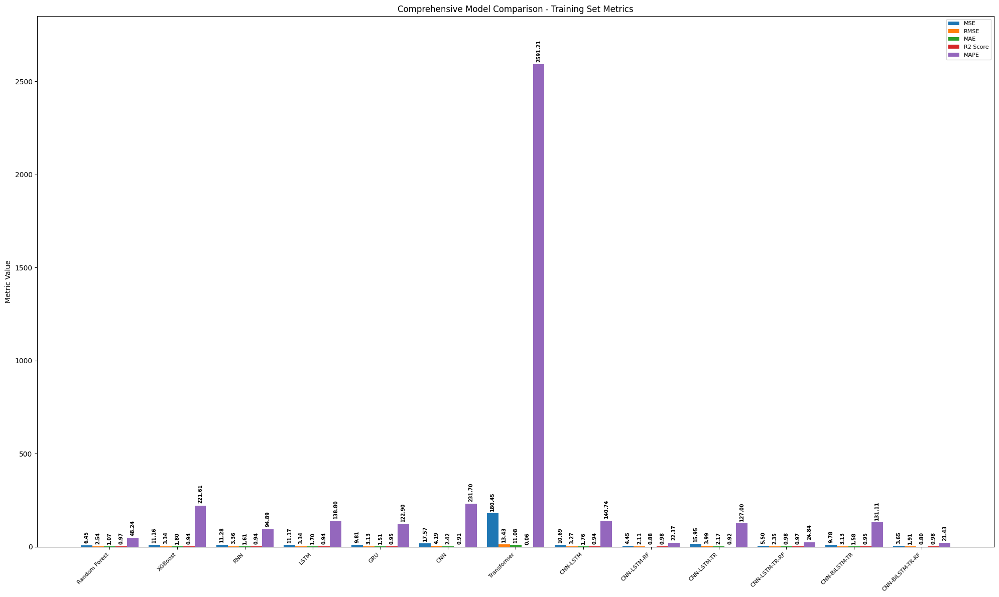

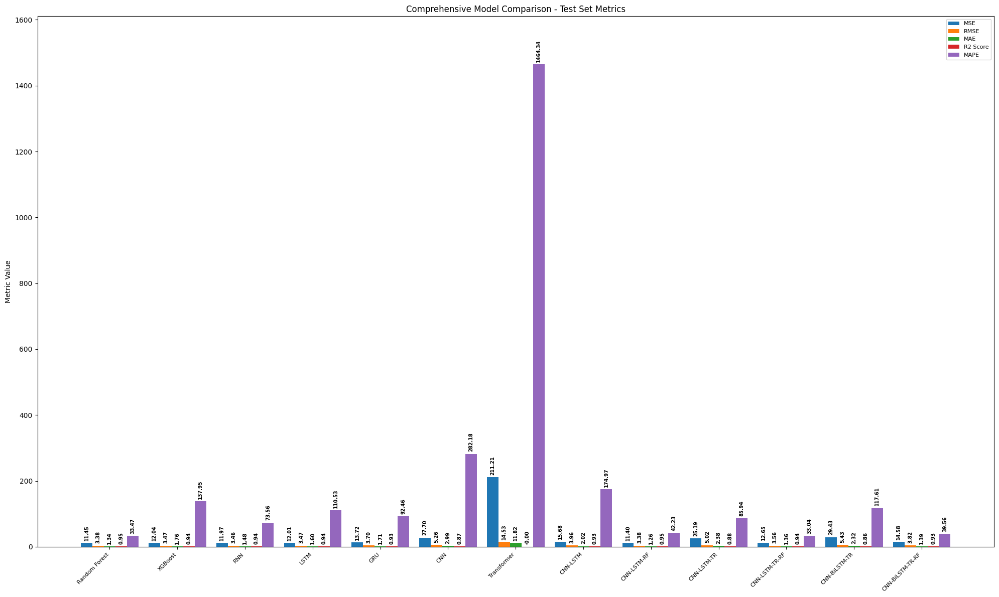

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the models and metrics
models = [
    'Random Forest', 'XGBoost', 'RNN', 'LSTM', 'GRU', 'CNN', 'Transformer',
    'CNN-LSTM', 'CNN-LSTM-RF', 'CNN-LSTM-TR', 'CNN-LSTM-TR-RF', 'CNN-BiLSTM-TR', 'CNN-BiLSTM-TR-RF'
]
metrics = ['MSE', 'RMSE', 'MAE', 'R2 Score', 'MAPE']

# Prepare data for training set
train_data = {
    'Random Forest': [rf_mse_train, rf_rmse_train, rf_mae_train, rf_r2_train, rf_mape_train],
    'XGBoost': [xgb_mse_train, xgb_rmse_train, xgb_mae_train, xgb_r2_train, xgb_mape_train],
    'RNN': [rnn_mse_train, rnn_rmse_train, rnn_mae_train, rnn_r2_train, rnn_mape_train],
    'LSTM': [lstm_mse_train, lstm_rmse_train, lstm_mae_train, lstm_r2_train, lstm_mape_train],
    'GRU': [gru_mse_train, gru_rmse_train, gru_mae_train, gru_r2_train, gru_mape_train],
    'CNN': [cnn_mse_train, cnn_rmse_train, cnn_mae_train, cnn_r2_train, cnn_mape_train],
    'Transformer': [tr_mse_train, tr_rmse_train, tr_mae_train, tr_r2_train, tr_mape_train],
    'CNN-LSTM': [cnn_lstm_mse_train, cnn_lstm_rmse_train, cnn_lstm_mae_train, cnn_lstm_r2_train, cnn_lstm_mape_train],
    'CNN-LSTM-RF': [cnn_lstm_rf_mse_train, cnn_lstm_rf_rmse_train, cnn_lstm_rf_mae_train, cnn_lstm_rf_r2_train, cnn_lstm_rf_mape_train],
    'CNN-LSTM-TR': [cnn_lstm_tr_mse_train, cnn_lstm_tr_rmse_train, cnn_lstm_tr_mae_train, cnn_lstm_tr_r2_train, cnn_lstm_tr_mape_train],
    'CNN-LSTM-TR-RF': [cnn_lstm_tr_rf_mse_train, cnn_lstm_tr_rf_rmse_train, cnn_lstm_tr_rf_mae_train, cnn_lstm_tr_rf_r2_train, cnn_lstm_tr_rf_mape_train],
    'CNN-BiLSTM-TR': [cnn_bilstm_tr_mse_train, cnn_bilstm_tr_rmse_train, cnn_bilstm_tr_mae_train, cnn_bilstm_tr_r2_train, cnn_bilstm_tr_mape_train],
    'CNN-BiLSTM-TR-RF': [cnn_bilstm_tr_rf_mse_train, cnn_bilstm_tr_rf_rmse_train, cnn_bilstm_tr_rf_mae_train, cnn_bilstm_tr_rf_r2_train, cnn_bilstm_tr_rf_mape_train]
}

# Prepare data for test set
test_data = {
    'Random Forest': [rf_mse_test, rf_rmse_test, rf_mae_test, rf_r2_test, rf_mape_test],
    'XGBoost': [xgb_mse_test, xgb_rmse_test, xgb_mae_test, xgb_r2_test, xgb_mape_test],
    'RNN': [rnn_mse_test, rnn_rmse_test, rnn_mae_test, rnn_r2_test, rnn_mape_test],
    'LSTM': [lstm_mse_test, lstm_rmse_test, lstm_mae_test, lstm_r2_test, lstm_mape_test],
    'GRU': [gru_mse_test, gru_rmse_test, gru_mae_test, gru_r2_test, gru_mape_test],
    'CNN': [cnn_mse_test, cnn_rmse_test, cnn_mae_test, cnn_r2_test, cnn_mape_test],
    'Transformer': [tr_mse_test, tr_rmse_test, tr_mae_test, tr_r2_test, tr_mape_test],
    'CNN-LSTM': [cnn_lstm_mse_test, cnn_lstm_rmse_test, cnn_lstm_mae_test, cnn_lstm_r2_test, cnn_lstm_mape_test],
    'CNN-LSTM-RF': [cnn_lstm_rf_mse_test, cnn_lstm_rf_rmse_test, cnn_lstm_rf_mae_test, cnn_lstm_rf_r2_test, cnn_lstm_rf_mape_test],
    'CNN-LSTM-TR': [cnn_lstm_tr_mse_test, cnn_lstm_tr_rmse_test, cnn_lstm_tr_mae_test, cnn_lstm_tr_r2_test, cnn_lstm_tr_mape_test],
    'CNN-LSTM-TR-RF': [cnn_lstm_tr_rf_mse_test, cnn_lstm_tr_rf_rmse_test, cnn_lstm_tr_rf_mae_test, cnn_lstm_tr_rf_r2_test, cnn_lstm_tr_rf_mape_test],
    'CNN-BiLSTM-TR': [cnn_bilstm_tr_mse_test, cnn_bilstm_tr_rmse_test, cnn_bilstm_tr_mae_test, cnn_bilstm_tr_r2_test, cnn_bilstm_tr_mape_test],
    'CNN-BiLSTM-TR-RF': [cnn_bilstm_tr_rf_mse_test, cnn_bilstm_tr_rf_rmse_test, cnn_bilstm_tr_rf_mae_test, cnn_bilstm_tr_rf_r2_test, cnn_bilstm_tr_rf_mape_test]
}

# Ensure the 'image' directory exists
os.makedirs('image', exist_ok=True)

def create_bar_plot(data, title, filename):
    x = np.arange(len(models))
    width = 0.17  # Increased width of the bars
    fig, ax = plt.subplots(figsize=(20, 12))  # Kept original figure size

    max_value = max(max(values) for values in data.values())

    for i, metric in enumerate(metrics):
        bars = ax.bar(x + i*width, [data[model][i] for model in models], width, label=metric)

        # Adding bolder value labels on top of the bars
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height:.2f}',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', rotation=90, fontsize=7,
                        fontweight='bold')  # Increased font size and made bold

    ax.set_ylabel('Metric Value')
    ax.set_title(title)
    ax.set_xticks(x + width * 2)  # Adjusted tick positions
    ax.set_xticklabels(models, rotation=45, ha='right', fontsize=8)  # Kept original font size for model names
    ax.legend(loc='upper right', fontsize=8)  # Kept original legend settings

    # Set y-axis limit to accommodate all values
    ax.set_ylim(0, max_value * 1.1)  # 10% margin above the highest value

    plt.tight_layout()

    # Save the figure
    plt.savefig(f'image/{filename}', format='png', dpi=300)  # Kept original DPI
    plt.show()

# Create and save bar plot for training set
create_bar_plot(train_data, 'Comprehensive Model Comparison - Training Set Metrics', 'comprehensive_train_metrics.png')

# Create and save bar plot for test set
create_bar_plot(test_data, 'Comprehensive Model Comparison - Test Set Metrics', 'comprehensive_test_metrics.png')

For better visibility, The Transformer model will be excluded.

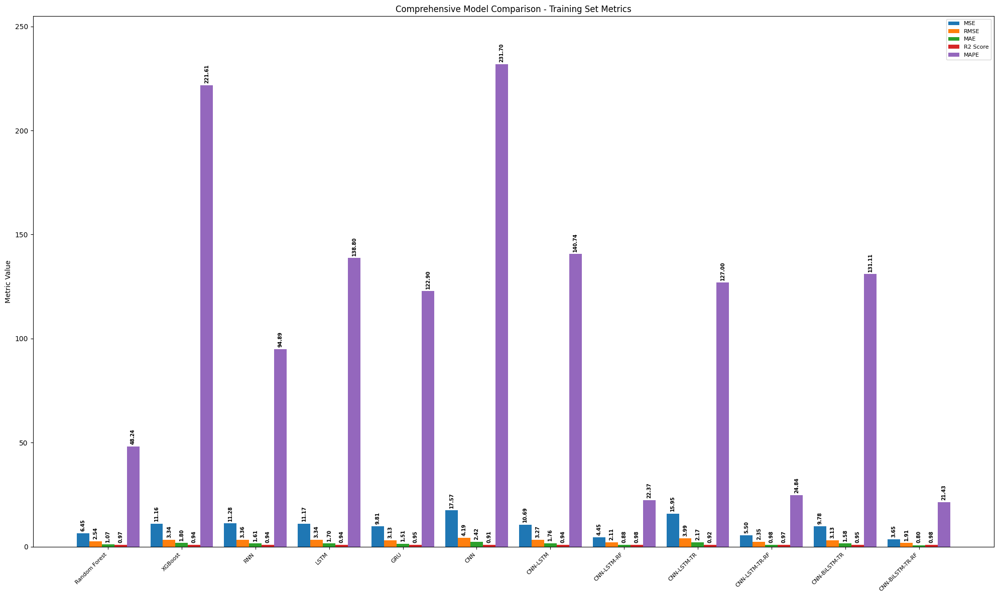

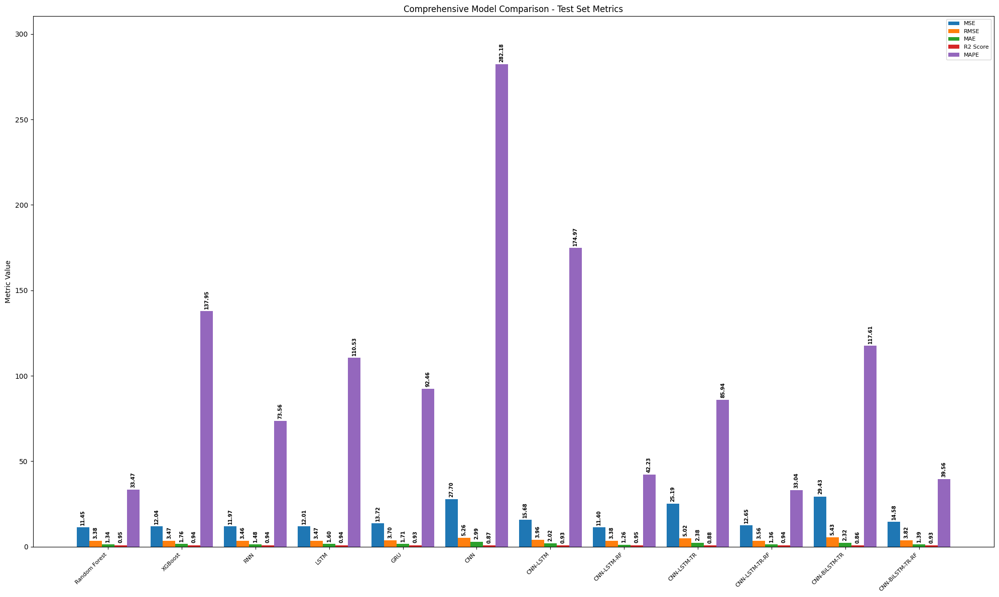

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the models and metrics
models = [
    'Random Forest', 'XGBoost', 'RNN', 'LSTM', 'GRU', 'CNN',
    'CNN-LSTM', 'CNN-LSTM-RF', 'CNN-LSTM-TR', 'CNN-LSTM-TR-RF', 'CNN-BiLSTM-TR', 'CNN-BiLSTM-TR-RF'
]
metrics = ['MSE', 'RMSE', 'MAE', 'R2 Score', 'MAPE']

# Prepare data for training set
train_data = {
    'Random Forest': [rf_mse_train, rf_rmse_train, rf_mae_train, rf_r2_train, rf_mape_train],
    'XGBoost': [xgb_mse_train, xgb_rmse_train, xgb_mae_train, xgb_r2_train, xgb_mape_train],
    'RNN': [rnn_mse_train, rnn_rmse_train, rnn_mae_train, rnn_r2_train, rnn_mape_train],
    'LSTM': [lstm_mse_train, lstm_rmse_train, lstm_mae_train, lstm_r2_train, lstm_mape_train],
    'GRU': [gru_mse_train, gru_rmse_train, gru_mae_train, gru_r2_train, gru_mape_train],
    'CNN': [cnn_mse_train, cnn_rmse_train, cnn_mae_train, cnn_r2_train, cnn_mape_train],
    'CNN-LSTM': [cnn_lstm_mse_train, cnn_lstm_rmse_train, cnn_lstm_mae_train, cnn_lstm_r2_train, cnn_lstm_mape_train],
    'CNN-LSTM-RF': [cnn_lstm_rf_mse_train, cnn_lstm_rf_rmse_train, cnn_lstm_rf_mae_train, cnn_lstm_rf_r2_train, cnn_lstm_rf_mape_train],
    'CNN-LSTM-TR': [cnn_lstm_tr_mse_train, cnn_lstm_tr_rmse_train, cnn_lstm_tr_mae_train, cnn_lstm_tr_r2_train, cnn_lstm_tr_mape_train],
    'CNN-LSTM-TR-RF': [cnn_lstm_tr_rf_mse_train, cnn_lstm_tr_rf_rmse_train, cnn_lstm_tr_rf_mae_train, cnn_lstm_tr_rf_r2_train, cnn_lstm_tr_rf_mape_train],
    'CNN-BiLSTM-TR': [cnn_bilstm_tr_mse_train, cnn_bilstm_tr_rmse_train, cnn_bilstm_tr_mae_train, cnn_bilstm_tr_r2_train, cnn_bilstm_tr_mape_train],
    'CNN-BiLSTM-TR-RF': [cnn_bilstm_tr_rf_mse_train, cnn_bilstm_tr_rf_rmse_train, cnn_bilstm_tr_rf_mae_train, cnn_bilstm_tr_rf_r2_train, cnn_bilstm_tr_rf_mape_train]
}

# Prepare data for test set
test_data = {
    'Random Forest': [rf_mse_test, rf_rmse_test, rf_mae_test, rf_r2_test, rf_mape_test],
    'XGBoost': [xgb_mse_test, xgb_rmse_test, xgb_mae_test, xgb_r2_test, xgb_mape_test],
    'RNN': [rnn_mse_test, rnn_rmse_test, rnn_mae_test, rnn_r2_test, rnn_mape_test],
    'LSTM': [lstm_mse_test, lstm_rmse_test, lstm_mae_test, lstm_r2_test, lstm_mape_test],
    'GRU': [gru_mse_test, gru_rmse_test, gru_mae_test, gru_r2_test, gru_mape_test],
    'CNN': [cnn_mse_test, cnn_rmse_test, cnn_mae_test, cnn_r2_test, cnn_mape_test],
    'CNN-LSTM': [cnn_lstm_mse_test, cnn_lstm_rmse_test, cnn_lstm_mae_test, cnn_lstm_r2_test, cnn_lstm_mape_test],
    'CNN-LSTM-RF': [cnn_lstm_rf_mse_test, cnn_lstm_rf_rmse_test, cnn_lstm_rf_mae_test, cnn_lstm_rf_r2_test, cnn_lstm_rf_mape_test],
    'CNN-LSTM-TR': [cnn_lstm_tr_mse_test, cnn_lstm_tr_rmse_test, cnn_lstm_tr_mae_test, cnn_lstm_tr_r2_test, cnn_lstm_tr_mape_test],
    'CNN-LSTM-TR-RF': [cnn_lstm_tr_rf_mse_test, cnn_lstm_tr_rf_rmse_test, cnn_lstm_tr_rf_mae_test, cnn_lstm_tr_rf_r2_test, cnn_lstm_tr_rf_mape_test],
    'CNN-BiLSTM-TR': [cnn_bilstm_tr_mse_test, cnn_bilstm_tr_rmse_test, cnn_bilstm_tr_mae_test, cnn_bilstm_tr_r2_test, cnn_bilstm_tr_mape_test],
    'CNN-BiLSTM-TR-RF': [cnn_bilstm_tr_rf_mse_test, cnn_bilstm_tr_rf_rmse_test, cnn_bilstm_tr_rf_mae_test, cnn_bilstm_tr_rf_r2_test, cnn_bilstm_tr_rf_mape_test]
}

# Ensure the 'image' directory exists
os.makedirs('image', exist_ok=True)

def create_bar_plot(data, title, filename):
    x = np.arange(len(models))
    width = 0.17  # Increased width of the bars
    fig, ax = plt.subplots(figsize=(20, 12))  # Kept original figure size

    max_value = max(max(values) for values in data.values())

    for i, metric in enumerate(metrics):
        bars = ax.bar(x + i*width, [data[model][i] for model in models], width, label=metric)

        # Adding bolder value labels on top of the bars
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height:.2f}',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', rotation=90, fontsize=7,
                        fontweight='bold')  # Increased font size and made bold

    ax.set_ylabel('Metric Value')
    ax.set_title(title)
    ax.set_xticks(x + width * 2)  # Adjusted tick positions
    ax.set_xticklabels(models, rotation=45, ha='right', fontsize=8)  # Kept original font size for model names
    ax.legend(loc='upper right', fontsize=8)  # Kept original legend settings

    # Set y-axis limit to accommodate all values
    ax.set_ylim(0, max_value * 1.1)  # 10% margin above the highest value

    plt.tight_layout()

    # Save the figure
    plt.savefig(f'image/{filename}', format='png', dpi=300)  # Kept original DPI
    plt.show()

# Create and save bar plot for training set
create_bar_plot(train_data, 'Comprehensive Model Comparison - Training Set Metrics', 'comprehensive_train_metrics_no_transformer.png')

# Create and save bar plot for test set
create_bar_plot(test_data, 'Comprehensive Model Comparison - Test Set Metrics', 'comprehensive_test_metrics_no_transformer.png')

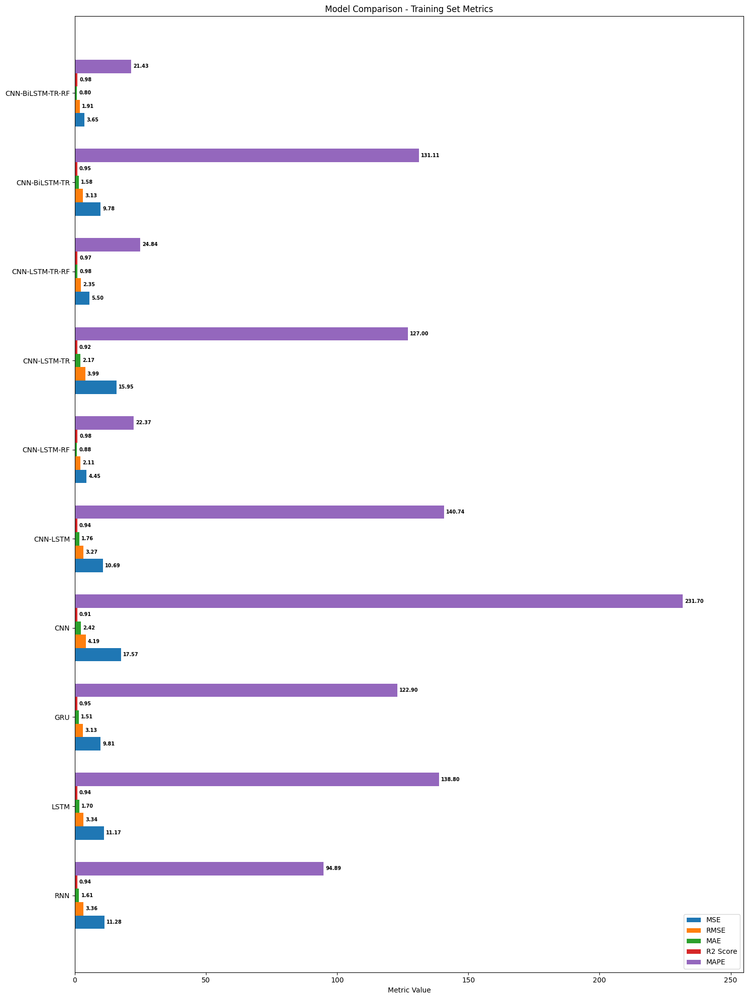

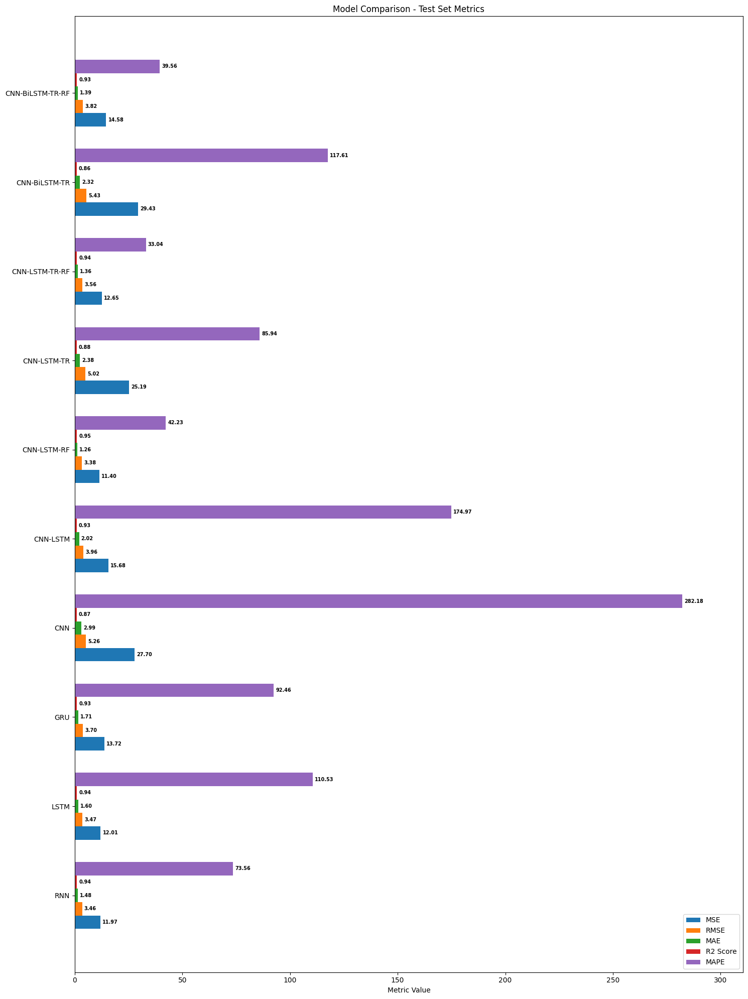

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the models and metrics
all_models = [
    'Random Forest', 'XGBoost', 'RNN', 'LSTM', 'GRU', 'CNN', 'Transformer',
    'CNN-LSTM', 'CNN-LSTM-RF', 'CNN-LSTM-TR', 'CNN-LSTM-TR-RF', 'CNN-BiLSTM-TR', 'CNN-BiLSTM-TR-RF'
]
metrics = ['MSE', 'RMSE', 'MAE', 'R2 Score', 'MAPE']

# Function to safely get variables
def safe_get(var_name):
    return globals().get(var_name)

# Prepare data for training and test sets
def prepare_data(set_type):
    data = {}
    for model in all_models:
        model_prefix = model.lower().replace('-', '_')
        metrics_data = [
            safe_get(f"{model_prefix}_mse_{set_type}"),
            safe_get(f"{model_prefix}_rmse_{set_type}"),
            safe_get(f"{model_prefix}_mae_{set_type}"),
            safe_get(f"{model_prefix}_r2_{set_type}"),
            safe_get(f"{model_prefix}_mape_{set_type}")
        ]
        if all(metric is not None for metric in metrics_data):
            data[model] = metrics_data
    return data

train_data = prepare_data('train')
test_data = prepare_data('test')

# Ensure the 'images' directory exists
os.makedirs('images', exist_ok=True)

def create_horizontal_bar_plot(data, title, filename):
    models = list(data.keys())
    y = np.arange(len(models))
    height = 0.15  # Height of the bars
    fig, ax = plt.subplots(figsize=(15, 20))  # Adjusted figure size for horizontal layout

    max_value = max(max(values) for values in data.values())

    for i, metric in enumerate(metrics):
        values = [data[model][i] for model in models]
        bars = ax.barh(y + i*height, values, height, label=metric)

        # Adding value labels on the bars
        for bar in bars:
            width = bar.get_width()
            ax.annotate(f'{width:.2f}',
                        xy=(width, bar.get_y() + bar.get_height()/2),
                        xytext=(3, 0),  # 3 points horizontal offset
                        textcoords="offset points",
                        ha='left', va='center', fontsize=7,
                        fontweight='bold')

    ax.set_xlabel('Metric Value')
    ax.set_title(title)
    ax.set_yticks(y + height * 2)  # Adjusted tick positions
    ax.set_yticklabels(models, fontsize=10)
    ax.legend(loc='lower right', fontsize=10)

    # Set x-axis limit to accommodate all values
    ax.set_xlim(0, max_value * 1.1)  # 10% margin after the highest value

    plt.tight_layout()

    # Save the figure in the 'images' directory
    plt.savefig(f'images/{filename}', format='png', dpi=300)
    plt.show()

# Create and save bar plot for training set
if train_data:
    create_horizontal_bar_plot(train_data, 'Model Comparison - Training Set Metrics', 'horizontal_train_metrics.png')
else:
    print("No training data available for plotting.")

# Create and save bar plot for test set
if test_data:
    create_horizontal_bar_plot(test_data, 'Model Comparison - Test Set Metrics', 'horizontal_test_metrics.png')
else:
    print("No test data available for plotting.")

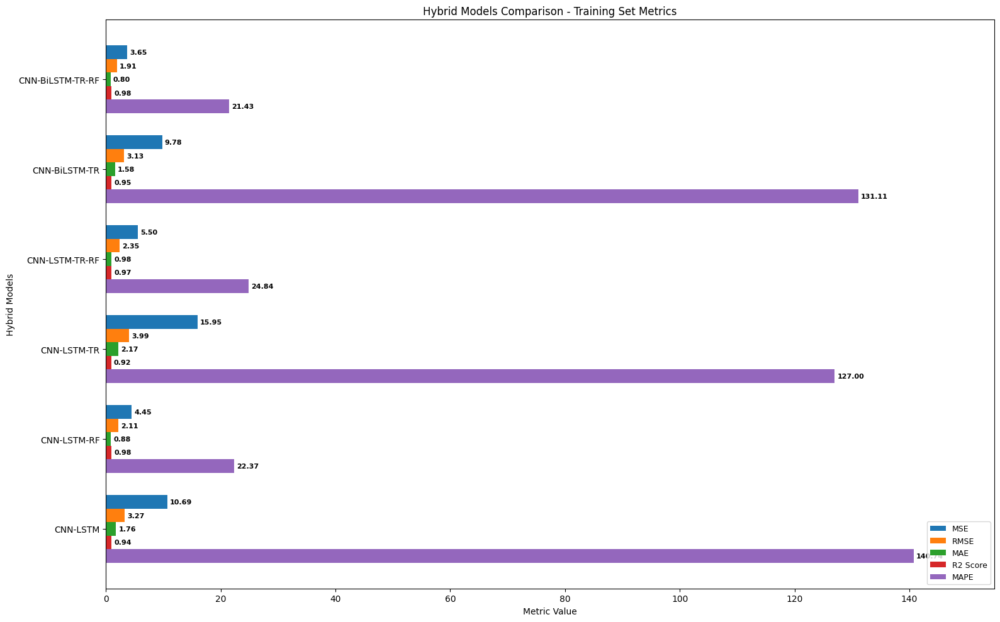

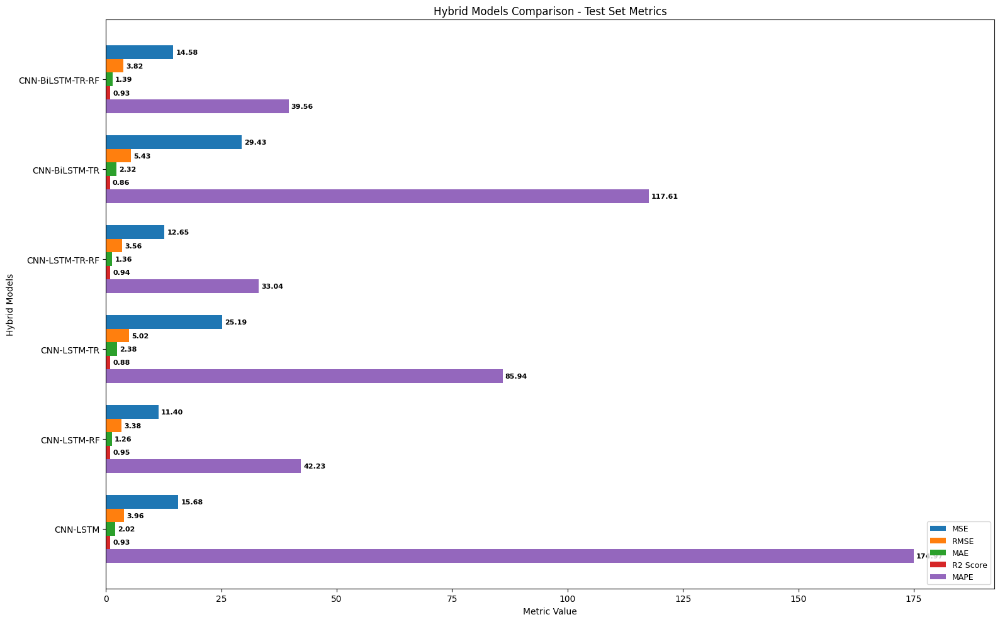

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# Define the hybrid models and metrics
hybrid_models = [
    'CNN-LSTM', 'CNN-LSTM-RF', 'CNN-LSTM-TR', 'CNN-LSTM-TR-RF', 'CNN-BiLSTM-TR', 'CNN-BiLSTM-TR-RF'
]
metrics = ['MSE', 'RMSE', 'MAE', 'R2 Score', 'MAPE']

# Prepare data for training set (hybrid models only)
train_data = {
    'CNN-LSTM': [cnn_lstm_mse_train, cnn_lstm_rmse_train, cnn_lstm_mae_train, cnn_lstm_r2_train, cnn_lstm_mape_train],
    'CNN-LSTM-RF': [cnn_lstm_rf_mse_train, cnn_lstm_rf_rmse_train, cnn_lstm_rf_mae_train, cnn_lstm_rf_r2_train, cnn_lstm_rf_mape_train],
    'CNN-LSTM-TR': [cnn_lstm_tr_mse_train, cnn_lstm_tr_rmse_train, cnn_lstm_tr_mae_train, cnn_lstm_tr_r2_train, cnn_lstm_tr_mape_train],
    'CNN-LSTM-TR-RF': [cnn_lstm_tr_rf_mse_train, cnn_lstm_tr_rf_rmse_train, cnn_lstm_tr_rf_mae_train, cnn_lstm_tr_rf_r2_train, cnn_lstm_tr_rf_mape_train],
    'CNN-BiLSTM-TR': [cnn_bilstm_tr_mse_train, cnn_bilstm_tr_rmse_train, cnn_bilstm_tr_mae_train, cnn_bilstm_tr_r2_train, cnn_bilstm_tr_mape_train],
    'CNN-BiLSTM-TR-RF': [cnn_bilstm_tr_rf_mse_train, cnn_bilstm_tr_rf_rmse_train, cnn_bilstm_tr_rf_mae_train, cnn_bilstm_tr_rf_r2_train, cnn_bilstm_tr_rf_mape_train]
}

# Prepare data for test set (hybrid models only)
test_data = {
    'CNN-LSTM': [cnn_lstm_mse_test, cnn_lstm_rmse_test, cnn_lstm_mae_test, cnn_lstm_r2_test, cnn_lstm_mape_test],
    'CNN-LSTM-RF': [cnn_lstm_rf_mse_test, cnn_lstm_rf_rmse_test, cnn_lstm_rf_mae_test, cnn_lstm_rf_r2_test, cnn_lstm_rf_mape_test],
    'CNN-LSTM-TR': [cnn_lstm_tr_mse_test, cnn_lstm_tr_rmse_test, cnn_lstm_tr_mae_test, cnn_lstm_tr_r2_test, cnn_lstm_tr_mape_test],
    'CNN-LSTM-TR-RF': [cnn_lstm_tr_rf_mse_test, cnn_lstm_tr_rf_rmse_test, cnn_lstm_tr_rf_mae_test, cnn_lstm_tr_rf_r2_test, cnn_lstm_tr_rf_mape_test],
    'CNN-BiLSTM-TR': [cnn_bilstm_tr_mse_test, cnn_bilstm_tr_rmse_test, cnn_bilstm_tr_mae_test, cnn_bilstm_tr_r2_test, cnn_bilstm_tr_mape_test],
    'CNN-BiLSTM-TR-RF': [cnn_bilstm_tr_rf_mse_test, cnn_bilstm_tr_rf_rmse_test, cnn_bilstm_tr_rf_mae_test, cnn_bilstm_tr_rf_r2_test, cnn_bilstm_tr_rf_mape_test]
}

# Ensure the 'images' directory exists
os.makedirs('images', exist_ok=True)

def create_horizontal_bar_plot(data, title, filename):
    fig, ax = plt.subplots(figsize=(16, 10))  # Adjusted figure size for fewer models

    y = np.arange(len(hybrid_models))
    height = 0.15

    max_value = max(max(values) for values in data.values())

    for i, metric in enumerate(metrics):
        values = [data[model][i] for model in hybrid_models]
        bars = ax.barh(y - i*height, values, height, label=metric)

        for bar in bars:
            width = bar.get_width()
            ax.annotate(f'{width:.2f}',
                        xy=(width, bar.get_y() + bar.get_height()/2),
                        xytext=(3, 0),
                        textcoords="offset points",
                        ha='left', va='center', fontsize=8,
                        fontweight='bold')

    ax.set_xlabel('Metric Value')
    ax.set_ylabel('Hybrid Models')
    ax.set_title(title)
    ax.set_yticks(y - height * 2)
    ax.set_yticklabels(hybrid_models, fontsize=10)
    ax.legend(loc='lower right', fontsize=9)

    ax.set_xlim(0, max_value * 1.1)

    plt.tight_layout()
    plt.savefig(f'images/{filename}', format='png', dpi=300)
    plt.show()

# Create and save bar plot for training set (hybrid models only)
create_horizontal_bar_plot(train_data, 'Hybrid Models Comparison - Training Set Metrics', 'hybrid_models_train_metrics.png')

# Create and save bar plot for test set (hybrid models only)
create_horizontal_bar_plot(test_data, 'Hybrid Models Comparison - Test Set Metrics', 'hybrid_models_test_metrics.png')

# FORECASTING ON WIND FARM (99MW) POWER

#### PREPARING THE WIND FARM DATASET

In [ ]:
# windfarm1_df = pd.read_excel("subWind farm site 1 (Nominal capacity-99MW).xlsx")

# #print the data frame
# windfarm1_df.head()

In [ ]:
# # The line of code below reads the csv file into a pandas DataFrame
# windfarm1_df = pd.read_excel('/content/drive/MyDrive/FINAL PROJECT/Wind farm site 1 (Nominal capacity-99MW).xlsx')

# #print the data frame
# windfarm1_df.head()

In [ ]:
# # Rename columns for easier access
# windfarm1_df.columns = ['Date_Time', 'wind_speed_10m(m/s)', 'wind_direction_10m(˚)', 'wind_speed_30m(m/s)',
#                         'wind_direction_30m(˚)','wind_speed_50m(m/s)', 'wind_direction_50m(˚)',
#                         'wind_speed_hub(m/s)', 'wind_direction_hub(˚)', 'Air_Temperature(˚C)',
#                         'Atmosphere(hpa)', 'Relative_Humidity(%)', 'Power(MW)']

In [ ]:
# windfarm1_df.info()

In [ ]:
# windfarm1_df.isna().sum()

In [ ]:
# #convert the specified time column to data time
# windfarm1_df["Date_Time"] = pd.to_datetime(windfarm1_df["Date_Time"], errors = 'coerce')

In [ ]:
# windfarm1_df.set_index('Date_Time',inplace = True)

In [ ]:
# windfarm1_df.describe()

In [ ]:
# # 1. Create a figure with subplots for each feature
# fig, axes = plt.subplots(6, 2, figsize=(20, 30))
# fig.suptitle('Wind Farm Data Features Over Time', fontsize=16)

# # Flatten the axes array for easier iteration
# axes = axes.flatten()

# # Plot each feature
# for i, column in enumerate(windfarm1_df.columns):
#     if i < 12:  # We have 12 subplots
#         sns.lineplot(data=windfarm1_df, x=windfarm1_df.index, y=column, ax=axes[i])
#         axes[i].set_title(column)
#         axes[i].set_xlabel('Date Time')
#         axes[i].tick_params(axis='x', rotation=45)
#         axes[i].grid(True)

# # Adjust the layout and display the plot
# plt.tight_layout()
# plt.show()

In [ ]:
# # 1. Power by month of the year
# monthly_power = windfarm1_df['Power(MW)'].resample('M').mean()

# plt.figure(figsize=(12, 6))
# monthly_power.plot(kind='bar')
# plt.title('Average Power Output by Month')
# plt.xlabel('Month')
# plt.ylabel('Average Power (MW)')
# plt.xticks(rotation=90)
# plt.tight_layout()
# plt.show()


In [ ]:
# # Group by month and calculate mean power
# monthly_power = windfarm1_df.groupby(windfarm1_df.index.month)['Power(MW)'].mean().reset_index()
# monthly_power['month'] = monthly_power['Date_Time'].map({1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun',
#                                                          7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'})

# # Create the plot
# fig, ax = plt.subplots(figsize=(12, 8))
# sns.barplot(data=monthly_power, x='month', y='Power(MW)', ax=ax)

# # Set title and labels
# ax.set_title('Wind Farm Power Output by Month', fontsize=16)
# ax.set_xlabel('Month', fontsize=12)
# ax.set_ylabel('Average Power (MW)', fontsize=12)

# # Set the x-ticks to show the month names
# month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
# ax.set_xticklabels(month_names, rotation=45, ha='right')

# # Adding seasonal annotations
# seasons = ['Winter', 'Winter', 'Spring', 'Spring', 'Spring', 'Summer', 'Summer', 'Summer', 'Autumn', 'Autumn', 'Autumn', 'Winter']
# season_colors = {'Winter': 'lightblue', 'Spring': 'lightgreen', 'Summer': 'lightyellow', 'Autumn': 'lightsalmon'}

# # Create a secondary x-axis for the season labels
# ax2 = ax.secondary_xaxis(-0.1)  # Create secondary x-axis below primary x-axis
# ax2.set_xticks(range(12))
# ax2.set_xticklabels(seasons, rotation=45, ha='center')

# # Customize the secondary axis' appearance
# for i, label in enumerate(ax2.get_xticklabels()):
#     label.set_color('black')
#     label.set_backgroundcolor(season_colors[seasons[i]])

# # Add value labels on top of each bar
# for i, v in enumerate(monthly_power['Power(MW)']):
#     ax.text(i, v, f'{v:.2f}', ha='center', va='bottom')

# # Adjust layout to prevent overlap
# plt.tight_layout()

# # Show the plot
# plt.show()

In [ ]:
# # 2. Power by hour of the day
# hourly_power = windfarm1_df['Power(MW)'].groupby(windfarm1_df.index.hour).mean()

# plt.figure(figsize=(12, 6))
# hourly_power.plot(kind='line', marker='o')
# plt.title('Average Power Output by Hour of the Day')
# plt.xlabel('Hour')
# plt.ylabel('Average Power (MW)')
# plt.xticks(range(24))
# plt.grid(True)
# plt.show()

In [ ]:
# # 3. Correlation heatmap of numerical variables
# numeric_columns = windfarm1_df.select_dtypes(include=[np.number]).columns
# correlation_matrix = windfarm1_df[numeric_columns].corr()

# plt.figure(figsize=(12, 10))
# sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
# plt.title('Correlation Heatmap of Numerical Variables')
# plt.show()

In [ ]:
# # Create a figure with two subplots stacked vertically
# fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), height_ratios=[3, 1])

# # Plot the histogram with KDE on the top subplot
# sns.histplot(windfarm1_df['Power(MW)'], kde=True, ax=ax1)
# ax1.set_title('Distribution of Power Output')
# ax1.set_xlabel('Power (MW)')
# ax1.set_ylabel('Frequency')

# # Plot the boxplot on the bottom subplot
# sns.boxplot(x=windfarm1_df['Power(MW)'], ax=ax2)
# ax2.set_title('Boxplot of Power Output')
# ax2.set_xlabel('Power (MW)')

# # Remove x-axis label from the top subplot to avoid redundancy
# ax1.set_xlabel('')

# # Adjust the layout to prevent overlapping
# plt.tight_layout()

# # Show the plot
# plt.show()

In [ ]:
# # 6. Time series plot of power output
# plt.figure(figsize=(14, 6))
# windfarm1_df['Power(MW)'].plot()
# plt.title('Power Output Over Time')
# plt.xlabel('Date')
# plt.ylabel('Power (MW)')
# plt.xticks(rotation=45)
# plt.tight_layout()
# plt.show()

In [ ]:
# pip install windrose statsmodels

In [ ]:
# # 7. Wind rose plot
# from windrose import WindroseAxes

# plt.figure(figsize=(10, 10))
# ax = WindroseAxes.from_ax()
# ax.bar(windfarm1_df['wind_direction_hub(˚)'], windfarm1_df['wind_speed_hub(m/s)'],
#        normed=True, opening=0.8, edgecolor='white')
# ax.set_legend()
# ax.set_title('Wind Rose Plot')
# plt.show()


In [ ]:
# # List of features to plot (excluding 'Power(MW)')
# features = [col for col in windfarm1_df.columns if col != 'Power(MW)']

# # Calculate number of rows needed (each feature needs 2 rows: scatter + box)
# n_rows = (len(features) + 1) // 2 * 2

# # Create a figure with subplots
# fig, axes = plt.subplots(n_rows, 2, figsize=(20, 5*n_rows))
# fig.suptitle('Power vs Features and Feature Distributions', fontsize=16)

# # Flatten the axes array for easier iteration
# axes = axes.flatten()

# for i, feature in enumerate(features):
#     # Scatter plot
#     sns.scatterplot(x=feature, y='Power(MW)', data=windfarm1_df, ax=axes[i*2], alpha=0.5)
#     axes[i*2].set_title(f'Power vs {feature}')
#     axes[i*2].set_xlabel(feature)
#     axes[i*2].set_ylabel('Power (MW)')

#     # Box plot
#     sns.boxplot(x=feature, data=windfarm1_df, ax=axes[i*2+1])
#     axes[i*2+1].set_title(f'Distribution of {feature}')
#     axes[i*2+1].set_xlabel(feature)

#     # Rotate x-axis labels if needed
#     axes[i*2].tick_params(axis='x', rotation=45)
#     axes[i*2+1].tick_params(axis='x', rotation=45)

# # Remove any unused subplots
# for j in range(i*2+2, len(axes)):
#     fig.delaxes(axes[j])

# plt.tight_layout()
# plt.show()

In [ ]:
# # Seasonal decomposition of power output
# from statsmodels.tsa.seasonal import seasonal_decompose

# # Resample to daily frequency for better visualization
# daily_power = windfarm1_df['Power(MW)'].resample('D').mean()

# result = seasonal_decompose(daily_power, model='additive', period=365)

# fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 16))
# result.observed.plot(ax=ax1)
# ax1.set_title('Observed')
# result.trend.plot(ax=ax2)
# ax2.set_title('Trend')
# result.seasonal.plot(ax=ax3)
# ax3.set_title('Seasonal')
# result.resid.plot(ax=ax4)
# ax4.set_title('Residual')
# plt.tight_layout()
# plt.show()

In [ ]:
# # Interpolate missing value in
# windfarm1_df['wind_direction_hub(˚)'] = windfarm1_df['wind_direction_hub(˚)'].interpolate(method='linear')

In [ ]:
# #define a function to correct the error values
# def correct_errors(df):
#     wind_columns = [
#         'wind_speed_10m(m/s)', 'wind_direction_10m(˚)',
#         'wind_speed_30m(m/s)', 'wind_direction_30m(˚)',
#         'wind_speed_50m(m/s)', 'wind_direction_50m(˚)',
#         'wind_speed_hub(m/s)', 'wind_direction_hub(˚)']

#     other_columns = [
#         'Air_Temperature(˚C)', 'Atmosphere(hpa)', 'Relative_Humidity(%)'
#     ]

#     # Conditions for wind columns
#     for col in wind_columns:
#         df.loc[df[col] < 0, col] = np.nan

#     # Forward fill wind columns where Power > 0
#     power_positive_mask = df['Power(MW)'] > 0
#     df.loc[power_positive_mask, wind_columns] = df.loc[power_positive_mask, wind_columns].ffill()


#     # Conditions for other columns
#     df.loc[df['Air_Temperature(˚C)'] < -40, 'Air_Temperature(˚C)'] = np.nan
#     df.loc[df['Atmosphere(hpa)'] < 800, 'Atmosphere(hpa)'] = np.nan
#     df.loc[df['Relative_Humidity(%)'] < 0, 'Relative_Humidity(%)'] = np.nan

#     # Forward fill other columns independently of Power
#     df[other_columns] = df[other_columns].ffill()

#     return df

In [ ]:
# new_windfarm1_df = correct_errors(windfarm1_df)

In [ ]:
# new_windfarm1_df.describe()

In [ ]:
# # Set up the figure and axes for the box plots
# plt.figure(figsize= (15, 15))

# # Plotting each numeric column as a box plot
# for i, column in enumerate(new_windfarm1_df.select_dtypes(include=[np.number]).columns):
#     plt.subplot(len(new_windfarm1_df.select_dtypes(include=[np.number]).columns), 1, i + 1)
#     sns.boxplot(x=new_windfarm1_df[column])
#     plt.title(f'Box Plot of {column}')

# # Adjust layout to prevent overlap
# plt.tight_layout()
# plt.show()

In [ ]:
# new_windfarm1_df

In [ ]:
# # List of features to plot (excluding 'Power(MW)')
# features = [col for col in new_windfarm1_df.columns if col != 'Power(MW)']

# # Calculate number of rows needed (each feature needs 2 rows: scatter + box)
# n_rows = (len(features) + 1) // 2 * 2

# # Create a figure with subplots
# fig, axes = plt.subplots(n_rows, 2, figsize=(20, 5*n_rows))
# fig.suptitle('Power vs Features and Feature Distributions', fontsize=16)

# # Flatten the axes array for easier iteration
# axes = axes.flatten()

# for i, feature in enumerate(features):
#     # Scatter plot
#     sns.scatterplot(x=feature, y='Power(MW)', data=new_windfarm1_df, ax=axes[i*2], alpha=0.5)
#     axes[i*2].set_title(f'Power vs {feature}')
#     axes[i*2].set_xlabel(feature)
#     axes[i*2].set_ylabel('Power (MW)')

#     # Box plot
#     sns.boxplot(x=feature, data=new_windfarm1_df, ax=axes[i*2+1])
#     axes[i*2+1].set_title(f'Distribution of {feature}')
#     axes[i*2+1].set_xlabel(feature)

#     # Rotate x-axis labels if needed
#     axes[i*2].tick_params(axis='x', rotation=45)
#     axes[i*2+1].tick_params(axis='x', rotation=45)

# # Remove any unused subplots
# for j in range(i*2+2, len(axes)):
#     fig.delaxes(axes[j])

# plt.tight_layout()
# plt.show()

In [ ]:
# new_windfarm1_df.info()

In [ ]:
# # 3. Correlation heatmap of numerical variables
# numeric_columns = new_windfarm1_df.select_dtypes(include=[np.number]).columns
# correlation_matrix = new_windfarm1_df[numeric_columns].corr()

# plt.figure(figsize=(12, 10))
# sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
# plt.title('Correlation Heatmap of Numerical Variables')
# plt.show()

#### Selecting the Four most important features according to the Correlation Heatmap.

* wind_speed_10m(m/s)
* wind_speed_30m(m/s)
* wind_speed_50m(m/s)
* wind_speed_hub(m/s

In [ ]:
# FEATURES_wf = ['wind_speed_10m(m/s)', 'wind_speed_30m(m/s)',
#                 'wind_speed_50m(m/s)', 'wind_speed_hub(m/s)']


# TARGET_wf = 'Power(MW)'

In [ ]:
# #import the necessary library for normalization
# from sklearn.preprocessing import MinMaxScaler

# # Normalize the features using the same scaler used during training
# scaler_wf = MinMaxScaler()

# new_windfarm1_df[FEATURES_wf] = scaler_wf.fit_transform(new_windfarm1_df[FEATURES_wf])

In [ ]:
# # Import the necessary library for standardization
# from sklearn.preprocessing import StandardScaler

# # Initialize the StandardScaler
# scaler_wf = StandardScaler()

# # Fit the scaler to the features and transform them
# new_windfarm1_df[FEATURES_wf] = scaler_wf.fit_transform(new_windfarm1_df[FEATURES_wf])


In [ ]:
# # Function to create sequences
# def create_unseen_sequences(data, time_steps, features, target_col):
#     X = []
#     y = []
#     for i in range(len(data) - time_steps):
#         X.append(data.iloc[i:(i + time_steps)][features].values)
#         y.append(data.iloc[i + time_steps][target_col])
#     return np.array(X), np.array(y)

In [ ]:
# # Define the time steps (this should match the model's input shape)
# TIME_STEPS_ss = 96

In [ ]:
# # Create sequences for the unseen data
# X_unseen_seq, y_unseen_seq = create_unseen_sequences(new_windfarm1_df, TIME_STEPS_ss, FEATURES_wf, TARGET_wf)


#### CNN-BiLSTM-TR-RF load & Execute

In [ ]:
# # Load the trained CNN-BiLSTM-Transformer model
# best_cnn_bilstm_transformer_model = tf.keras.models.load_model(
#     'models/best_cnn_bilstm_transformer_model.h5',
#     custom_objects={
#         'mse': tf.keras.losses.MeanSquaredError(),  # Add other custom objects if needed
#     }
# )


In [ ]:
# # Load the trained Random Forest model
# best_rf_model = joblib.load('models/best_rf_model.pkl')

# # Create sequences for the unseen data
# X_unseen_seq, y_unseen_seq = create_unseen_sequences(new_windfarm1_df, TIME_STEPS_ss, FEATURES_wf, TARGET_wf)

# # Generate predictions using the CNN-BiLSTM-Transformer model on unseen data
# cnn_bilstm_transformer_unseen_preds = best_cnn_bilstm_transformer_model.predict(X_unseen_seq).flatten()

# # Convert y_unseen_seq to a Pandas Series if it's a NumPy array
# y_unseen_series = pd.Series(y_unseen_seq.flatten())  # Convert to Series if necessary

# # Prepare actual values for unseen data
# y_true_unseen = y_unseen_series.iloc[TIME_STEPS_ss:]

# # Ensure predictions match the length of true target values
# cnn_bilstm_transformer_unseen_preds = cnn_bilstm_transformer_unseen_preds[:len(y_true_unseen)]

# # Reshape X_unseen_seq to 2D for combining with predictions
# X_unseen_reshaped = X_unseen_seq.reshape(X_unseen_seq.shape[0], -1)  # Flatten the time steps and features

# # Prepare unseen data features (for Random Forest)
# # Create DataFrame from reshaped X_unseen_seq
# X_unseen_df = pd.DataFrame(X_unseen_reshaped[TIME_STEPS_ss:], index=y_true_unseen.index)

# # Convert column names to strings
# X_unseen_df.columns = [str(col) for col in X_unseen_df.columns]

# # Combine CNN-BiLSTM-Transformer predictions with original features
# X_unseen_rf_combined = pd.concat([X_unseen_df,
#                                   pd.DataFrame(cnn_bilstm_transformer_unseen_preds, index=y_true_unseen.index,
#                                                columns=['cnn_bilstm_transformer_pred'])], axis=1)

# # Convert column names to strings in the combined DataFrame
# X_unseen_rf_combined.columns = [str(col) for col in X_unseen_rf_combined.columns]


In [ ]:
# # Make predictions on the unseen data using the Random Forest model
# y_pred_rf_unseen = best_rf_model.predict(X_unseen_rf_combined)


In [ ]:
# # Calculate and print metrics for unseen data
# def calculate_and_print_unseen_metrics(y_true, y_pred, model_name):
#     mae = mean_absolute_error(y_true, y_pred)
#     mse = mean_squared_error(y_true, y_pred)
#     rmse = np.sqrt(mse)
#     r2 = r2_score(y_true, y_pred)
#     mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

#     print(f'{model_name} Metrics:')
#     print(f'MAE: {mae:.4f}')
#     print(f'RMSE: {rmse:.4f}')
#     print(f'R2: {r2:.4f}')
#     print(f'MAPE: {mape:.4f}%')

#     return {
#         'mae': mae,
#         'rmse': rmse,
#         'r2': r2,
#         'mape': mape
#     }

# # Plotting functions
# def plot_unseen_predictions(y_true, y_pred, title):
#     plt.figure(figsize=(14, 7))
#     plt.plot(y_true.index, y_true, label='Actual', color='b')
#     plt.plot(y_true.index, y_pred, label='Predicted', color='r', linestyle='--')
#     plt.title(title)
#     plt.xlabel('Time')
#     plt.ylabel('Power (MW)')
#     plt.legend()
#     plt.show()

# def plot_unseen_scatter(y_true, y_pred, title):
#     plt.figure(figsize=(8, 8))
#     plt.scatter(y_true, y_pred, alpha=0.5, color='r')
#     plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'k--', lw=2)
#     plt.title(title)
#     plt.xlabel('Actual Power (MW)')
#     plt.ylabel('Predicted Power (MW)')
#     plt.show()

In [ ]:
# # Convert predictions and true values to Series for plotting
# y_pred_unseen_series = pd.Series(y_pred_rf_unseen, index=y_true_unseen.index)
# y_true_unseen_series = pd.Series(y_true_unseen, index=y_true_unseen.index)

In [ ]:
# # Plot actual vs predicted
# plot_unseen_predictions(y_true_unseen_series, y_pred_unseen_series, 'Actual vs Predicted Power on Unseen Data (CNN-BiLSTM-TR-RF)')


In [ ]:
# # Plot scatter plot
# plot_unseen_scatter(y_true_unseen, y_pred_rf_unseen, 'Predicted vs Actual (Unseen Data) - CNN-BiLSTM-TR-RF')


In [ ]:
# # Calculate and print metrics for unseen data
# metrics_unseen = calculate_and_print_unseen_metrics(y_true_unseen, y_pred_rf_unseen, "CNN-BiLSTM-TR-RF on Unseen Data")

#### LOAD THE BEST MODEL & EXECUTE

In [ ]:
# # Load the saved best model
# best_lstm_model_loaded = tf.keras.models.load_model('best_lstm_model.h5')

In [ ]:
# # Predict on unseen data
# y_pred_unseen = best_lstm_model_loaded.predict(X_unseen_seq).flatten()

In [ ]:
# # Create the true target values for the unseen data
# y_true_unseen = y_unseen_seq[TIME_STEPS_ss:]

In [ ]:
# # Ensure the predicted values match the length of true target values
# y_pred_unseen = y_pred_unseen[:len(y_true_unseen)]

In [ ]:
# # Plotting functions
# def plot_unseen_predictions(y_true, y_pred, title):
#     plt.figure(figsize=(14, 7))
#     plt.plot(y_true.index, y_true, label='Actual', color='b')
#     plt.plot(y_true.index, y_pred, label='Predicted', color='r', linestyle='--')
#     plt.title(title)
#     plt.xlabel('Time')
#     plt.ylabel('Power (MW)')
#     plt.legend()
#     plt.show()

# def plot_unseen_scatter(y_true, y_pred, title):
#     plt.figure(figsize=(8, 8))
#     plt.scatter(y_true, y_pred, alpha=0.5, color='r')
#     plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'k--', lw=2)
#     plt.title(title)
#     plt.xlabel('Actual Power (MW)')
#     plt.ylabel('Predicted Power (MW)')
#     plt.show()


# # Calculate and print metrics
# def calculate_and_print_unseen_metrics(y_true, y_pred, model_name):
#     mae = mean_absolute_error(y_true, y_pred)
#     mse = mean_squared_error(y_true, y_pred)
#     rmse = np.sqrt(mse)
#     r2 = r2_score(y_true, y_pred)
#     mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

#     print(f'{model_name} Metrics:')
#     print(f'MAE: {mae:.4f}')
#     print(f'RMSE: {rmse:.4f}')
#     print(f'R2: {r2:.4f}')
#     print(f'MAPE: {mape:.4f}%')

#     return {
#         'mae': mae,
#         'rmse': rmse,
#         'r2': r2,
#         'mape': mape
#     }

In [ ]:
# # Plot actual vs predicted
# y_pred_unseen_series = pd.Series(y_pred_unseen, index=new_windfarm1_df.index[TIME_STEPS_ss:len(y_pred_unseen) + TIME_STEPS_ss])
# y_true_unseen_series = pd.Series(y_true_unseen, index=new_windfarm1_df.index[TIME_STEPS_ss:len(y_true_unseen) + TIME_STEPS_ss])
# plot_unseen_predictions(y_true_unseen_series, y_pred_unseen_series, 'Actual vs Predicted Power on Unseen Data (LSTM)')


In [ ]:
# # Plot scatter plot
# plot_unseen_scatter(y_true_unseen, y_pred_unseen, 'Predicted vs Actual (Unseen Data) - LSTM')

In [ ]:
# # Calculate and print metrics for unseen data
# metrics_unseen = calculate_and_print_unseen_metrics(y_true_unseen, y_pred_unseen, "LSTM on Unseen Data")